In [1]:
import os
import matplotlib.pyplot as plt

# Load standard libs
import sys
import pandas as pd

# Load custom code
from neuroencoders.utils.global_classes import Params, Project, save_project_to_pickle
from neuroencoders.utils.global_classes import DataHelper as DataHelperClass
from neuroencoders.importData import rawdata_parser
from neuroencoders.resultAnalysis import print_results
from neuroencoders.transformData.linearizer import UMazeLinearizer
from neuroencoders.utils import management, MOBS_Functions
from neuroencoders.fullEncoder import an_network as Training
from neuroencoders.importData.juliaData.julia_data_parser import julia_spike_filter
from neuroencoders.openEphysExport.generate_json import generate_json
import numpy as np
from importlib import reload
from neuroencoders.importData import epochs_management as ep

In [2]:
import tensorflow as tf

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
nameExp = "new_4d_GaussianHeatMap_LinearLoss"
nameExp_Transformer = "new_4d_GaussianHeatMap_LinearLoss_Transformer"
nameExp_LSTM = "current_LogLoss_Transformer_Dense_LSTM"

In [6]:
jsonPath = None
windowSizeMS = [36, 108, 252]
mode = "ann"
target = "pos"
phase = "pre"
nEpochs = 200
mouse = "1199"
manipe = "PAG"

In [7]:
from neuroencoders.utils.MOBS_Functions import path_for_experiments_df


Dir = path_for_experiments_df("Sub", nameExp)
Dir_Transformer = path_for_experiments_df("Sub", nameExp_Transformer)
Dir_LSTM = path_for_experiments_df("Sub", nameExp_LSTM)

# load results (different strides)

In [8]:
%matplotlib qt

In [9]:
mice_nb = [
    "M1199_PAG",
    "M994_PAG",
    "M1239_MFB",
    "M1230_Novel",
    "M1230_Known",
    "M1162_MFB",
]
mice_names = ["1199", "994", "1239", "1230", "1230", "1162"]
mice_manipes = ["PAG", "PAG", "MFB", "Novel", "Known", "MFB"]

In [206]:
Dir_LSTM

,path,name,manipe,CorrecAmpli,Session,delay,date,Treatment,expe_info,results,network_path,group
0,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1168,SubMFB,None,None,None,None,None,"[[[[[1168]], ['SL'], ['20210121'], ['StimMFBWa...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas5/ProjetERC1/StimMFBWake/M1168/,None
1,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1186,SubPAG,None,None,None,None,None,"[[[[[1186]], ['DB'], ['20210409'], ['UMazePAG'...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas6/ProjetERC2/Mouse-K186/20210409/_Co...,None
2,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1336,SubMFB,None,None,None,None,None,"[[[[[1336]], ['SL'], ['20220711'], ['StimMFBWa...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas7/ProjetERC1/StimMFBWake/M1336/,None
3,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1336,SubMFB,None,None,None,None,None,"[[[[[1336]], ['SL'], ['20220711'], ['StimMFBWa...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas7/ProjetERC1/Known/M1336/,None
4,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1199,SubPAG,None,None,None,None,None,"[[[[[1199]], ['DB'], ['20210408'], ['UMaze'], ...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas6/ProjetERC2/Mouse-K199/20210408/_Co...,None
5,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1199,SubReversal,None,None,None,None,None,"[[[[[1199]], ['SL'], ['20210416'], ['Reversal'...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas6/ProjetERC3/M1199/Reversal/,None
6,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1117,SubMFB,None,None,None,None,None,"[[[[[1117]], ['SL'], ['20201110'], ['StimMFBWa...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas5/ProjetERC1/StimMFBWake/M1117/,None
7,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1281,SubMFB,None,None,None,None,None,"[[[[[1281]], ['SL'], ['20220530'], ['StimMFBWa...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas7/ProjetERC1/StimMFBWake/M1281/,None
8,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse1182,SubPAG,None,None,None,None,None,"[[[[[1182]], ['DB'], ['20210301'], ['UMaze'], ...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas6/ProjetERC2/Mouse-K182/20200301/_Co...,None
9,/media/mickey/DataTheotime210/DimaERC2/neuroen...,Mouse994,SubPAG,None,None,None,None,None,"[[[[[994]], ['DB'], ['20191013'], ['UMaze'], [...",/media/mickey/DataTheotime210/DimaERC2/neuroen...,/media/nas5/ProjetERC2/Mouse-994/20191013/PagE...,None


In [207]:
%matplotlib inline

In [208]:
windowSizeMS

[36, 108, 252]

In [209]:
from neuroencoders.utils.MOBS_Functions import Results_Loader, Mouse_Results

In [210]:
mice_manipes

['PAG', 'PAG', 'MFB', 'Novel', 'Known', 'MFB']

In [13]:
# warning: heavy loader with bayes results
loader_all = Results_Loader.from_pickle(
    "/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/STRIDE1_2_and_4_GaussianHeatmap_results_all_CSI_22092025_withBayes.pickle"
)

I0000 00:00:1758742209.190708 2057895 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 11504 MB memory:  -> device: 0, name: NVIDIA RTX 2000 Ada Generation, pci bus id: 0000:ac:00.0, compute capability: 8.9


Results_Loader object loaded from /home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/STRIDE1_2_and_4_GaussianHeatmap_results_all_CSI_22092025_withBayes.pickle


In [211]:
loader_all = Results_Loader.from_pickle(
    "/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/stride4_4d_NOPREDLOSS_results_all.pickle"
)

Results_Loader object loaded from /home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/stride4_4d_NOPREDLOSS_results_all.pickle


In [21]:
# check if nameExp contains "LSTM" or "Transformer" to set the ann_mode row by row
loader_all.results_df["ann_mode"] = "Transformer"
loader_all.results_df.loc[
    loader_all.results_df["nameExp"].str.contains("LSTM"), "ann_mode"
] = "LSTM"

In [22]:
loader_all.results_df.sort_values(by=["ann_mode", "mouse", "phase"], inplace=True)

In [23]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linPred', 'fullPred',
       'truePos', 'linTruePos', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'mean_error', 'lin_error',
       'predLossThreshold', 'mean_error_selected', 'lin_error_selected',
       'asymmetry_index_on_predicted', 'asymmetry_index_on_selected_predicted',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asymmetry_ratio_normalized',
       'selected_predicted_asymmetry_ratio_normalized',
       'true_binary_direction', 'predicted_binary_di

In [24]:
loader_all.apply_analysis()

Analysis already applied to the DataFrame.


,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,asymmetry_index_on_predicted,asymmetry_index_on_selected_predicted,training_asymmetry_index,real_asymmetry_ratio,predicted_asymmetry_ratio,predicted_asymmetry_ratio_on_selected,predicted_asymmetry_ratio_normalized,selected_predicted_asymmetry_ratio_normalized,true_binary_direction,predicted_binary_direction
0,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,0.848298,0.982419,1.019774,3.099437,0.831849,0.963370,0.273694,0.316967,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,post,252,1.896208,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.7004826492304258, 1.0065597112107494], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6276557799717941, 0.6276557799717941, 0.636...",...,0.966346,0.699660,1.019774,1.859440,0.947608,0.686093,0.519697,0.376275,"[1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, ..."
2,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,pre,252,1.019774,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5910446342211169, 0.9323153964097181], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,1.025483,1.040155,1.019774,1.000000,1.005598,1.019986,1.025483,1.040155,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, ..."
3,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,training,252,1.019774,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5910446342211169, 0.9323153964097181], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,1.112537,1.212935,1.019774,1.000000,1.090965,1.189416,1.112537,1.212935,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, ..."
4,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,cond,36,0.159203,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5712390376082054, 0.9032841729104533], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5493814787618814, 0.5493814787618814, 0.549...",...,0.876000,1.134271,0.802906,0.198284,1.091037,1.412707,4.417904,5.720435,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,pre,108,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.2823062878403637, 0.17549909803335803], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.054544733453792335, 0.054544733453792335, 0...",...,1.528783,0.845085,2.001375,1.000000,0.763866,0.422252,1.528783,0.845085,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, ...","[1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, ..."
60,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,pre,252,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.2823062878403637, 0.17549909803335803], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.054544733453792335, 0.054544733453792335, 0...",...,1.570023,1.117773,2.001375,1.000000,0.784472,0.558502,1.570023,1.117773,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, ...","[1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, ..."
61,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,training,36,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.802539763175163, 0.04998183

In [25]:
loader_all.results_df.head()

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,asymmetry_index_on_predicted,asymmetry_index_on_selected_predicted,training_asymmetry_index,real_asymmetry_ratio,predicted_asymmetry_ratio,predicted_asymmetry_ratio_on_selected,predicted_asymmetry_ratio_normalized,selected_predicted_asymmetry_ratio_normalized,true_binary_direction,predicted_binary_direction
0,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,0.848298,0.982419,1.019774,3.099437,0.831849,0.963370,0.273694,0.316967,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,post,252,1.896208,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.7004826492304258, 1.0065597112107494], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6276557799717941, 0.6276557799717941, 0.636...",...,0.966346,0.699660,1.019774,1.859440,0.947608,0.686093,0.519697,0.376275,"[1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, ..."
2,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,pre,252,1.019774,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5910446342211169, 0.9323153964097181], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,1.025483,1.040155,1.019774,1.000000,1.005598,1.019986,1.025483,1.040155,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, ..."
3,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,training,252,1.019774,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5910446342211169, 0.9323153964097181], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,1.112537,1.212935,1.019774,1.000000,1.090965,1.189416,1.112537,1.212935,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, ..."
4,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,cond,36,0.159203,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5712390376082054, 0.9032841729104533], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5493814787618814, 0.5493814787618814, 0.549...",...,0.876000,1.134271,0.802906,0.198284,1.091037,1.412707,4.417904,5.720435,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, ..."


In [ ]:
from pathlib import Path

loader_all.save(
    path=os.path.join(
        Path.home(),
        "Documents",
        "Theotime",
        "DimaERC2",
        "neuroencoders_1021",
        "_work",
        "STRIDE1_2_and_4_NOPREDLOSS_results_all.pickle",
    )
)

# start analysis

In [48]:
loader_all.results_df["stride"] = loader_all.results_df["nameExp"].apply(
    lambda x: ("4" if "STRIDE_4" in x else "2") if "STRIDE" in x else "1"
)

In [49]:
main_dir = os.path.realpath(
    "/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Figures/CSI"
)
os.makedirs(main_dir, exist_ok=True)

In [50]:
loader_all


Results_Loader Object

NameExp                                                | Names      | Phases   | TimeWindows
--------------------------------------------------------------------------------------------
STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer | M1199PAG   | pre      | 36         
                                                       | M994PAG    | cond     | 108        
                                                       | M1239MFB   | post     | 252        
                                                       | M1230Novel | training |            
                                                       | M1230Known |          |            
                                                       | M1162MFB   |          |            

DataFrame Head:
--------------------
                                             nameExp mouse manipe     phase  \
0  STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...  1162    MFB      cond   
1  STRIDE_4_new_4d_GaussianHeatMap_L

In [24]:
loader_all.mean_error_matrix_linerrors_by_speed(folder=main_dir)

## save dataframe as mat struct

In [28]:
from scipy.io import savemat

# Save the DataFrame as a .mat file

mdict = dict()
df = loader_all.results_df.copy()
for col in df.drop(columns=["results"]).columns:
    mdict[col] = df[col].to_numpy()

# Save the dictionary as a .mat file
savemat(os.path.join(main_dir, "..", "resultsNN_withColumns.mat"), mdict)

## analysis

In [46]:
import seaborn as sns

In [47]:
loader_all.results_df["results"][0].load_trainers(which="ann")

I0000 00:00:1758789730.934396 2286543 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7108 MB memory:  -> device: 0, name: NVIDIA RTX 2000 Ada Generation, pci bus id: 0000:ac:00.0, compute capability: 8.9


Setting up GaussianHeatmapLayer...
Output dimension: 4
Using Transformer architecture !
Using multi-column loss
"dot" with args ['-Tpdf', '/tmp/tmpgkerzik8/tmpa2er7_nn'] returned code: -6

stdout, stderr:
 b''
b"failed at node 4880[0]\ndot: maze.c:311: chkSgraph: Assertion `np->cells[0]' failed.\n"

Could not plot the model: "dot" with args ['-Tpdf', '/tmp/tmpgkerzik8/tmpa2er7_nn'] returned code: -6
"dot" with args ['-Tpdf', '/tmp/tmp5fns_sa1/tmpwbj8wz5d'] returned code: -6

stdout, stderr:
 b''
b"failed at node 4880[0]\ndot: maze.c:311: chkSgraph: Assertion `np->cells[0]' failed.\n"

Could not plot the model: "dot" with args ['-Tpdf', '/tmp/tmp5fns_sa1/tmpwbj8wz5d'] returned code: -6


In [ ]:
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="entropy", show=False, folder=main_dir
)
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="maxp", show=False, folder=main_dir
)
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="entropy", show=False, folder=main_dir, z_var_cmap="mouse"
)
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="maxp", show=False, folder=main_dir, z_var_cmap="mouse"
)

In [29]:
loader_all


Results_Loader Object

NameExp                                                | Names      | Phases   | TimeWindows
--------------------------------------------------------------------------------------------
new_4d_GaussianHeatMap_LinearLoss_Transformer          | M1199PAG   | cond     | 108        
STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer | M994PAG    | training | 252        
STRIDE_2_new_4d_GaussianHeatMap_LinearLoss_Transformer | M1239MFB   | pre      | 36         
                                                       | M1230Novel | post     |            
                                                       | M1230Known |          |            
                                                       | M1162MFB   |          |            
                                                       | M1199PAG   |          |            
                                                       | M994PAG    |          |            
                                              

In [32]:
loader_all.results_df.query("nameExp == @bayes_nameExp")

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,bayesPred,bayesLinPred,bayesProba,lin_error_bayes,lin_error_selected_bayes,mean_lin_error_bayes,mean_lin_error_selected_bayes,bayesProbThreshold,mean_lin_error_fast_bayes,mean_lin_error_fast_selected_bayes
0,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,36,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.1570132, 0.1570132, 0.1570132, 0.1570132, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.359372,0.320682,0.007615,0.362622,0.320793
1,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,108,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.33635974, 0.33635974, 0.33635974, 0.3363597...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.339872,0.318093,0.021378,0.339052,0.312953
2,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.330162,0.308225,0.057677,0.324653,0.294941
7,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,post,36,1.896208,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.7004826492304258, 1.0065597112107494], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6276557799717941, 0.6276557799717941, 0.627...",...,"[[0.9222222, 0.7222222], [0.16666667, 0.077777...","[0.7546151, 0.027274592, 0.013637856, 0.688300...","[0.0047654505, 0.0042566485, 0.006551854, 0.00...","[0.12695932, 0.6003812, 0.61401796, 0.06064444...","[0.6224278, 0.07671219, 0.35029817, 0.05223459...",0.435738,0.455350,0.010009,0.414608,0.435115
8,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,post,108,1.896208,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.7004826492304258, 1.0065597112107494], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6276557799717941, 0.6276557799717941, 0.636...",...,"[[0.98888886, 0.43333334], [0.18888889, 0.0777...","[0.85, 0.027274592, 0.0, 0.71277785, 0.0, 0.0,...","[0.0074641067, 0.010225078, 0.024224363, 0.022...","[0.22234422, 0.6003812, 0.63606566, 0.07671219...","[0.63606566, 0.63606566, 0.03831595, 0.0116997...",0.418021,0.441021,0.029177,0.381905,0.399925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263,new_4d_GaussianHeatMap_LinearLoss_Transformer,994,PAG,pre,108,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.2823062878403637, 0.17549909803335803], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.054544733453792335, 0.054544733453792335, 0...",...,"[[0.011111111, 0.011111111], [0.34444445, 0.03...","[0.0, 0.013637805, 0.63552254, 0.0, 0.01363780...","[0.3518769, 0.19755615, 0.034851186, 0.4852578...","[0.054544732, 0.04090693, 0.5809778, 0.0545447...","[0.054544732, 0.04090693, 0.054544732, 0.04090...",0.281790,0.318520,0.066157,0.2348

In [56]:
bayes_nameExp = "new_4d_GaussianHeatMap_LinearLoss_Transformer"
loader_all.results_df["lin_error_bayes"] = loader_all.results_df.query(
    "nameExp == @bayes_nameExp"
).apply(
    lambda row: np.abs(np.array(row["bayesLinPred"]) - np.array(row["linTruePos"])),
    axis=1,
)

ValueError: operands could not be broadcast together with shapes (42240,) (39360,) 

In [57]:
def compute_lin_error(row):
    bayes_proba = row.get("bayesProba", None)
    if isinstance(bayes_proba, float):
        print("bayes proba", bayes_proba)
        print(
            f"Single value encountered, skipping for row {row.name} with params {row['mouse'], row['manipe'], row['phase'], row['ann_mode'], row['stride']}"
        )
        return None
    if bayes_proba is None or len(bayes_proba) == 0:
        return None

    threshold = np.percentile(bayes_proba, 50)
    mask = np.array(bayes_proba) > threshold
    print(mask.sum())

    bayes_pred = np.array(row["bayesLinPred"])[mask]
    true_pos = np.array(row["linTruePos"])[mask]
    if isinstance(bayes_pred, float):
        print("bayes pred", bayes_pred)
        print(
            f"Single value encountered, skipping for row {row.name} with params {row['mouse'], row['manipe'], row['phase'], row['ann_mode'], row['stride']}"
        )
    if isinstance(true_pos, float):
        print("true pos", true_pos)
        print(
            f"Single value encountered, skipping for row {row.name} with params {row['mouse'], row['manipe'], row['phase'], row['ann_mode'], row['stride']}"
        )

    if len(bayes_pred) == 0 or len(true_pos) == 0:
        return None

    return np.abs(bayes_pred - true_pos)


loader_all.results_df["lin_error_selected_bayes"] = loader_all.results_df.apply(
    compute_lin_error, axis=1
)

18304
7936
3776
bayes proba nan
Single value encountered, skipping for row 3 with params ('1162', 'MFB', 'cond', 'Transformer', '4')
bayes proba nan
Single value encountered, skipping for row 4 with params ('1162', 'MFB', 'cond', 'Transformer', '2')
bayes proba nan
Single value encountered, skipping for row 5 with params ('1162', 'MFB', 'cond', 'Transformer', '2')
bayes proba nan
Single value encountered, skipping for row 6 with params ('1162', 'MFB', 'cond', 'Transformer', '2')
34944
12928
5760
bayes proba nan
Single value encountered, skipping for row 10 with params ('1162', 'MFB', 'post', 'Transformer', '4')
bayes proba nan
Single value encountered, skipping for row 11 with params ('1162', 'MFB', 'post', 'Transformer', '2')
bayes proba nan
Single value encountered, skipping for row 12 with params ('1162', 'MFB', 'post', 'Transformer', '2')
bayes proba nan
Single value encountered, skipping for row 13 with params ('1162', 'MFB', 'post', 'Transformer', '2')
6528
2304
1024
bayes proba 

IndexError: boolean index did not match indexed array along dimension 0; dimension is 39360 but corresponding boolean dimension is 42240

In [58]:
loader_all.results_df["mean_lin_error_bayes"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error_bayes"])
    if row["lin_error_bayes"] is not None
    else None,
    axis=1,
)
loader_all.results_df["mean_lin_error_selected_bayes"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error_selected_bayes"])
    if row["lin_error_selected_bayes"] is not None
    else None,
    axis=1,
)

/tmp/ipykernel_1856309/1761706177.py:2: RuntimeWarning: Mean of empty slice
  lambda row: np.nanmean(row["lin_error_bayes"])
/tmp/ipykernel_1856309/1761706177.py:8: RuntimeWarning: Mean of empty slice
  lambda row: np.nanmean(row["lin_error_selected_bayes"])


In [59]:
self = loader_all

In [60]:
self.results_df["error"] = self.results_df.apply(
    lambda row: np.linalg.norm(row["fullPred"] - row["truePos"], axis=1)
    if row["fullPred"] is not None and row["truePos"] is not None
    else None,
    axis=1,
)
self.results_df["mean_lin_error"] = self.results_df.apply(
    lambda row: np.nanmean(np.abs(row["linPred"] - row["linTruePos"]))
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)
self.results_df["lin_error"] = self.results_df.apply(
    lambda row: np.abs(row["linPred"] - row["linTruePos"])
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)

self.results_df["lin_error_selected"] = self.results_df.apply(
    lambda row: np.abs(
        row["linPred"][row["predLoss"] <= row["predLossThreshold"]]
        - row["linTruePos"][row["predLoss"] <= row["predLossThreshold"]]
    )
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)
self.results_df["mean_lin_error_selected"] = self.results_df.apply(
    lambda row: np.nanmean(
        np.abs(
            row["linPred"][row["predLoss"] <= row["predLossThreshold"]]
            - row["linTruePos"][row["predLoss"] <= row["predLossThreshold"]]
        )
    )
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)

In [61]:
loader_all.results_df["bayesProba"]

0      [0.1570132, 0.1570132, 0.1570132, 0.1570132, 0...
1      [0.33635974, 0.33635974, 0.33635974, 0.3363597...
2      [0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...
3                                                    NaN
4                                                    NaN
                             ...                        
275                                                  NaN
276                                                  NaN
277                                                  NaN
278                                                  NaN
279                                                  NaN
Name: bayesProba, Length: 280, dtype: object

In [62]:
loader_all.results_df["bayesProbThreshold"] = loader_all.results_df["bayesProba"].apply(
    lambda x: np.percentile(x, 50)
    if x is not None and ~np.isnan(x).all() and len(x) > 0
    else None
)

In [63]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linPred', 'fullPred',
       'truePos', 'linTruePos', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'mean_error', 'lin_error',
       'predLossThreshold', 'mean_error_selected', 'lin_error_selected',
       'asymmetry_index_on_predicted', 'asymmetry_index_on_selected_predicted',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asymmetry_ratio_normalized',
       'selected_predicted_asymmetry_ratio_normalized',
       'true_binary_direction', 'predicted_binary_di

In [64]:
loader_all.results_df["predLossThreshold"]

0      0.539179
1      0.461711
2      0.449914
3      0.520951
4      0.656279
         ...   
275    0.580174
276    0.542946
277    0.707319
278    0.625934
279    0.551388
Name: predLossThreshold, Length: 280, dtype: float64

In [65]:
# add a chance_level[winMS] for each winMS to loader_all - simple mean error between truePos and random pos
loader_all.chance_level = dict()
for winMS in loader_all.results_df["winMS"].unique():
    mask = loader_all.results_df["winMS"] == winMS
    all_truePos = np.concatenate(
        loader_all.results_df.loc[mask, "linTruePos"].dropna().values
    )
    if len(all_truePos) == 0:
        continue
    random_pos = np.random.uniform(
        low=np.min(all_truePos), high=np.max(all_truePos), size=all_truePos.shape
    )
    chance_level = np.mean(np.abs(all_truePos - random_pos))
    loader_all.results_df.loc[mask, "chance_level"] = chance_level
    loader_all.chance_level[str(winMS)] = chance_level

In [66]:
loader_all.plot_ann_vs_bayes_linerror(show=True, speed="fast")

TypeError: 'float' object is not subscriptable

In [ ]:
loader_all.plot_ann_vs_bayes_linerror(show=False, speed="fast", folder=main_dir)
loader_all.plot_ann_vs_bayes_linerror(show=False, speed="all", folder=main_dir)
loader_all.plot_ann_vs_bayes_linerror(show=False, speed="slow", folder=main_dir)
loader_all.plot_ann_vs_bayes_linerror(
    show=False, speed="fast", folder=main_dir, error_type="full"
)
loader_all.plot_ann_vs_bayes_linerror(
    show=False, speed="all", folder=main_dir, error_type="full"
)
loader_all.plot_ann_vs_bayes_linerror(
    show=False, speed="slow", folder=main_dir, error_type="full"
)

In [136]:
loader_all.results_df["mean_lin_error_fast"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error"][row["speedMask"]])
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

loader_all.results_df["mean_lin_error_fast_selected"] = loader_all.results_df.apply(
    lambda row: np.nanmean(
        row["lin_error"][
            (row["speedMask"]) & (row["predLoss"] < row["predLossThreshold"])
        ]
    )
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

In [ ]:
loader_all.results_df["stride"]

In [ ]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
)
plt.savefig(os.path.join(main_dir, "mean_lin_error_phase_winMS_stride4.png"), dpi=300)

In [ ]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_fast_phase_winMS_stride4.png"), dpi=300
)

In [ ]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast_selected",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_fast_selected_phase_winMS_stride4.png"),
    dpi=300,
)

In [ ]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.5,
)
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.7,
)
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast_selected",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=1,
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_and_fast_selected_phase_winMS_stride4.png"),
    dpi=300,
)

In [54]:
# select all cols that contain "bayes"
col = loader_all.results_df.columns[
    loader_all.results_df.columns.str.contains("bayes")
].drop("use_bayes")
# assign nan to all rows where use_bayes is False
df = loader_all.results_df.copy()
df.loc[df["use_bayes"] == False, col] = np.nan
loader_all.results_df = df

In [ ]:
loader_all.results_df["mean_lin_error_fast_bayes"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error_bayes"][row["speedMask"]])
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

loader_all.results_df[
    "mean_lin_error_fast_selected_bayes"
] = loader_all.results_df.apply(
    lambda row: np.nanmean(
        row["lin_error_bayes"][
            ((row["speedMask"]) & (row["bayesProba"] > row["bayesProbThreshold"]))
        ]
    )
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 7552 but corresponding boolean dimension is 23680

In [ ]:
sns.barplot(
    data=loader_all.results_df,
    x="phase",
    y="mean_lin_error_bayes",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.5,
)
sns.barplot(
    data=loader_all.results_df,
    x="phase",
    y="mean_lin_error_fast_bayes",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.7,
)
sns.barplot(
    data=loader_all.results_df,
    x="phase",
    y="mean_lin_error_fast_selected_bayes",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=1,
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_bayes_and_fast_selected_phase_winMS.png"),
    dpi=300,
)

In [200]:
import dill as pickle

with open(
    "/media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1199_PAG/STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer/results/252/decoding_results_pre.pkl",
    "rb",
) as f:
    decoding_results = pickle.load(f)

In [ ]:
loader_all.around_ripples(suffixes=["_training"], show=True, around=1, against="maxp")

In [ ]:
loader_all

In [ ]:
main_dir

In [ ]:
loader_all.correlation_per_mouse(
    against="entropy",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    speed="fast",
    folder=main_dir,
    zscore=False,
)

In [ ]:
loader_all.correlation_per_mouse(
    against="maxp",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    speed="fast",
    folder=main_dir,
    zscore=False,
)

In [ ]:
loader_all.correlation_per_mouse(
    against="entropy",
    winMS_list=[252],
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    speed="fast",
    folder=main_dir,
    zscore=True,
)

In [240]:
loader_all.correlation_per_mouse(
    against="entropy",
    winMS_list=[252],
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=False,
    speed="fast",
    folder=main_dir,
    zscore=False,
)
loader_all.correlation_per_mouse(
    against="maxp",
    winMS_list=[252],
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=False,
    speed="fast",
    folder=main_dir,
    zscore=True,
)
loader_all.correlation_per_mouse(
    against="maxp",
    winMS_list=[252],
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=False,
    speed="fast",
    folder=main_dir,
    zscore=False,
)

In [ ]:
loader_all.around_ripples_METAverage(
    nameExp=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    suffixes=["_cond"],
    show=True,
    around=1,
    against="maxp",
    folder=main_dir,
)

In [ ]:
loader_all.correlation_per_mouse_spikes(
    suffixes=["_pre", "_training"],
    against="error",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    folder=main_dir,
    speed="fast",
)

In [ ]:
loader_all.correlation_per_mouse_spikes(
    suffixes=["_pre", "_training"],
    against="entropy",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    folder=main_dir,
)
loader_all.correlation_per_mouse_spikes(
    suffixes=["_pre", "_training"],
    against="maxp",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=False,
    folder=main_dir,
)
loader_all.correlation_per_mouse_spikes(
    suffixes=["_pre", "_training"],
    against="error",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=False,
    folder=main_dir,
)

In [ ]:
loader_all.barplot_correlation_spikes(
    suffixes=["_pre", "_training"],
    against="entropy",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    folder=main_dir,
)
loader_all.barplot_correlation_spikes(
    suffixes=["_pre", "_training"],
    against="maxp",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=False,
    folder=main_dir,
)
loader_all.barplot_correlation_spikes(
    suffixes=["_pre", "_training"],
    against="error",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=False,
    folder=main_dir,
)

In [ ]:
loader_all.results_df.keys()

In [281]:
loader_all.results_df["results"][0].load_trainers(which="ann")

In [ ]:
plt.imshow(gaussian_heatmap, zorder=10, origin="lower")

In [ ]:
from neuroencoders.utils.global_classes import MAZE_COORDS

fig, ax = plt.subplots()
ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", linewidth=4)
ax.set_xlim(-1e-2, 1.01)
ax.set_ylim(-1e-2, 1.01)
point_to_plot = np.array([0.2, 0.8]).reshape(-1, 2)
ax.scatter(point_to_plot[:, 0], point_to_plot[:, 1], s=400, c="red", marker="o")

# add 45x45 grid size
for i in range(1, 45):
    ax.axhline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)
    ax.axvline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)

# get forbid zone
forbid_zone = np.array([[0.35, 0.65], [0, 0.75]])
ax.fill(
    [
        forbid_zone[0, 0],
        forbid_zone[0, 1],
        forbid_zone[0, 1],
        forbid_zone[0, 0],
        forbid_zone[0, 0],
    ],
    [
        forbid_zone[1, 0],
        forbid_zone[1, 0],
        forbid_zone[1, 1],
        forbid_zone[1, 1],
        forbid_zone[1, 0],
    ],
    color="gray",
    alpha=1,
)
# remove ticks and spines
ax.set_xticks([])
ax.set_yticks([])
for spine in ax.spines.values():
    spine.set_visible(False)
ax.set_aspect("equal")
plt.savefig(os.path.join(main_dir, "maze_and_point.png"), dpi=300)
plt.show()

In [ ]:
from neuroencoders.utils.global_classes import MAZE_COORDS

fig, ax = plt.subplots()
ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", linewidth=4)
ax.set_xlim(-1e-2, 1.01)
ax.set_ylim(-1e-2, 1.01)
point_to_plot = np.array([0.2, 0.8]).reshape(-1, 2)
ax.scatter(point_to_plot[:, 0], point_to_plot[:, 1], s=400, c="red", marker="o")

# add 45x45 grid size
for i in range(1, 45):
    ax.axhline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)
    ax.axvline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)

# get forbid zone
forbid_zone = np.array([[0.35, 0.65], [0, 0.75]])
ax.fill(
    [
        forbid_zone[0, 0],
        forbid_zone[0, 1],
        forbid_zone[0, 1],
        forbid_zone[0, 0],
        forbid_zone[0, 0],
    ],
    [
        forbid_zone[1, 0],
        forbid_zone[1, 0],
        forbid_zone[1, 1],
        forbid_zone[1, 1],
        forbid_zone[1, 0],
    ],
    color="gray",
    alpha=1,
    zorder=2,
)
gaussian_heatmap = (
    loader_all.results_df["results"][0]
    .ann["108"]
    .GaussianHeatmap.gaussian_heatmap_targets(point_to_plot)[0]
    .numpy()
)
# returns a 45x45 array of probabilities
# plot the heatmap on top of the maze
contour = ax.contourf(
    np.linspace(0, 1, 45),
    np.linspace(0, 1, 45),
    gaussian_heatmap.reshape(45, 45),
    levels=50,
    cmap="viridis",
    alpha=0.7,
)
# ax.imshow(
#     gaussian_heatmap, zorder = 0, origin = "lower", extent=(0,1,0,1), cmap='viridis', alpha=0.7
# )
plt.colorbar(contour, ax=ax, label="Probability Density")
# remove ticks and spines
ax.set_xticks([])
ax.set_yticks([])
for spine in ax.spines.values():
    spine.set_visible(False)
ax.set_aspect("equal")
plt.savefig(os.path.join(main_dir, "maze_and_point_and_prob.png"), dpi=300)
plt.show()

In [67]:
loader_all.results_df

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,bayesPred,bayesLinPred,bayesProba,lin_error_bayes,lin_error_selected_bayes,mean_lin_error_bayes,mean_lin_error_selected_bayes,bayesProbThreshold,mean_lin_error_fast_bayes,mean_lin_error_fast_selected_bayes
0,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,36,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.1570132, 0.1570132, 0.1570132, 0.1570132, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.359372,0.320682,0.007615,0.362622,0.320793
1,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,108,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.33635974, 0.33635974, 0.33635974, 0.3363597...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.339872,0.318093,0.021378,0.339052,0.312953
2,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.330162,0.308225,0.057677,0.324653,0.294941
3,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,STRIDE_2_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,36,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5321644044431648, 0.9915833623122323], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5212138509557749, 0.10908862861612689, 0.09...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,training,108,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.802539763175163, 0.04998183919827476], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9863637793433644, 0.9863637793433644, 0.986...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
276,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,training,252,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.802539763175163, 0.04998183919827476], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9863637793433644, 0.9863637793433644, 0.986...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
277,STRIDE_2_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,training,36,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.802539763175163, 0.04998183919827476], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9863637793433644, 0.9863637793433644, 0.986...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
278,STRIDE_2_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,training,108,2.001375,"[[nan, nan

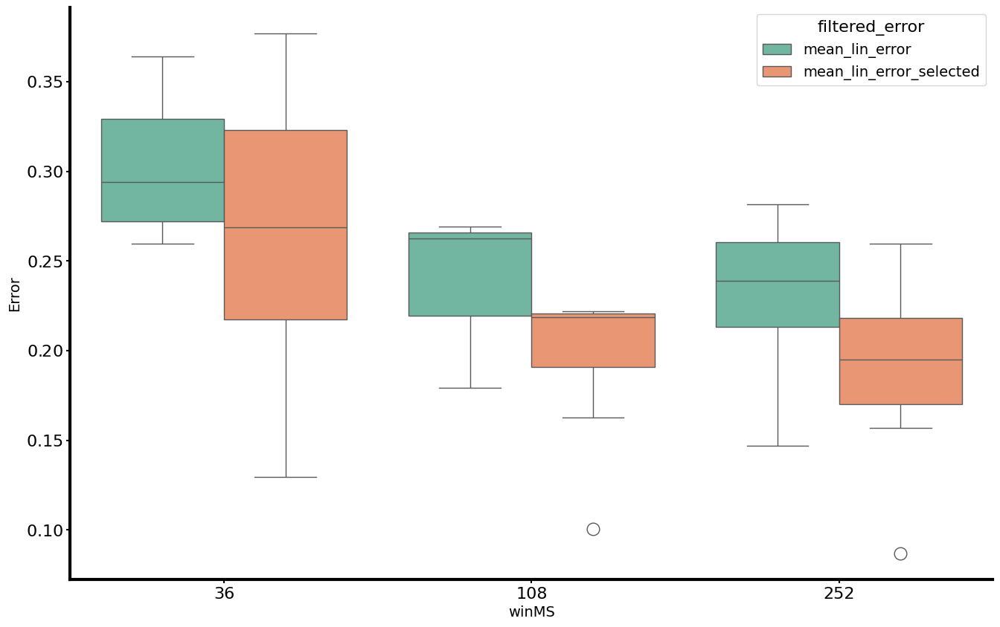

In [68]:
phase = "pre"
sub_df = loader_all.results_df[
    (loader_all.results_df["phase"] == phase)
    & (
        loader_all.results_df["nameExp"]
        == "STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"
    )
].copy()
long_df = pd.melt(
    sub_df,
    id_vars=["mouse", "winMS"],
    value_vars=["mean_lin_error", "mean_lin_error_selected"],
    var_name="filtered_error",
    value_name="Error",
)
sns.boxplot(data=long_df, x="winMS", y="Error", hue="filtered_error", palette="Set2")
plt.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_selected.png"), dpi=300)
plt.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_selected.svg"), dpi=300)

In [ ]:
sns.boxplot(
    loader_all.results_df.query("winMS == 252"),
    x="phase",
    y="mean_lin_error_fast",
    hue="stride",
    palette="Set2",
    hue_order=["1", "2", "4"],
    order=["training", "pre", "cond", "post"],
)

plt.savefig(
    os.path.join(
        main_dir,
        "..",
        "Presentation",
        "boxplot_mean_lin_error_fast_per_phase_and_stride.png",
    ),
    dpi=300,
)
plt.savefig(
    os.path.join(
        main_dir,
        "..",
        "Presentation",
        "boxplot_mean_lin_error_fast_per_phase_and_stride.svg",
    ),
    dpi=300,
)

In [ ]:
sns.boxplot(
    loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast",
    hue="winMS",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
)

plt.savefig(
    os.path.join(
        main_dir,
        "..",
        "Presentation",
        "boxplot_mean_lin_error_fast_per_phase_and_winMS.png",
    ),
    dpi=300,
)
plt.savefig(
    os.path.join(
        main_dir,
        "..",
        "Presentation",
        "boxplot_mean_lin_error_fast_per_phase_and_winMS.svg",
    ),
    dpi=300,
)

In [ ]:
loader_all.results_df.keys()

In [ ]:
loader_all

In [ ]:
sub_df

FileNotFoundError: [Errno 2] No such file or directory: '/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Figures/CSI/../Presentation/boxplot_mean_lin_error_and_selected_and_bayes.png'

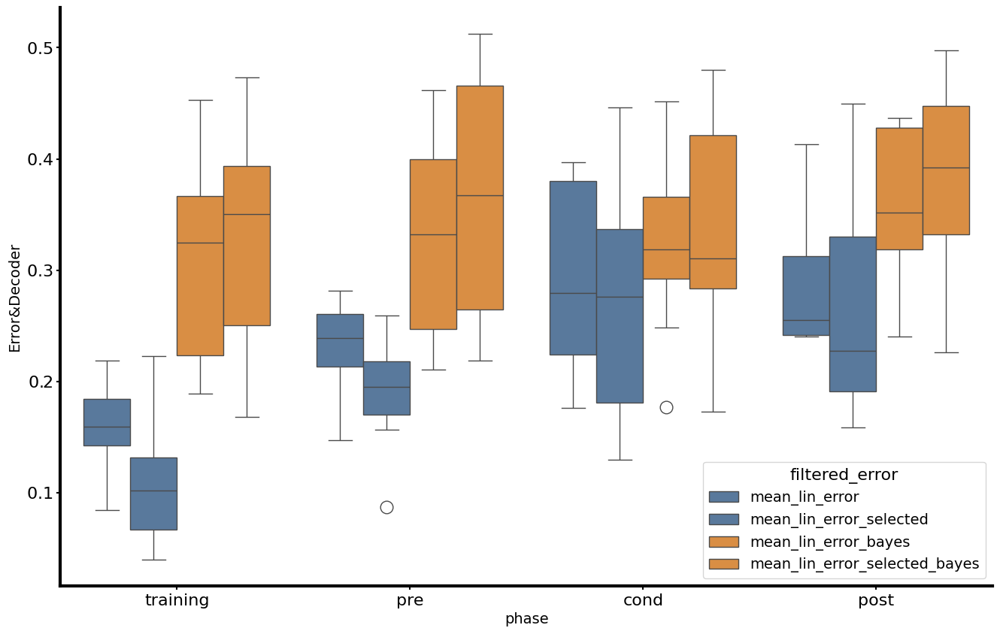

In [ ]:
stride = "4"
winMS = 252
nameExp_bayes = "new_4d_GaussianHeatMap_LinearLoss_Transformer"
sub_df = loader_all.results_df.query("stride == @stride & winMS == @winMS").copy()
bayes_df = loader_all.results_df.query(
    "nameExp == @nameExp_bayes & winMS == @winMS"
).reset_index(drop=True)
sub_df = sub_df.reset_index(drop=True)
sub_df["mean_lin_error_bayes"] = bayes_df["mean_lin_error_bayes"].values
sub_df["mean_lin_error_selected_bayes"] = bayes_df[
    "mean_lin_error_selected_bayes"
].values

long_df = pd.melt(
    sub_df,
    id_vars=["mouse", "phase"],
    value_vars=[
        "mean_lin_error",
        "mean_lin_error_selected",
        "mean_lin_error_bayes",
        "mean_lin_error_selected_bayes",
    ],
    var_name="filtered_error",
    value_name="Error&Decoder",
)
# custom palette, different colors for ann and bayes : give "mean_lin_error" and "mean_lin_error_selected" the same palette color, and "mean_lin_error_bayes" and "mean_lin_error_selected_bayes" another palette color
palette = {
    "mean_lin_error": "#4E79A7",  # blue (ANN)
    "mean_lin_error_selected": "#4E79A7",  # blue (ANN, same as above)
    "mean_lin_error_bayes": "#F28E2B",  # orange (Bayes)
    "mean_lin_error_selected_bayes": "#F28E2B",  # orange (Bayes, same as above)
}
sns.boxplot(
    data=long_df,
    x="phase",
    y="Error&Decoder",
    hue="filtered_error",
    palette=palette,
    order=["training", "pre", "cond", "post"],
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.png",
    )
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.svg",
    )
)
plt.show()

In [ ]:
loader_all.hist2d_linpred_vs_bayes(
    suffixes=["_pre"],
    mode="full",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    folder=main_dir,
    winMS_list=[252],
)

In [ ]:
from matplotlib.colors import Normalize

corr = (
    loader_all.results_df.query("phase == 'pre'")
    .drop(columns="real_asymmetry_ratio")
    .corr(numeric_only=True)
)
sns.heatmap(
    corr,
    xticklabels=corr.columns.values,
    yticklabels=corr.columns.values,
    cmap="coolwarm",
    norm=Normalize(vmin=-1, vmax=1),
)
plt.savefig(os.path.join(main_dir, "correlation_matrix_all_pre.png"), dpi=300)

In [381]:
from pathlib import Path

loader_all.save(
    path=os.path.join(
        Path.home(),
        "Documents",
        "Theotime",
        "DimaERC2",
        "neuroencoders_1021",
        "_work",
        "STRIDE1_2_and_4_GaussianHeatmap_results_all_CSI_22092025.pickle",
    )
)

# end for today - let's sleep

# let's start again

In [26]:
import seaborn as sns

In [27]:
loader_all.results_df["mouse_manipe"] = (
    loader_all.results_df["mouse"] + "_" + loader_all.results_df["manipe"]
)

In [28]:
loader_all.results_df["mouse_manipe"].unique()

array(['1162_MFB', '1199_PAG', '1230_Novel', '1230_Known', '1239_MFB',
       '994_PAG'], dtype=object)

In [29]:
loader_all.results_df.query(
    "ann_mode == 'Transformer' & phase != 'cond'"
).mouse.unique()

array(['1162', '1199', '1230', '1239', '994'], dtype=object)

In [30]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linPred', 'fullPred',
       'truePos', 'linTruePos', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'mean_error', 'lin_error',
       'predLossThreshold', 'mean_error_selected', 'lin_error_selected',
       'asymmetry_index_on_predicted', 'asymmetry_index_on_selected_predicted',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asymmetry_ratio_normalized',
       'selected_predicted_asymmetry_ratio_normalized',
       'true_binary_direction', 'predicted_binary_di

In [31]:
loader_all.results_df["results"].iloc[0]

Mouse_Results(mouse_name=1162, manipe=MFB, name_exp=STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, target=pos, phase=cond, path=/media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1162_MFB, windows=['252'])

In [32]:
loader_all.results_df.query("winMS == 108")["results"].iloc[0]

Mouse_Results(mouse_name=1199, manipe=PAG, name_exp=STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, target=pos, phase=cond, path=/media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1199_PAG, windows=['36', '108', '252'])

In [33]:
good_nameExp = "STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"

In [34]:
loader_all.results_df.query("winMS == 252 and stride == '4' and phase == 'pre'")

UndefinedVariableError: name 'stride' is not defined

In [35]:
# drop duplicates bases on (nameExp, mouse, manipe, phase, winMS) and keep the first
tmp_df = loader_all.results_df.drop_duplicates(
    subset=["nameExp", "mouse", "manipe", "phase", "winMS"]
).copy()
loader_all.results_df = tmp_df
tmp_df.query("winMS == 252 and stride == '4' and phase == 'pre'")

UndefinedVariableError: name 'stride' is not defined

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1162, MFB, cond, 252


/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:1061: RuntimeWarning: divide by zero encountered in divide
  
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:1061: RuntimeWarning: invalid value encountered in divide
  
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:1088: RuntimeWarning: divide by zero encountered in divide
  
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:1088: RuntimeWarning: invalid value encountered in divide
  


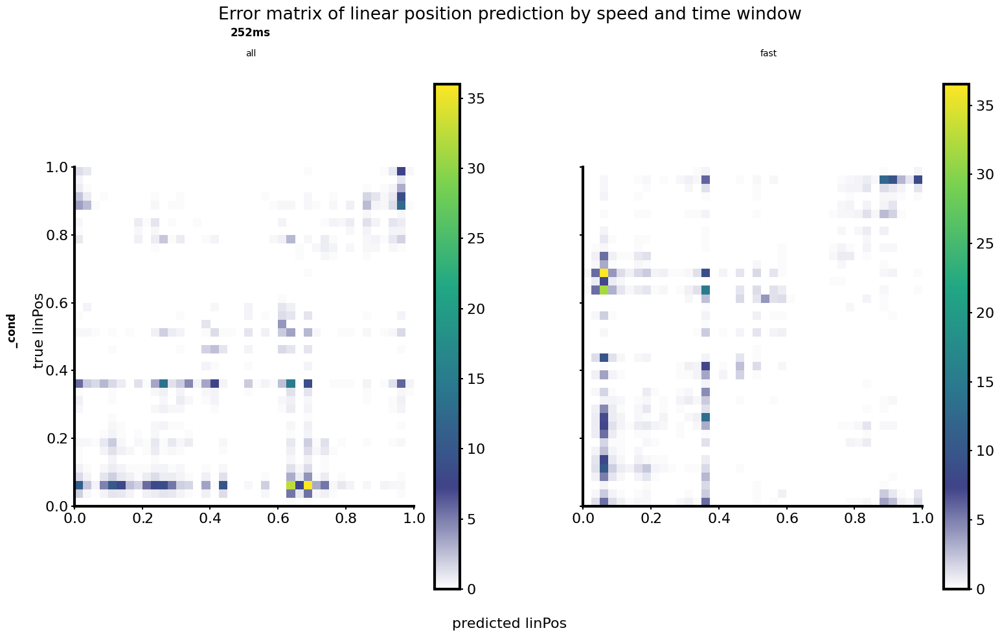

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1162, MFB, post, 252


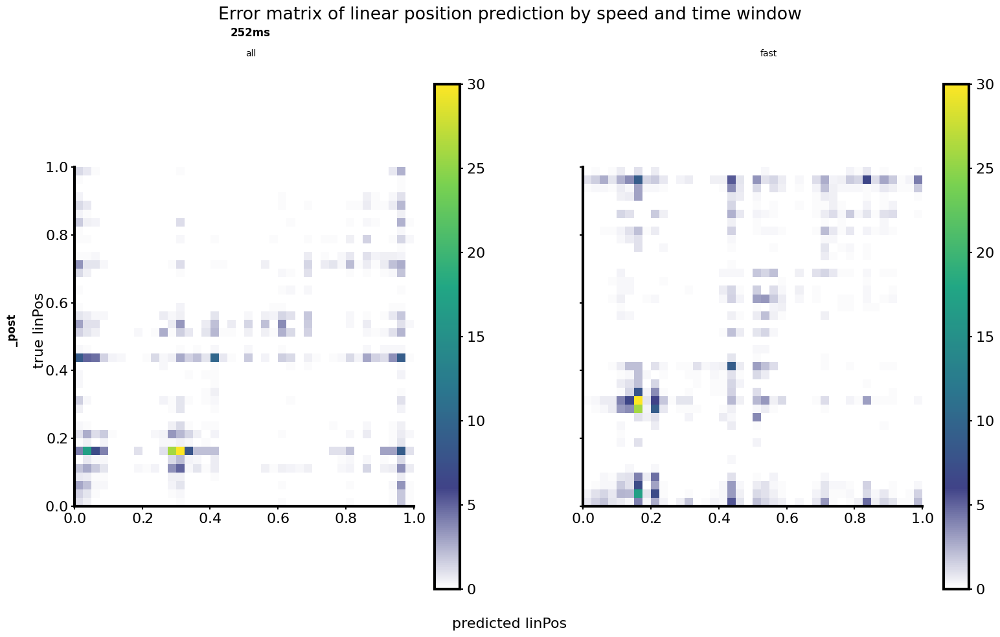

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1162, MFB, pre, 252


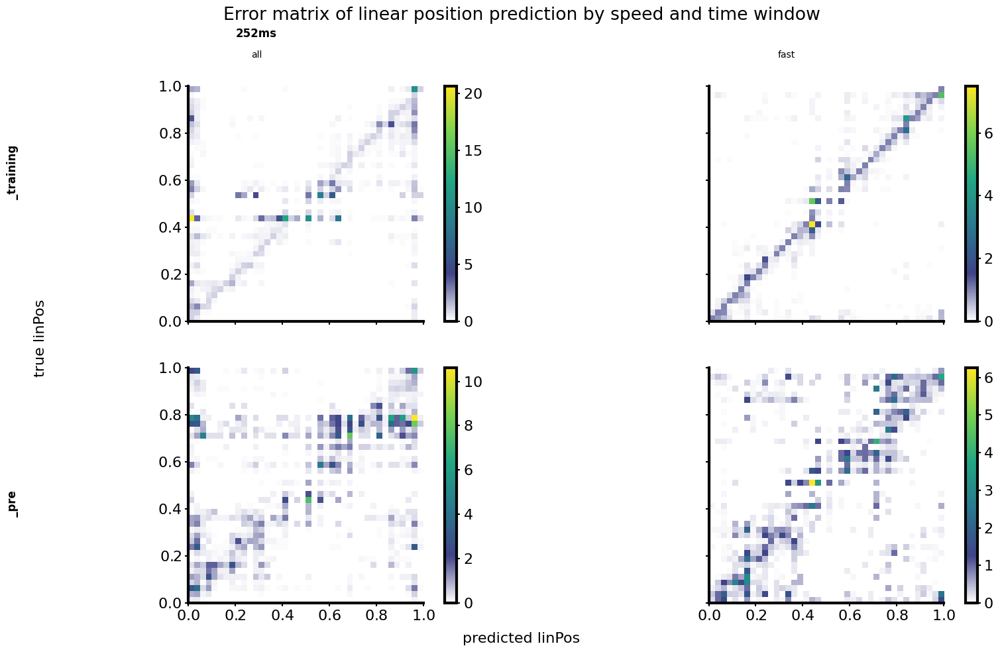

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1162, MFB, training, 252


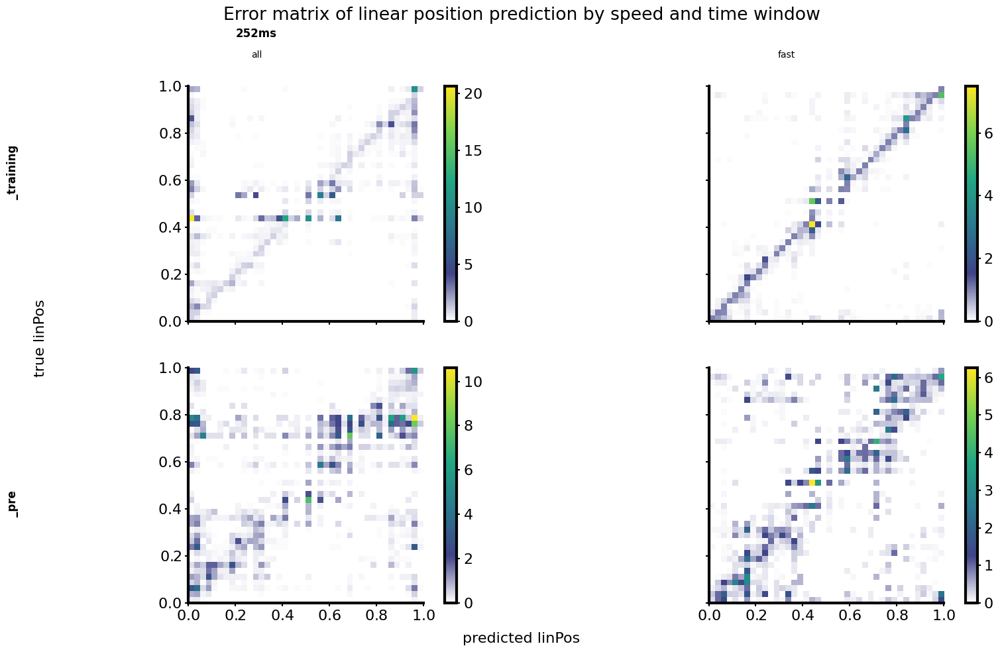

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1199, PAG, cond, 252


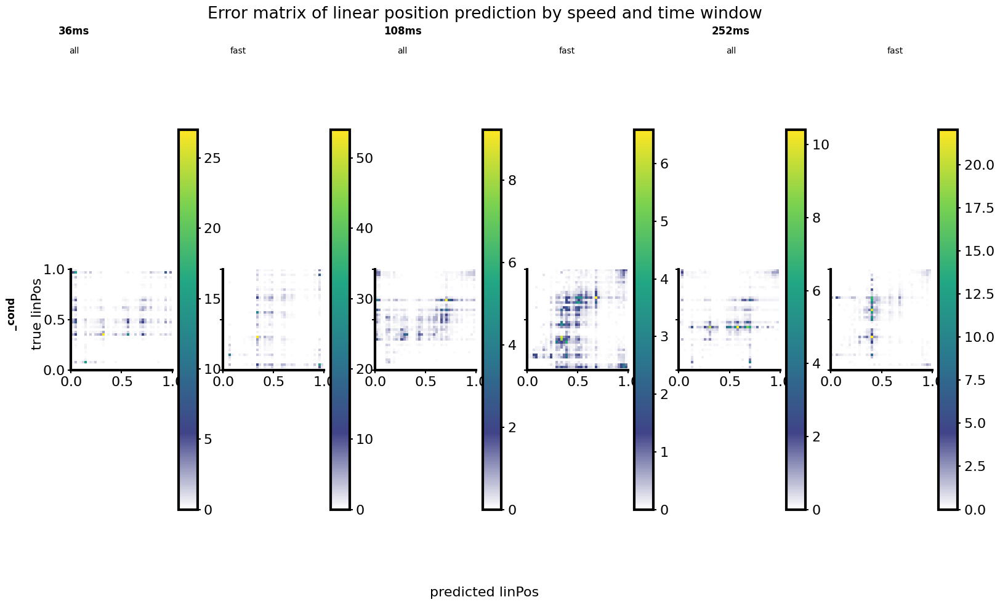

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1199, PAG, post, 252


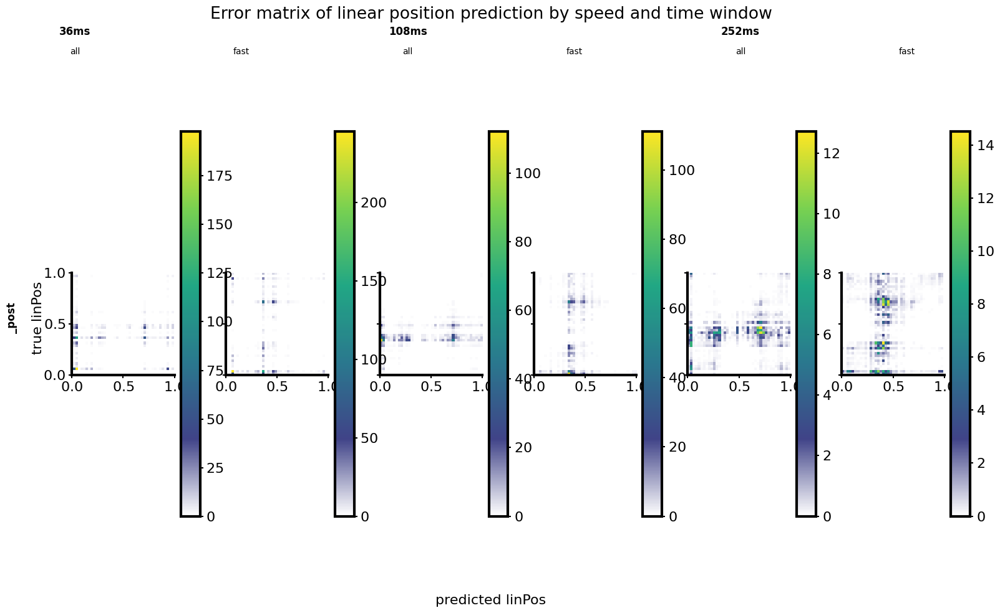

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1199, PAG, pre, 252


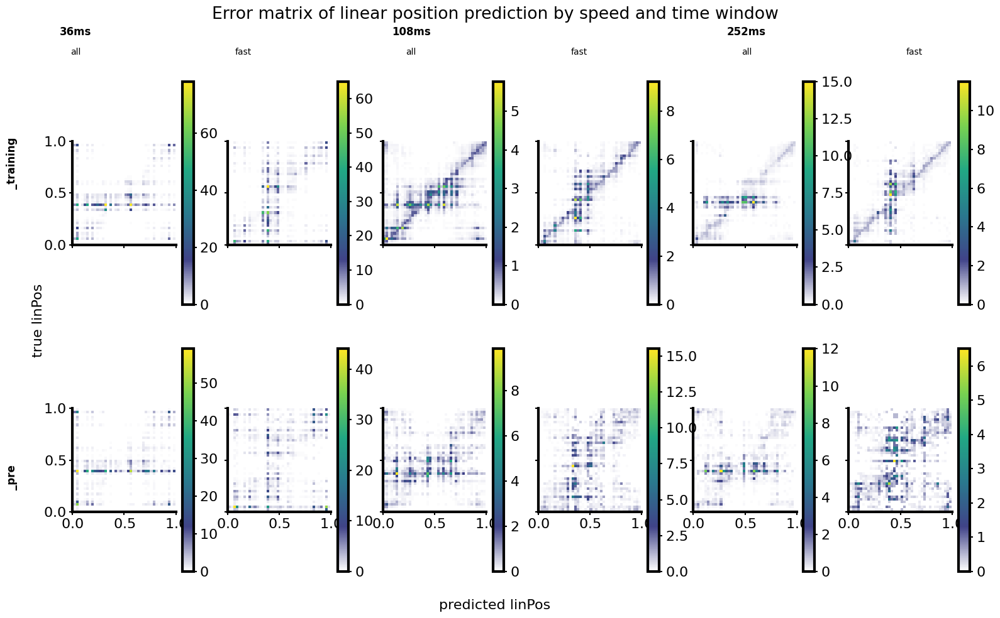

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1199, PAG, training, 252


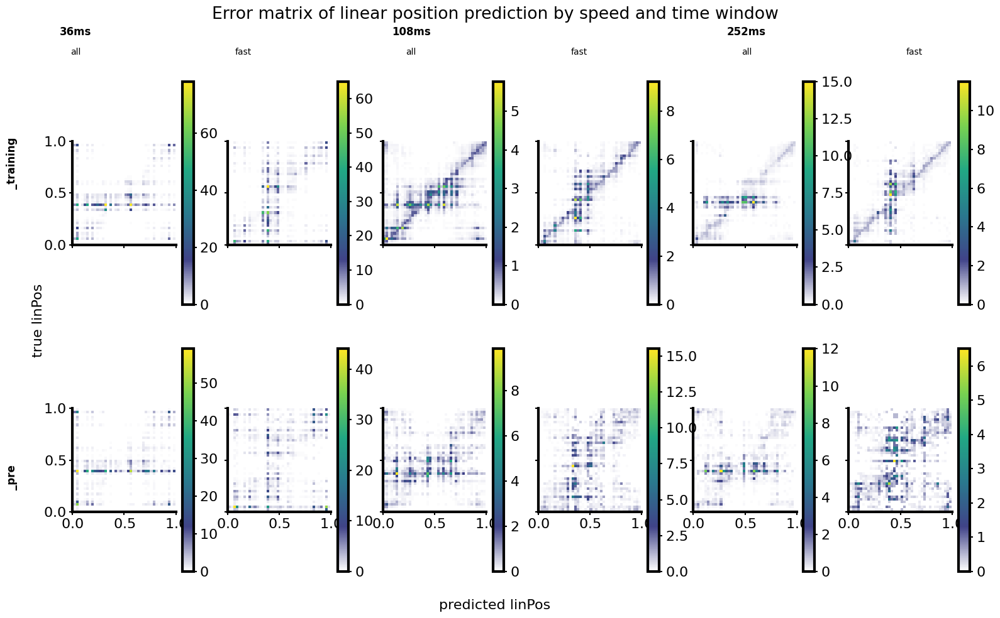

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Known, cond, 252


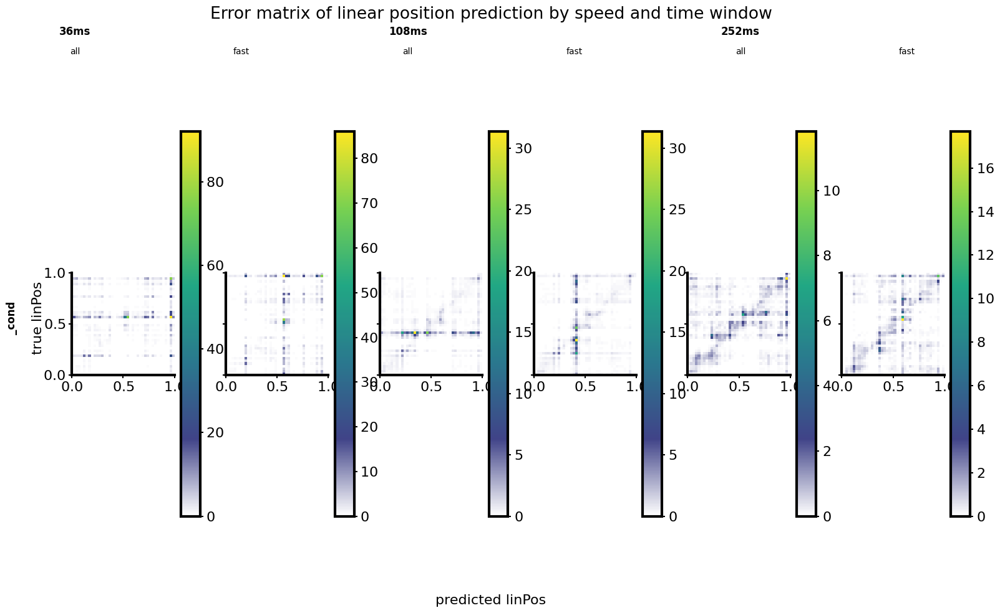

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Known, post, 252


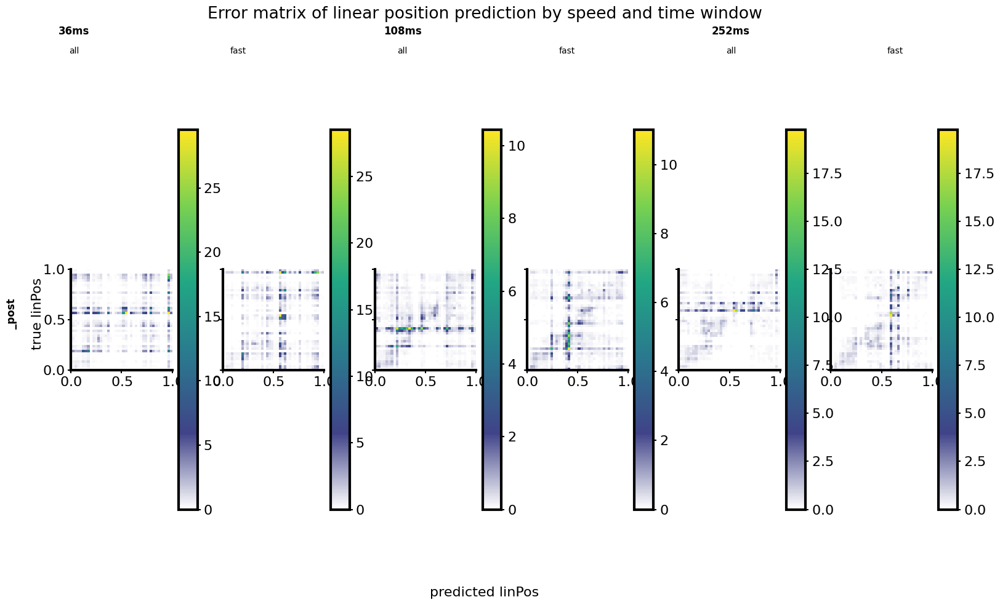

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Known, pre, 252


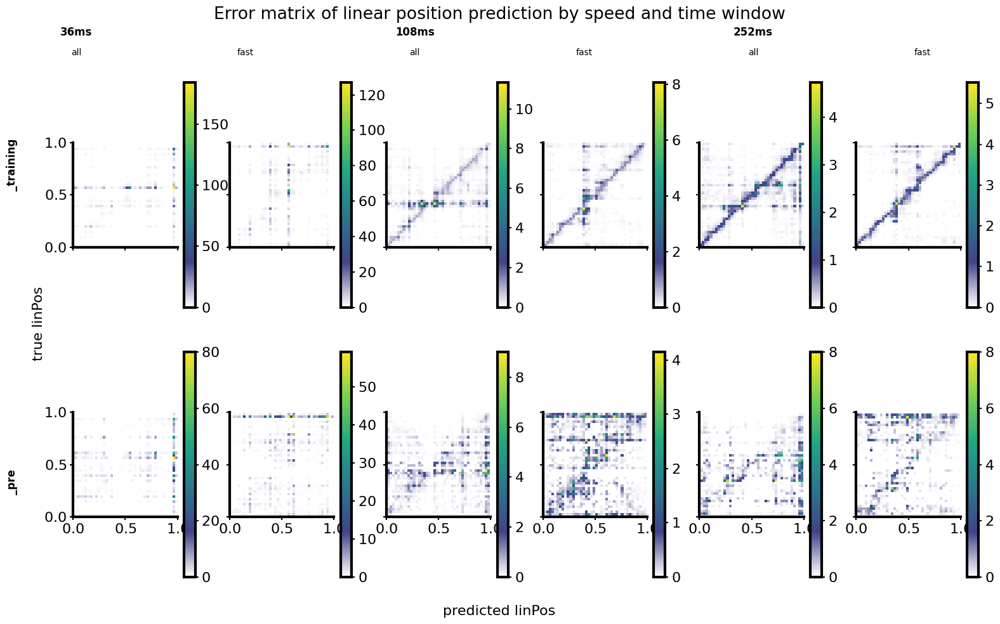

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Known, training, 252


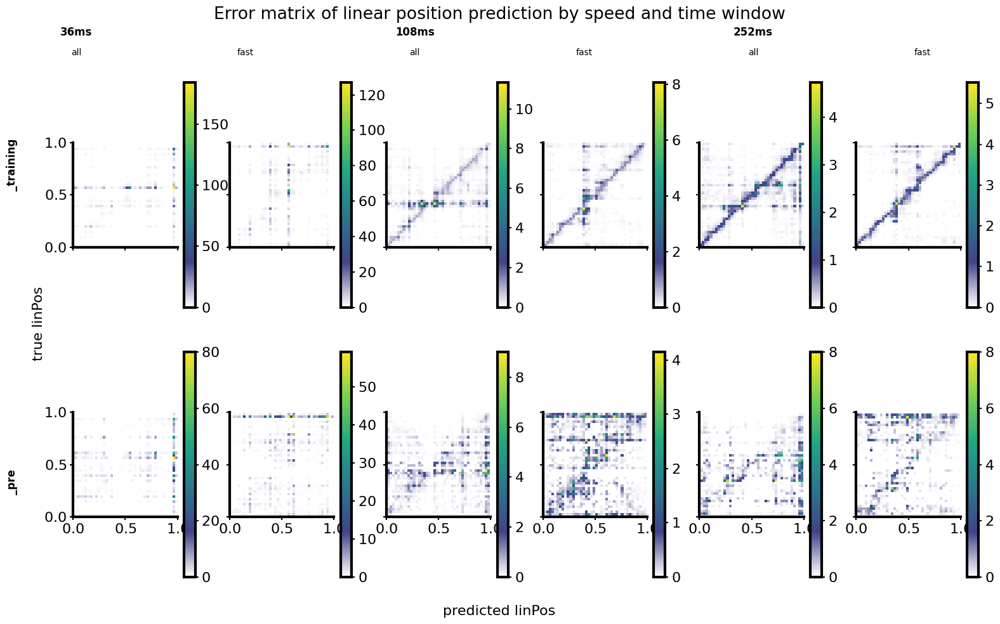

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Novel, cond, 252


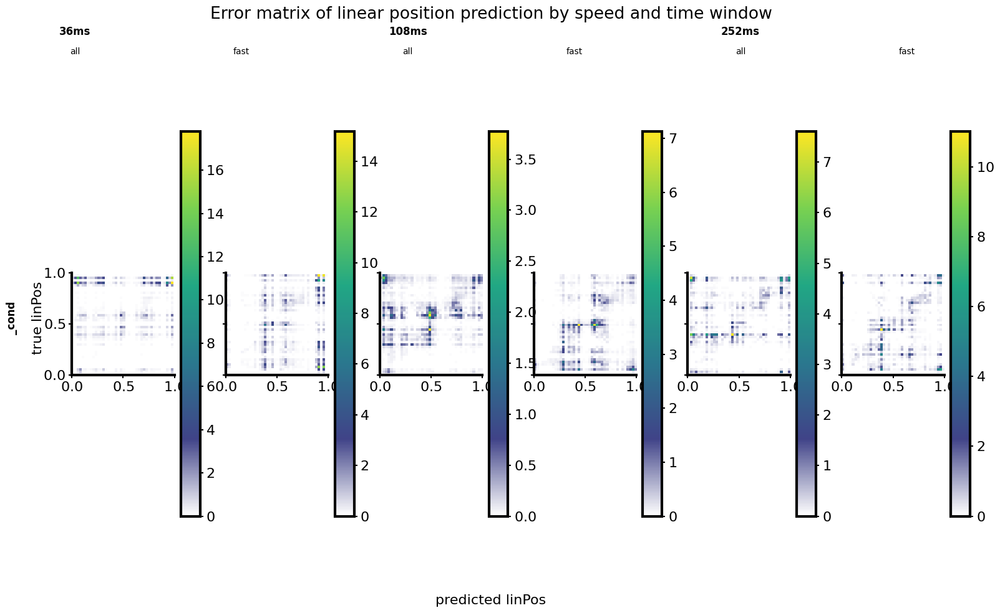

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Novel, post, 252


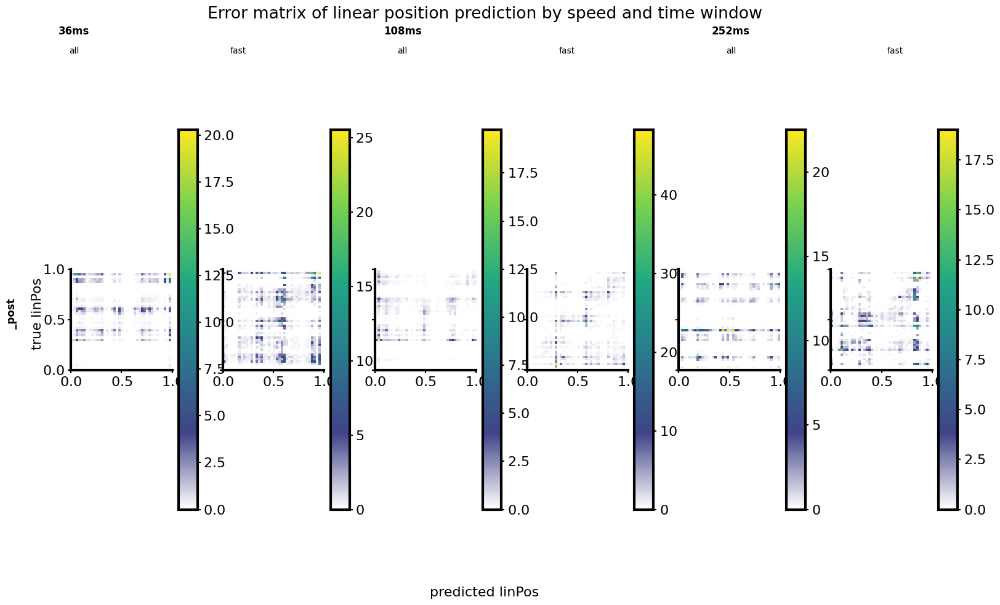

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Novel, pre, 252


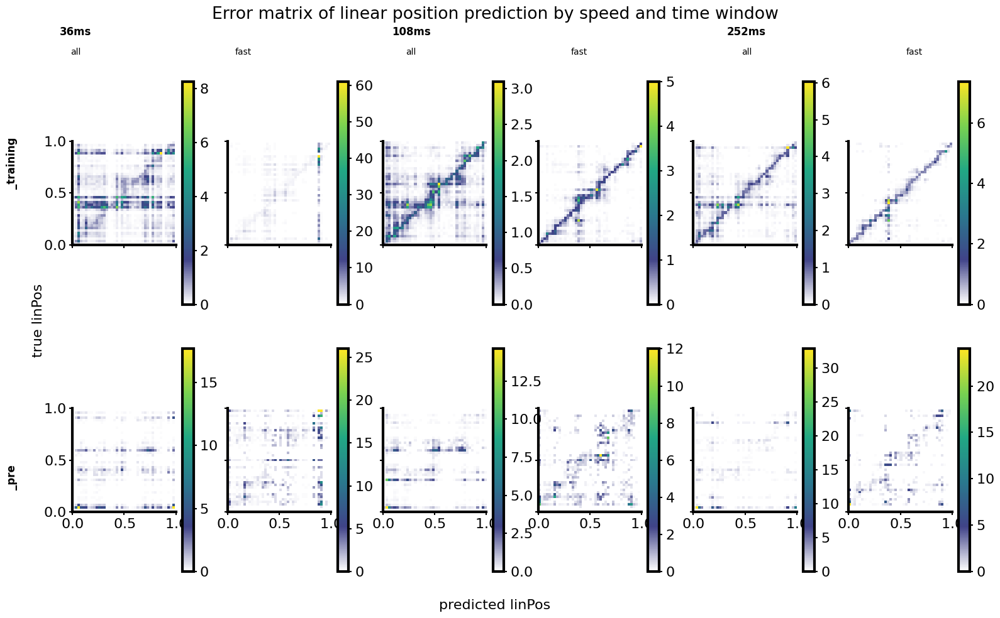

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1230, Novel, training, 252


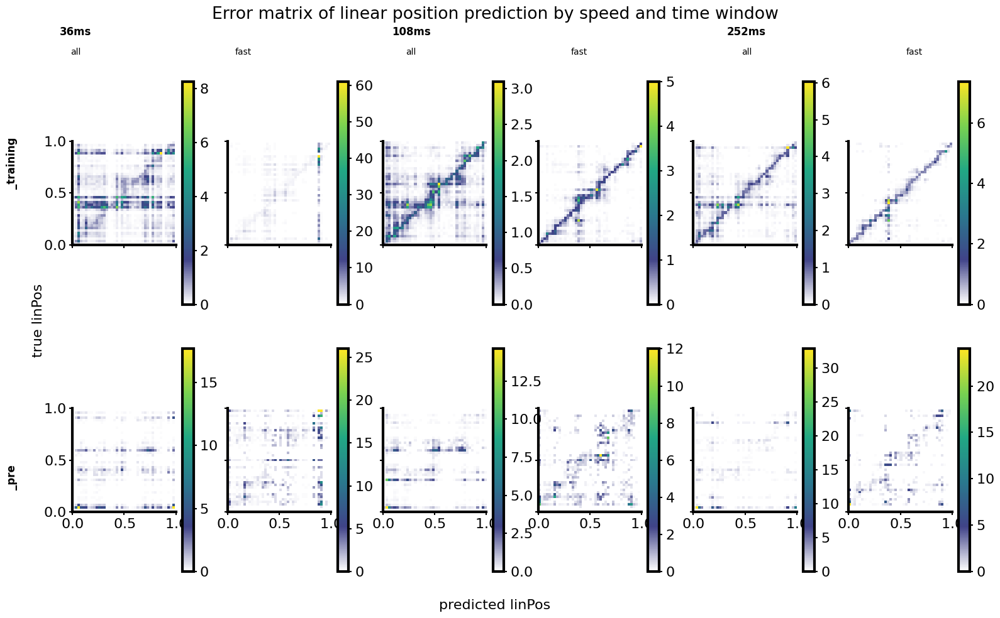

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1239, MFB, cond, 252


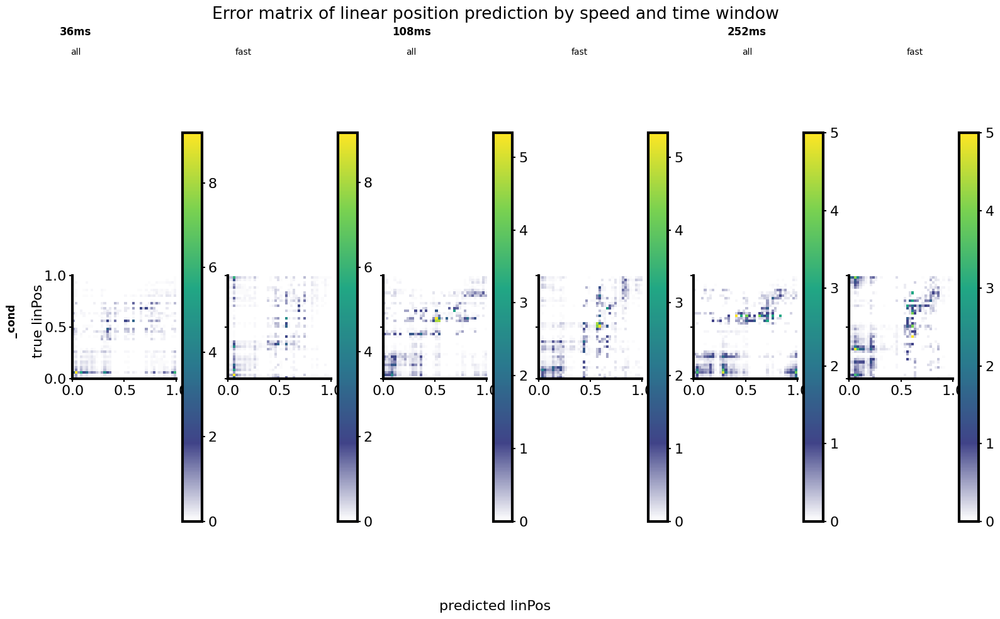

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1239, MFB, post, 252


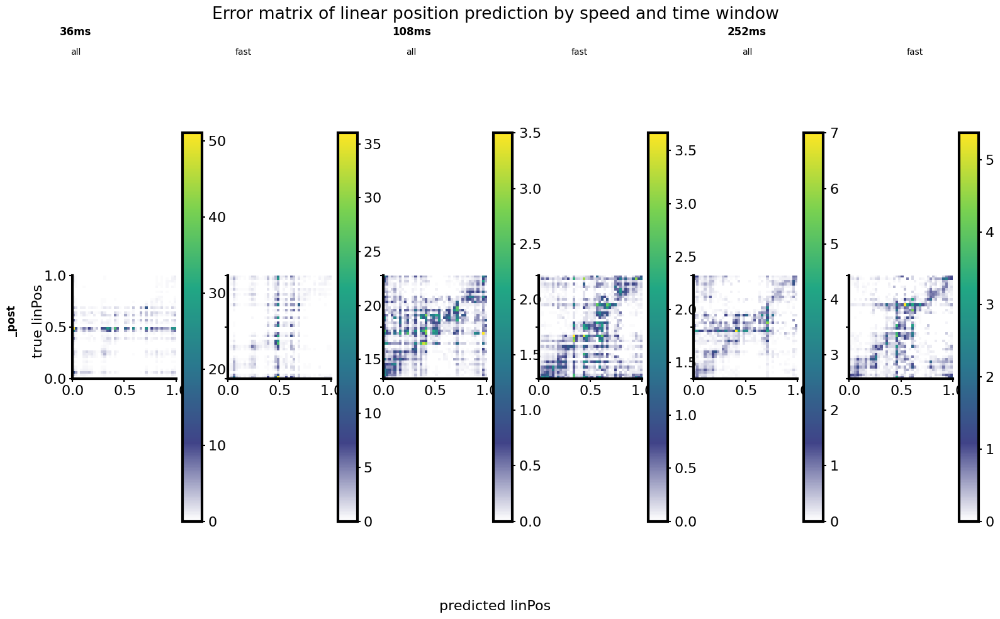

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1239, MFB, pre, 252


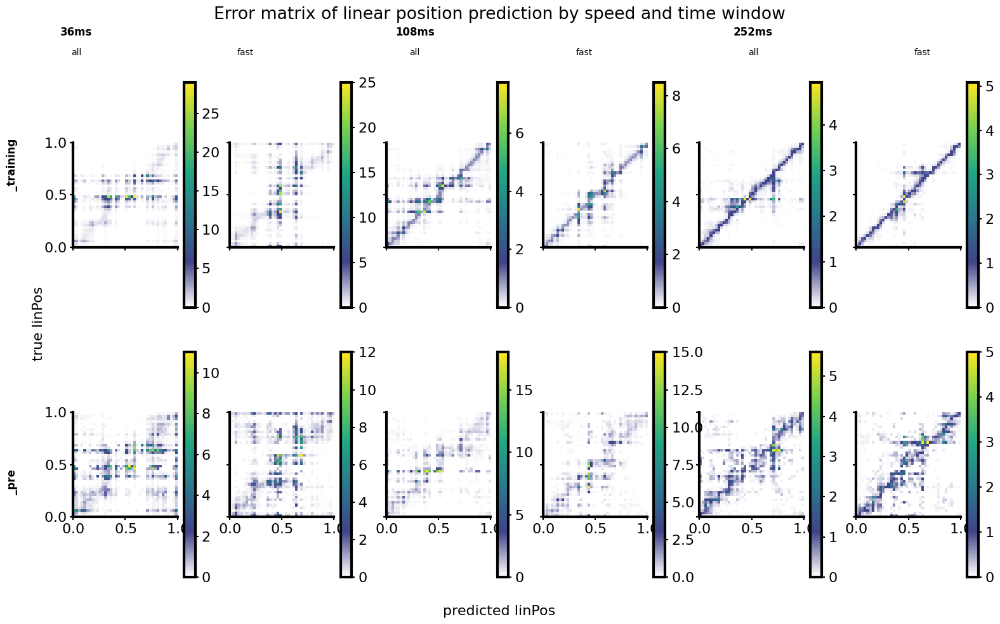

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 1239, MFB, training, 252


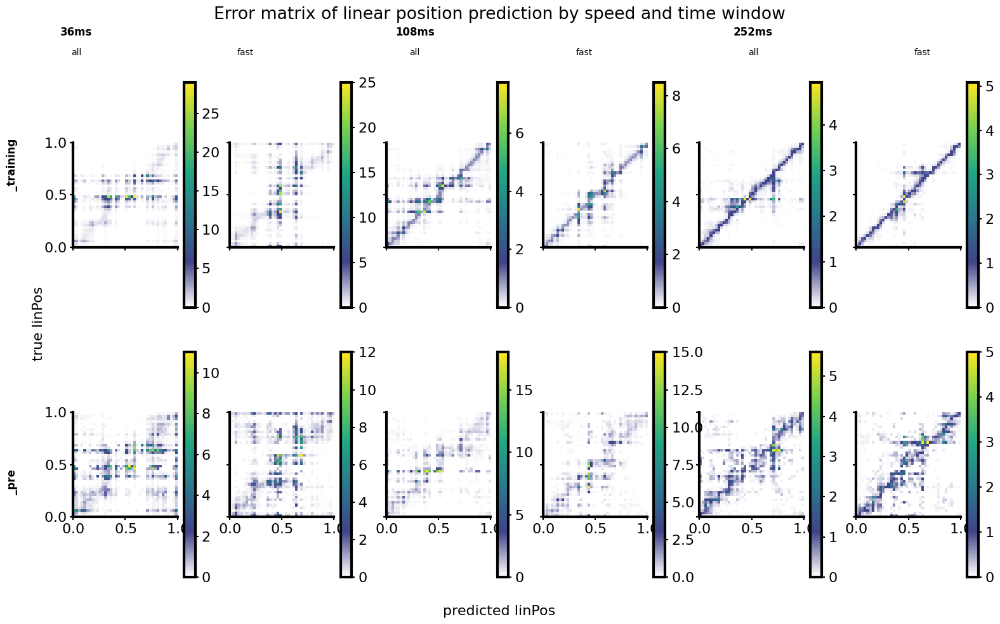

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 994, PAG, cond, 252


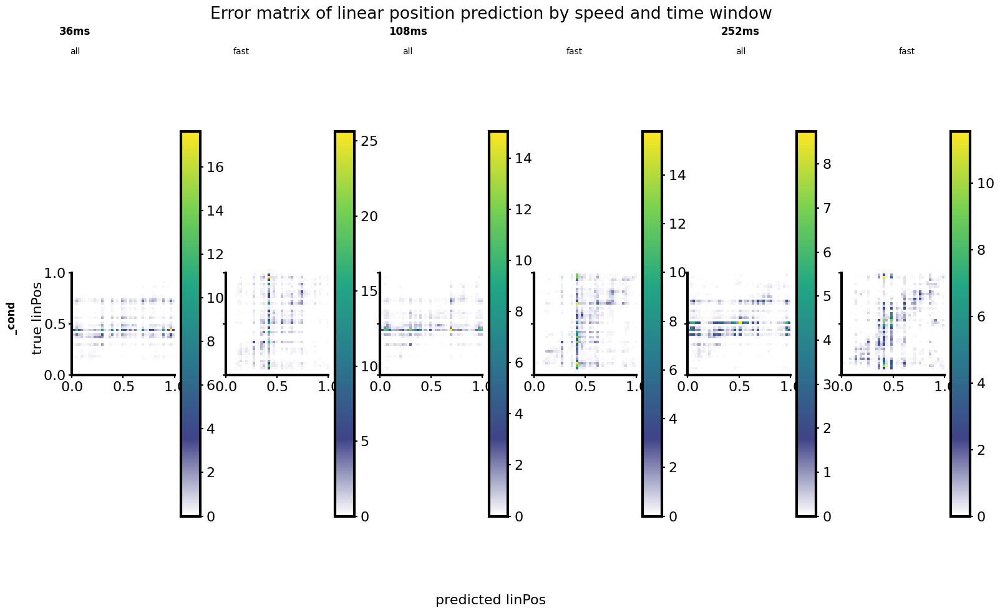

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 994, PAG, post, 252


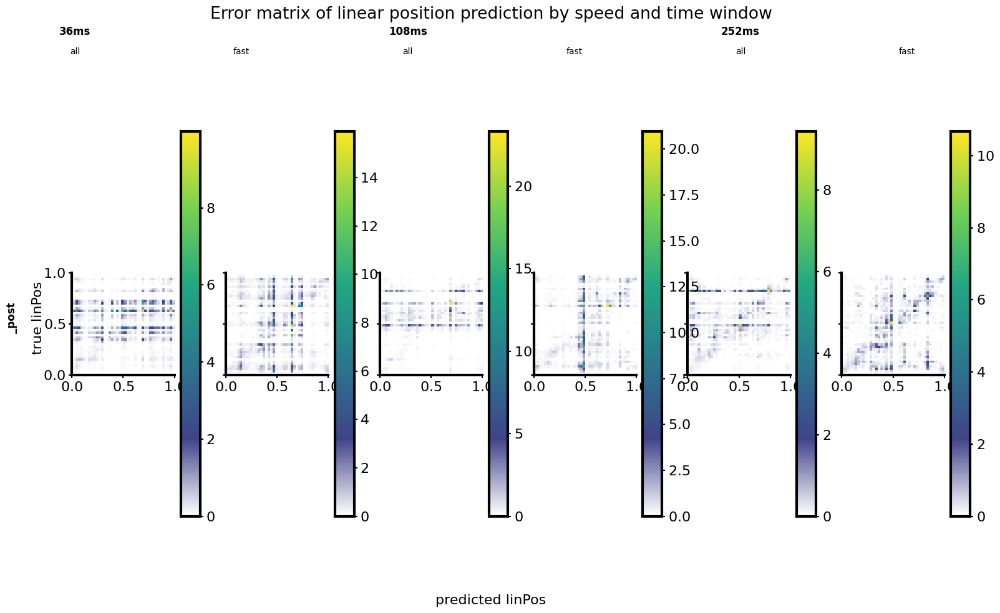

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 994, PAG, pre, 252


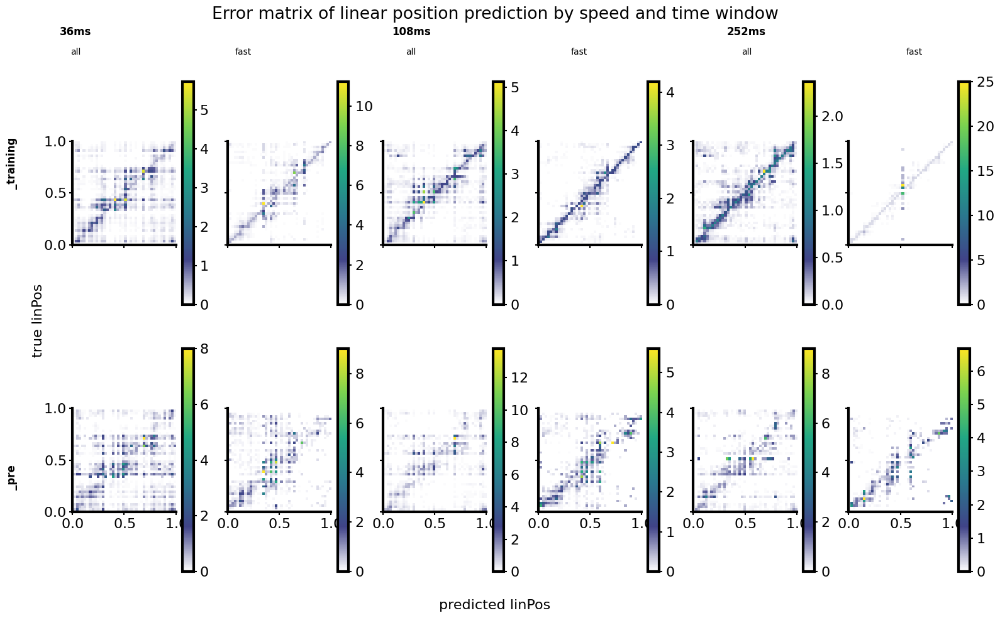

Processing STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer, 994, PAG, training, 252


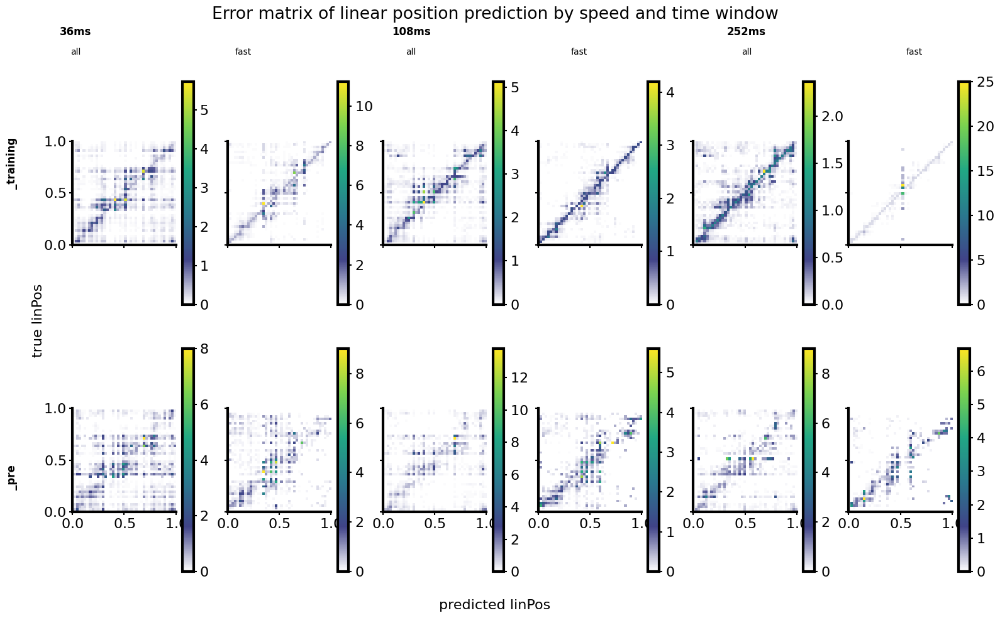

In [45]:
for (nameExp, mouse, manipe, phase, winMS), group in loader_all.results_df.query(
    "nameExp == 'STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer' and winMS == 252"
).groupby(["nameExp", "mouse", "manipe", "phase", "winMS"]):
    for row in group.itertuples():
        print(f"Processing {nameExp}, {mouse}, {manipe}, {phase}, {winMS}")
        row.results.error_matrix_linerrors_by_speed(show=True)

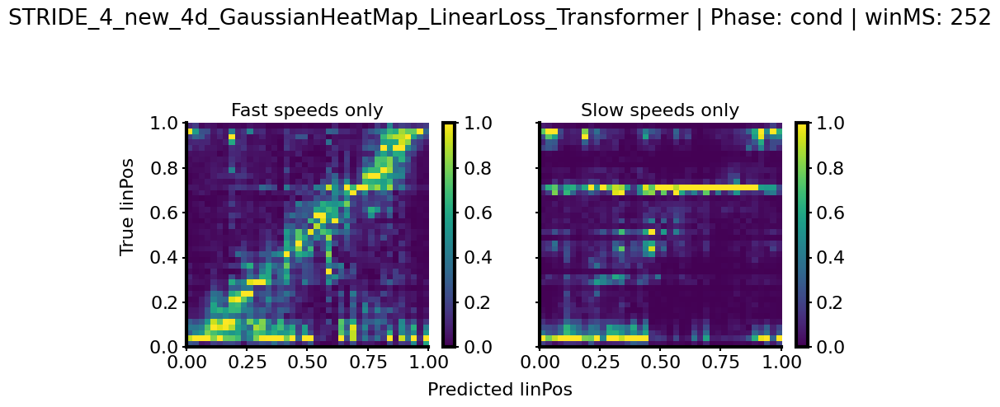

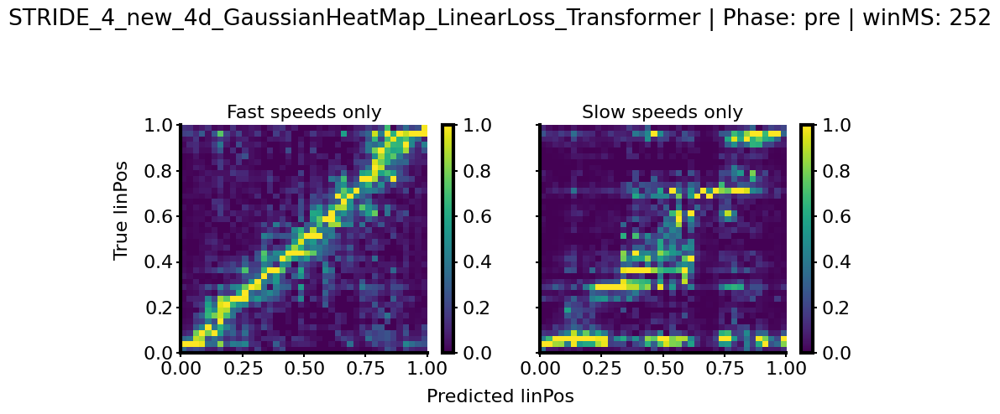

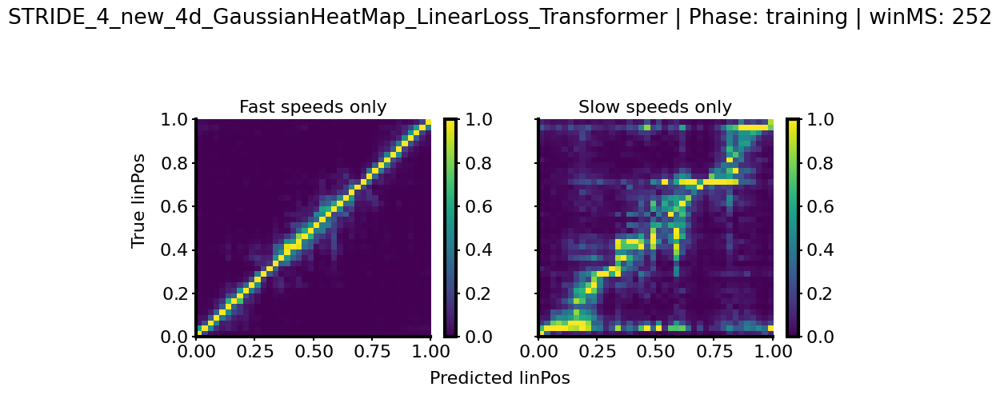

In [38]:
loader_all.mean_error_matrix_linerrors_by_speed(
    normalized=True,
    show=True,
    winMS_list=252,
    nameExp_list=good_nameExp,
    phase_list=["training", "pre", "cond"],
    folder=main_dir,
)

In [ ]:
loader_all.plot_ann_pred_by_stride_and_phase(
    phase_list=["training", "pre"], stride_list=["2", "4"], show=True, folder=main_dir
)

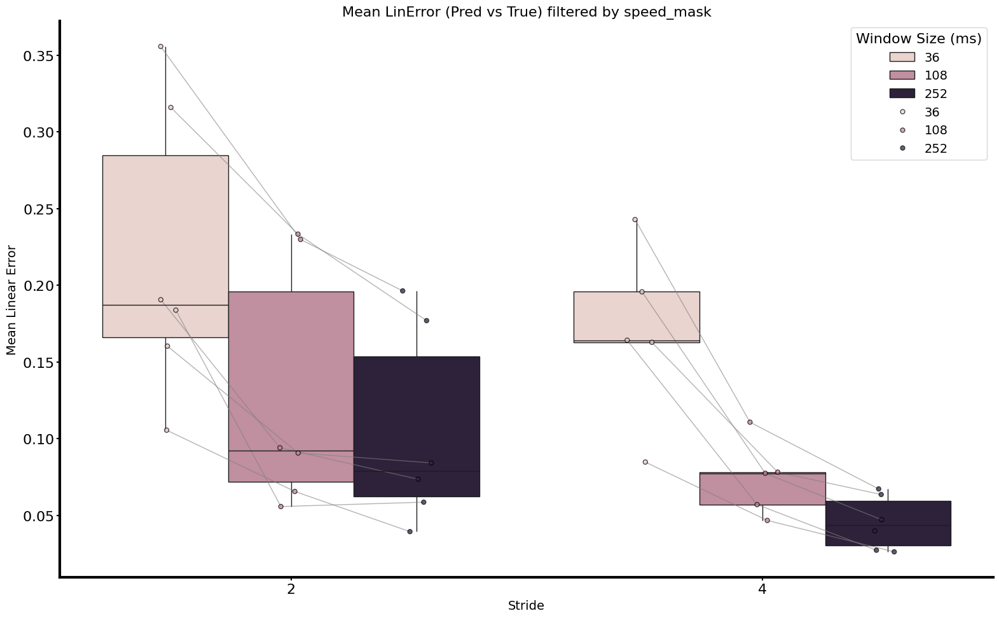

In [31]:
loader_all.plot_ann_pred_by_stride_and_winMS(
    phase_list="training", stride_list=["2", "4"], show=True
)

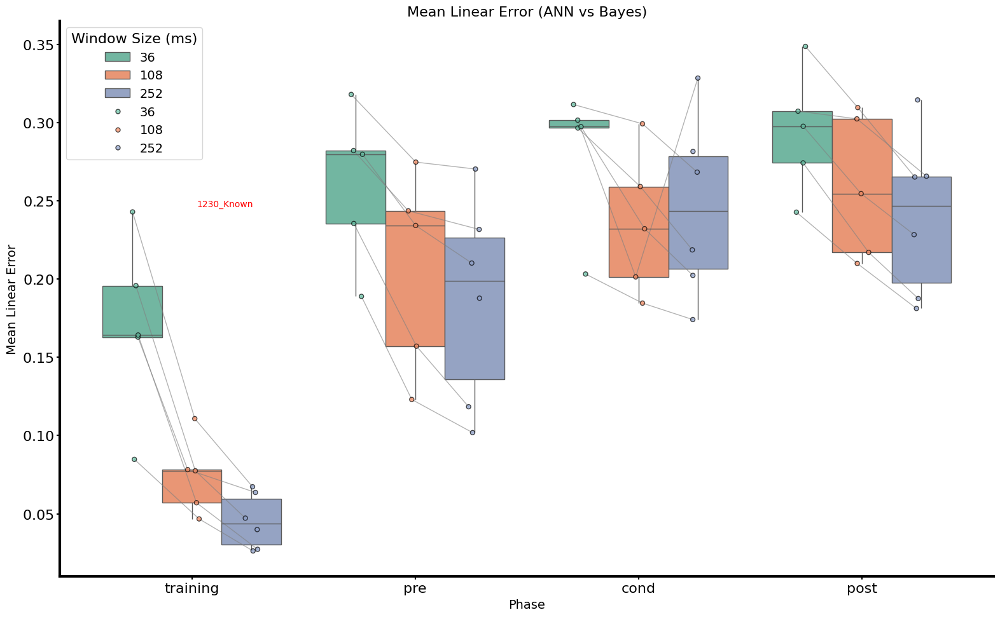

,mouse_manipe,phase,winMS,stride,mean_error
0,1162_MFB,cond,252,4,0.281532
1,1162_MFB,post,252,4,0.314463
2,1162_MFB,pre,252,4,0.187758
3,1162_MFB,training,252,4,0.039901
4,1199_PAG,cond,36,4,0.296499
...,...,...,...,...,...
59,994_PAG,pre,108,4,0.123025
60,994_PAG,pre,252,4,0.101851
61,994_PAG,training,36,4,0.084765
62,994_PAG,training,108,4,0.046702


In [32]:
loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"], stride_list=["4"], show=True
)

In [87]:
??np.random.permutation

Docstring:
permutation(x)

Randomly permute a sequence, or return a permuted range.

If `x` is a multi-dimensional array, it is only shuffled along its
first index.

.. note::
    New code should use the
    `~numpy.random.Generator.permutation`
    method of a `~numpy.random.Generator` instance instead;
    please see the :ref:`random-quick-start`.

Parameters
----------
x : int or array_like
    If `x` is an integer, randomly permute ``np.arange(x)``.
    If `x` is an array, make a copy and shuffle the elements
    randomly.

Returns
-------
out : ndarray
    Permuted sequence or array range.

See Also
--------
random.Generator.permutation: which should be used for new code.

Examples
--------
>>> np.random.permutation(10)
array([1, 7, 4, 3, 0, 9, 2, 5, 8, 6]) # random

>>> np.random.permutation([1, 4, 9, 12, 15])
array([15,  1,  9,  4, 12]) # random

>>> arr = np.arange(9).reshape((3, 3))
>>> np.random.permutation(arr)
array([[6, 7, 8], # random
       [0, 1, 2],
       [3, 4, 5]])


In [172]:
loader_all.results_df["results"].iloc[0].ann["252"].GaussianHeatmap.get_allowed_mask()
true_position = (
    loader_all.results_df["results"]
    .iloc[0]
    .positions[:, :2][
        loader_all.results_df["results"].iloc[0].fullBehavior["Times"]["speedFilter"]
    ]
)
pred_position = np.random.uniform(0, 1, size=true_position.shape)
# remove the ones outside the allowed mask
# convert the 45x45 mask in [O,1] coordinates to a (x,y) coordinates
allowed_mask = (
    loader_all.results_df["results"]
    .iloc[0]
    .ann["252"]
    .GaussianHeatmap.get_allowed_mask()
    .T
)
allowed_coords = np.argwhere(allowed_mask)
allowed_coords = (allowed_coords + 0.5) / 45  # center of each bin
# for each pred_position, find the closest allowed_coords
filtered_pred_position = []
for pos in pred_position:
    dists = np.linalg.norm(allowed_coords - pos, axis=1)
    closest_idx = np.argmin(dists)
    filtered_pred_position.append(allowed_coords[closest_idx])
filtered_pred_position = np.array(filtered_pred_position)

(array([[1030.,  868., 1096.,  900.,  887., 1052.,  908., 1080.,  916.,
         1081.],
        [ 925.,  758.,  892.,  705.,  684.,  853.,  659.,  880.,  717.,
          882.],
        [1084.,  942., 2524., 3061., 1385., 2807., 1876., 1878.,  829.,
         1117.],
        [1777., 1479.,    0.,    0.,    0.,    0.,    0.,  700., 1260.,
          941.],
        [   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0., 1033.,
          841.],
        [   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0., 1838.,
         1094.],
        [2011., 1578., 2125., 3111.,    0.,    0.,    0.,    0., 1309.,
          903.],
        [1119.,  950., 1077.,  873., 1900., 2216.,  997., 2906.,  885.,
         1087.],
        [ 907.,  718.,  888.,  719.,  699.,  937.,  703.,  892.,  669.,
          878.],
        [1097.,  863., 1137.,  862.,  899., 1146.,  899., 1108.,  936.,
         1112.]]),
 array([0.01111111, 0.10888889, 0.20666667, 0.30444444, 0.40222222,
        0.5       , 0.59777778, 0.695555

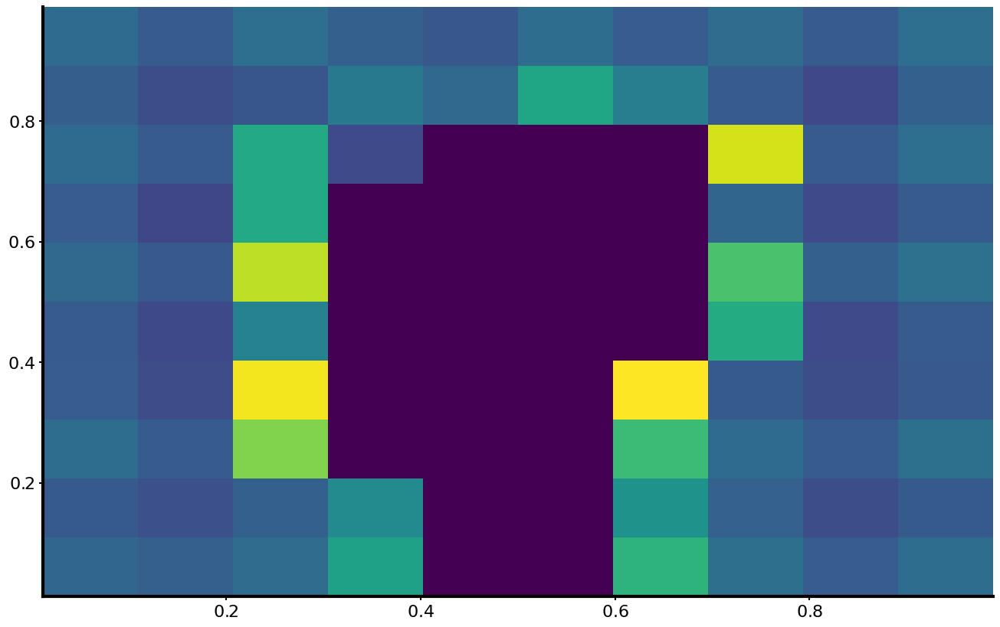

In [175]:
plt.hist2d(filtered_pred_position[:, 0], filtered_pred_position[:, 1])

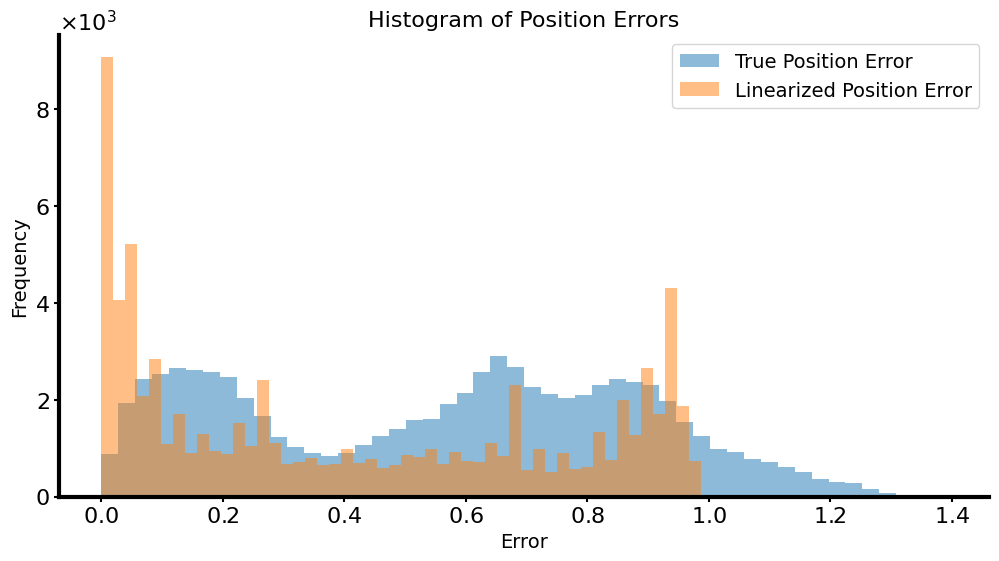

In [124]:
true_position = (
    loader_all.results_df["results"]
    .iloc[0]
    .positions[:, :2][
        loader_all.results_df["results"].iloc[0].fullBehavior["Times"]["speedFilter"]
    ]
)
true_position = true_position[~np.isnan(true_position).any(axis=1)]

# random chance by simply shuffling positions
random_position = np.random.permutation(true_position)

# apply lin function
lin_true = loader_all.results_df["results"].iloc[0].l_function(true_position)[1]
lin_random = loader_all.results_df["results"].iloc[0].l_function(random_position)[1]
# compute error
error_true = np.linalg.norm(true_position - random_position, axis=1)
error_lin = np.abs(lin_true - lin_random)

# plot histogram of errors
plt.figure(figsize=(12, 6))
plt.hist(error_true, bins=50, alpha=0.5, label="True Position Error")
plt.hist(error_lin, bins=50, alpha=0.5, label="Linearized Position Error")
plt.xlabel("Error")
plt.ylabel("Frequency")
plt.title("Histogram of Position Errors")
plt.legend()

In [127]:
np.median(error_lin)

0.32056194408388355

In [157]:
chance_level_mean = np.mean(error_lin)
chance_level_median = np.median(error_lin)

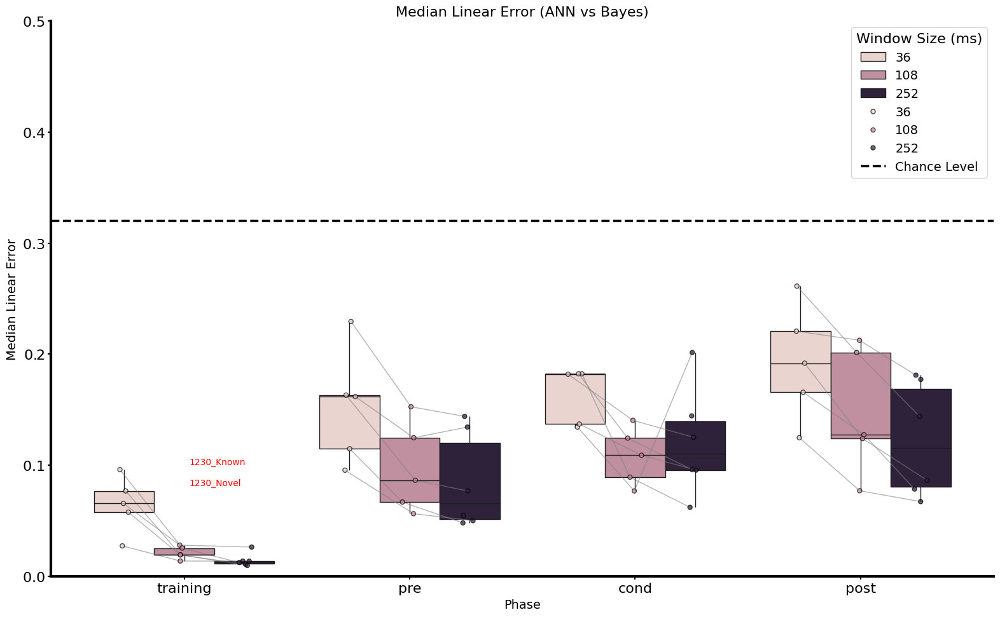

In [176]:
fig, ax = plt.subplots()
err_df = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    show=True,
    ax=ax,
    chance_level=chance_level_median,
    palette=None,
)
fig.savefig(
    os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level.png"), dpi=300
)
fig.savefig(
    os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level.svg"), dpi=300
)

In [44]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.colors import qualitative

# --- After computing err_df as in your original code ---
phase_list = ["training", "pre", "cond", "post"]
# Convert winMS to string to handle as categorical
err_df["winMS"] = err_df["winMS"].astype(str)
winMS_order = ["36", "108", "252"]
# Create interactive boxplot with scatter points
fig = px.box(
    err_df,
    x="phase",
    y="mean_error",
    color="winMS",
    points="all",  # show all points
    hover_data=["mouse_manipe", "winMS", "stride"],  # info on hover
    category_orders={
        "phase": phase_list
        if phase_list is not None
        else sorted(err_df["phase"].unique()),
        "winMS": ["36", "108", "252"],  # specify order for winMS
    },
)

# Colors for winMS lines
winMS_colors = {w: c for w, c in zip(winMS_order, qualitative.Plotly)}

# Connect points per mouse and winMS with color based on winMS
for mouse, sub in err_df.sort_values(
    "phase", key=lambda x: x.map({v: i for i, v in enumerate(phase_list)})
).groupby("mouse_manipe"):
    for winMS in winMS_order:
        sub_win = sub[sub["winMS"] == winMS]
        if len(sub_win) > 1:
            fig.add_trace(
                go.Scatter(
                    x=sub_win["phase"],
                    y=sub_win["mean_error"],
                    mode="lines+markers",
                    line=dict(color=winMS_colors[winMS], width=1),
                    marker=dict(size=6, opacity=0.6),
                    showlegend=False,
                )
            )

fig.update_layout(
    title="Mean Linear Error (Pred vs True) on Ground Truth",
    xaxis_title="Phase",
    yaxis_title="Mean Linear Error",
    boxmode="group",
)

fig.show()

In [57]:
loader_all.results_df

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,bayesPred,bayesLinPred,bayesProba,lin_error_bayes,lin_error_selected_bayes,mean_lin_error_bayes,mean_lin_error_selected_bayes,bayesProbThreshold,mean_lin_error_fast_bayes,mean_lin_error_fast_selected_bayes
0,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,36,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.1570132, 0.1570132, 0.1570132, 0.1570132, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.359372,0.320682,0.007615,0.362622,0.320793
1,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,108,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.33635974, 0.33635974, 0.33635974, 0.3363597...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.339872,0.318093,0.021378,0.339052,0.312953
2,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.330162,0.308225,0.057677,0.324653,0.294941
3,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.330162,0.308225,0.057677,0.324653,0.294941
4,STRIDE_2_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,36,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5321644044431648, 0.9915833623122323], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5212138509557749, 0.10908862861612689, 0.09...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.1570132, 0.1570132, 0.1570132, 0.1570132, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.359372,0.320682,0.007615,0.362622,0.320793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,training,108,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.802539763175163, 0.04998183919827476], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9863637793433644, 0.9863637793433644, 0.986...",...,"[[0.1, 0.011111111], [0.98888886, 0.18888889],...","[0.0, 0.9318178, 0.7, 0.63552254, 0.7267425, 0...","[0.058275133, 0.101591125, 0.023680672, 0.0385...","[0.98636377, 0.05454594, 0.28636378, 0.3508412...","[0.05454594, 0.972726, 0.98636377, 0.027272522...",0.280778,0.30821

In [58]:
err_df

,mouse_manipe,phase,winMS,stride,mean_error
0,1162_MFB,cond,252,4,0.281532
1,1162_MFB,post,252,4,0.314463
2,1162_MFB,pre,252,4,0.187758
3,1162_MFB,training,252,4,0.039901
4,1199_PAG,cond,36,4,0.296499
...,...,...,...,...,...
59,994_PAG,pre,108,4,0.123025
60,994_PAG,pre,252,4,0.101851
61,994_PAG,training,36,4,0.084765
62,994_PAG,training,108,4,0.046702


In [ ]:
stride = "4"
winMS = 252
nameExp_bayes = "new_4d_GaussianHeatMap_LinearLoss_Transformer"
sub_df = loader_all.results_df.query("stride == @stride & winMS == @winMS").copy()
bayes_df = loader_all.results_df.query(
    "nameExp == @nameExp_bayes & winMS == @winMS"
).reset_index(drop=True)
sub_df = sub_df.reset_index(drop=True)
sub_df["mean_lin_error_bayes"] = bayes_df["mean_lin_error_bayes"].values
sub_df["mean_lin_error_selected_bayes"] = bayes_df[
    "mean_lin_error_selected_bayes"
].values

long_df = pd.melt(
    sub_df,
    id_vars=["mouse", "phase"],
    value_vars=[
        "mean_lin_error",
        "mean_lin_error_selected",
        "mean_lin_error_bayes",
        "mean_lin_error_selected_bayes",
    ],
    var_name="filtered_error",
    value_name="Error&Decoder",
)
# custom palette, different colors for ann and bayes : give "mean_lin_error" and "mean_lin_error_selected" the same palette color, and "mean_lin_error_bayes" and "mean_lin_error_selected_bayes" another palette color
palette = {
    "mean_lin_error": "#4E79A7",  # blue (ANN)
    "mean_lin_error_selected": "#4E79A7",  # blue (ANN, same as above)
    "mean_lin_error_bayes": "#F28E2B",  # orange (Bayes)
    "mean_lin_error_selected_bayes": "#F28E2B",  # orange (Bayes, same as above)
}
sns.boxplot(
    data=long_df,
    x="phase",
    y="Error&Decoder",
    hue="filtered_error",
    palette=palette,
    order=["training", "pre", "cond", "post"],
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.png",
    )
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.svg",
    )
)
plt.show()

Processing mouse 1162_MFB, phase cond, winMS 252, stride 4
Processing mouse 1162_MFB, phase post, winMS 252, stride 4
Processing mouse 1162_MFB, phase pre, winMS 252, stride 4
Processing mouse 1162_MFB, phase training, winMS 252, stride 4
Processing mouse 1199_PAG, phase cond, winMS 36, stride 4
Processing mouse 1199_PAG, phase cond, winMS 108, stride 4
Processing mouse 1199_PAG, phase cond, winMS 252, stride 4
Processing mouse 1199_PAG, phase post, winMS 36, stride 4
Processing mouse 1199_PAG, phase post, winMS 108, stride 4
Processing mouse 1199_PAG, phase post, winMS 252, stride 4
Processing mouse 1199_PAG, phase pre, winMS 36, stride 4
Processing mouse 1199_PAG, phase pre, winMS 108, stride 4
Processing mouse 1199_PAG, phase pre, winMS 252, stride 4
Processing mouse 1199_PAG, phase training, winMS 36, stride 4
Processing mouse 1199_PAG, phase training, winMS 108, stride 4
Processing mouse 1199_PAG, phase training, winMS 252, stride 4
Processing mouse 1230_Known, phase cond, winMS 3

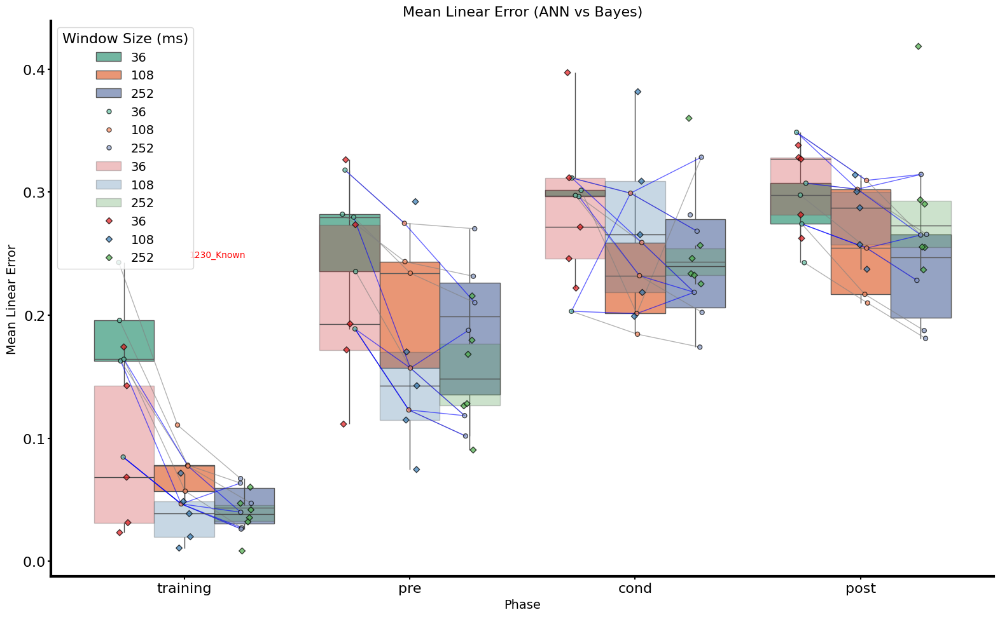

In [42]:
nameExp = "new_4d_GaussianHeatMap_LinearLoss_Transformer"


err_df = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    show=True,
    add_bayes=True,
    bayes_nameExp=bayes_nameExp,
)

In [59]:
loader_all.results_df

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,bayesPred,bayesLinPred,bayesProba,lin_error_bayes,lin_error_selected_bayes,mean_lin_error_bayes,mean_lin_error_selected_bayes,bayesProbThreshold,mean_lin_error_fast_bayes,mean_lin_error_fast_selected_bayes
0,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,36,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.1570132, 0.1570132, 0.1570132, 0.1570132, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.359372,0.320682,0.007615,0.362622,0.320793
1,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,108,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.33635974, 0.33635974, 0.33635974, 0.3363597...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.339872,0.318093,0.021378,0.339052,0.312953
2,new_4d_GaussianHeatMap_LinearLoss_Transformer,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.330162,0.308225,0.057677,0.324653,0.294941
3,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.330162,0.308225,0.057677,0.324653,0.294941
4,STRIDE_2_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,36,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5321644044431648, 0.9915833623122323], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5212138509557749, 0.10908862861612689, 0.09...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.1570132, 0.1570132, 0.1570132, 0.1570132, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.359372,0.320682,0.007615,0.362622,0.320793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,994,PAG,training,108,2.001375,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.802539763175163, 0.04998183919827476], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9863637793433644, 0.9863637793433644, 0.986...",...,"[[0.1, 0.011111111], [0.98888886, 0.18888889],...","[0.0, 0.9318178, 0.7, 0.63552254, 0.7267425, 0...","[0.058275133, 0.101591125, 0.023680672, 0.0385...","[0.98636377, 0.05454594, 0.28636378, 0.3508412...","[0.05454594, 0.972726, 0.98636377, 0.027272522...",0.280778,0.30821

In [60]:
loader_all.results_df.query("winMS == 252 and stride == '4'")

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,bayesPred,bayesLinPred,bayesProba,lin_error_bayes,lin_error_selected_bayes,mean_lin_error_bayes,mean_lin_error_selected_bayes,bayesProbThreshold,mean_lin_error_fast_bayes,mean_lin_error_fast_selected_bayes
3,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,cond,252,3.160724,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.26793240284576997, 0.8295787420565349], [0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.36751459806271514, 0.36751459806271514, 0.3...",...,"[[0.34444445, 0.56666666], [0.34444445, 0.5666...","[0.19073737, 0.19073737, 0.19073737, 0.1907373...","[0.5085064, 0.5085064, 0.5085064, 0.5085064, 0...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...","[0.17350495, 0.17350495, 0.17350495, 0.1735049...",0.330162,0.308225,0.057677,0.324653,0.294941
10,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,post,252,1.896208,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.7004826492304258, 1.0065597112107494], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6276557799717941, 0.6276557799717941, 0.636...",...,"[[0.23333333, 0.16666667], [0.12222222, 0.0111...","[0.05454471, 0.0, 0.0, 0.0, 0.0, 0.71277785, 0...","[0.01925016, 0.03183518, 0.10443078, 0.0761042...","[0.5731111, 0.63606566, 0.63606566, 0.63606566...","[0.63606566, 0.013646185, 0.0, 0.0818187, 0.66...",0.424894,0.472224,0.086442,0.368113,0.421362
17,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,pre,252,1.019774,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5910446342211169, 0.9323153964097181], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,"[[0.7222222, 0.011111111], [0.67777777, 0.0111...","[1.0, 1.0, 0.0, 1.0, 0.7, 0.8636407, 0.0136378...","[0.039880056, 0.06418704, 0.033476178, 0.01678...","[0.436019, 0.436019, 0.563981, 0.436019, 0.136...","[0.436019, 0.39649472, 0.38479498, 0.39649472,...",0.285398,0.271667,0.049620,0.248953,0.227586
24,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1162,MFB,training,252,1.019774,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5910446342211169, 0.9323153964097181], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,"[[0.7222222, 0.011111111], [0.67777777, 0.0111...","[1.0, 1.0, 0.0, 1.0, 0.7, 0.8636407, 0.0136378...","[0.039880056, 0.06418704, 0.033476178, 0.01678...","[0.436019, 0.436019, 0.563981, 0.436019, 0.136...","[0.38479498, 0.39649472, 0.06809878, 0.0136461...",0.311429,0.334330,0.066499,0.238349,0.226147
33,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,cond,252,0.159203,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5712390376082054, 0.9032841729104533], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5493814787618814, 0.5493814787618814, 0.549...",...,"[[0.76666665, 0.98888886], [0.76666665, 0.9888...","[0.6660794, 0.6660794, 0.6660794, 0.6660794, 0...","[0.31366178, 0.31366178, 0.31366178, 0.3136617...","[0.11669791, 0.11669791, 0.11669791, 0.1166979...","[0.11669791, 0.11669791, 0.11669791, 0.1166979...",0.248392,0.210319,0.092986,0.258209,0.210980
42,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,post,252,2.498939,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.6363580917165176, 0.861347395436116], [0.6...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5883508416650484, 0.5883508416650484, 0.588...",...,"[[0.011111111, 0.36666667], [0.011111111, 0.34...","[0.12474748, 0.11515152, 0.009595959, 1.0, 0.2...","[0.096263036, 0.20468394, 0.047769383, 0.08939...","[0.46360335, 0.460384, 0.5659396, 0.42446446, ...","[0.46360335, 0.460384, 0.42446446, 0.5625458, ...",0.240077,0.226327,0.080627,0.240689,0.223254
51,STRIDE_4_new_4d_GaussianHeatMap_LinearL

In [50]:
# drop duplicates bases on (nameExp, mouse, manipe, phase, winMS) and keep the first
tmp_df = (
    loader_all.results_df.query("winMS == 252 and stride == '4'")
    .drop_duplicates(subset=["nameExp", "mouse", "manipe", "phase", "winMS"])
    .copy()
)

In [53]:
loader_all.results_df = tmp_df

In [214]:
loader_all.results_df.query("winMS == 252 and stride == '4' and phase == 'training'")

UndefinedVariableError: name 'stride' is not defined

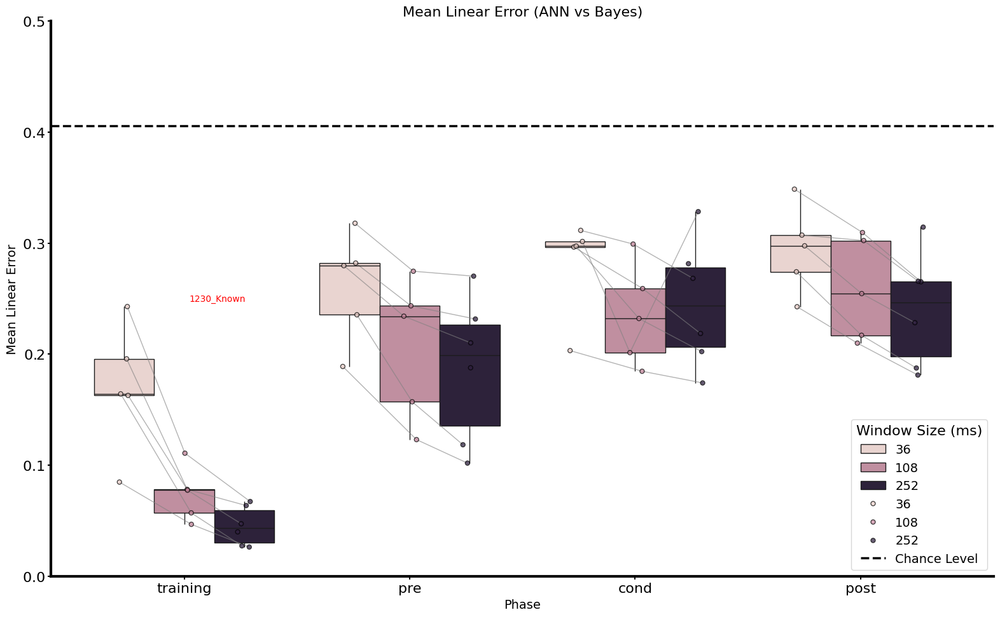

In [51]:
fig, ax = plt.subplots()
err_df_filtered = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    show=False,
    ax=ax,
    chance_level=chance_level,
    entropy_thresh_pct=50,
    palette=None,
    folder=main_dir,
)

fig, axs = plt.subplots(3,2)
axs = axs.flatten()
for i, ax in enumerate(axs):
    ax.plot(predloss_ticks[i][-1], errors_filtered[i][-1])
    # plot in hline the 50th percentile of predloss_ticks
    ax.axvline(np.percentile(predloss_ticks[i][-1], 50), color='red', linestyle='--', label='50th Percentile')
    # plot in vline the corresponding mean linear error
    threshold_50 = np.percentile(predloss_ticks[i][-1], 50)
    mean_error_50 = errors_filtered[i][-1][np.argmin(np.abs(predloss_ticks[i][-1] - threshold_50))]
    ax.axhline(mean_error_50, color='green', linestyle='--', label='Mean Error at 50th Percentile')
    ax.set_title(f"Mouse {mouse_name[i]} - phase training")
    ax.set_xlabel("PredLoss Threshold")
    ax.set_ylabel("Mean Linear Error")
plt.tight_layout()

In [53]:
loader_all.results_df["stride"] = "4"

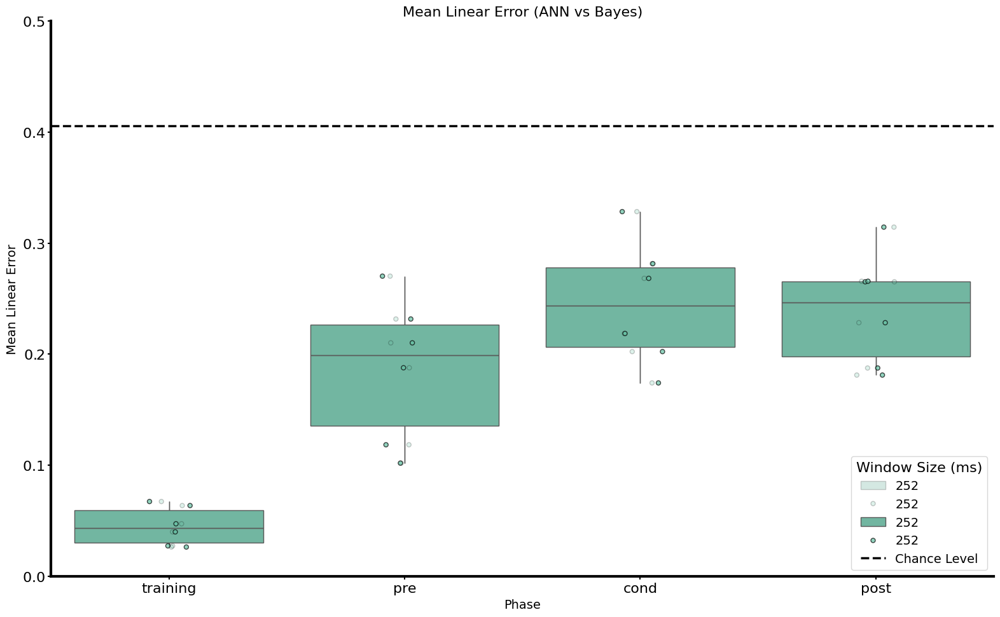

In [56]:
fig, ax = plt.subplots()
err_df_1 = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    winMS_list=["252"],
    show=False,
    ax=ax,
    palette="Set2",
    alpha=0.3,
)

err_df_filtered = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    winMS_list=["252"],
    show=False,
    ax=ax,
    chance_level=chance_level,
    entropy_thresh_pct=20,
    palette="Set2",
)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.png"), dpi=300)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.svg"), dpi=300)

In [177]:
# connect points per mouse with lines INSIDE EACH hue, ie only connect in the same phase from one error type to the other error type
def connect_points(
    strip, data_df, color="gray", value_vars=None, var_name=None, value_name=None
):
    paths = strip.collections
    x_ticks = (
        phase_list if phase_list is not None else ["training", "pre", "cond", "post"]
    )

    coords = {}
    for i, (phase, winMS) in enumerate([(s, p) for s in x_ticks for p in value_vars]):
        coll = paths[i]
        offsets = coll.get_offsets()
        coords[(phase, winMS)] = offsets

    # Connect across phases or winMSs
    if len(value_vars) > 1:
        for (mouse, phase, _), sub in data_df.groupby(
            ["mouse_manipe", "phase", "phase"]
        ):
            if set(sub[var_name]) >= set(value_vars):
                pts = []
                for _, row in sub.iterrows():
                    phase_val = str(row["phase"])
                    winMS_val = row[var_name]
                    arr = coords[(phase_val, winMS_val)]
                    idx = np.argmin(np.abs(arr[:, 1] - row[value_name]))
                    pts.append(arr[idx])
                if len(pts) == len(value_vars):
                    ax.plot(
                        [p[0] for p in pts],
                        [p[1] for p in pts],
                        color=color,
                        alpha=0.6,
                        linewidth=1,
                    )
    else:
        winMS = value_vars[0]
        for (mouse, phase), sub in data_df.query(f"{var_name} == @winMS").groupby(
            ["mouse_manipe", "phase"]
        ):
            pts = []
            for _, row in sub.iterrows():
                phase_val = str(row["phase"])
                arr = coords[(phase_val, winMS)]
                idx = np.argmin(np.abs(arr[:, 1] - row["mean_error"]))
                pts.append(arr[idx])
            if len(pts) > 1:
                pts = sorted(pts, key=lambda x: x[0])
                ax.plot(
                    [p[0] for p in pts],
                    [p[1] for p in pts],
                    color=color,
                    alpha=0.6,
                    linewidth=1,
                )

In [67]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linPred', 'fullPred',
       'truePos', 'linTruePos', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'mean_error', 'lin_error',
       'predLossThreshold', 'mean_error_selected', 'lin_error_selected',
       'asymmetry_index_on_predicted', 'asymmetry_index_on_selected_predicted',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asymmetry_ratio_normalized',
       'selected_predicted_asymmetry_ratio_normalized',
       'true_binary_direction', 'predicted_binary_di

In [80]:
err_df_filtered

,mouse_manipe,phase,winMS,stride,mean_error,mean_error_filtered
0,1162_MFB,cond,252,4,0.281532,0.234861
1,1162_MFB,post,252,4,0.314463,0.319587
2,1162_MFB,pre,252,4,0.187758,0.142751
3,1162_MFB,training,252,4,0.039901,0.013828
4,1199_PAG,cond,252,4,0.218630,0.216805
5,1199_PAG,post,252,4,0.265215,0.260319
6,1199_PAG,pre,252,4,0.231681,0.204600
7,1199_PAG,training,252,4,0.063611,0.032013
8,1230_Known,cond,252,4,0.202322,0.119484
9,1230_Known,post,252,4,0.228358,0.146282


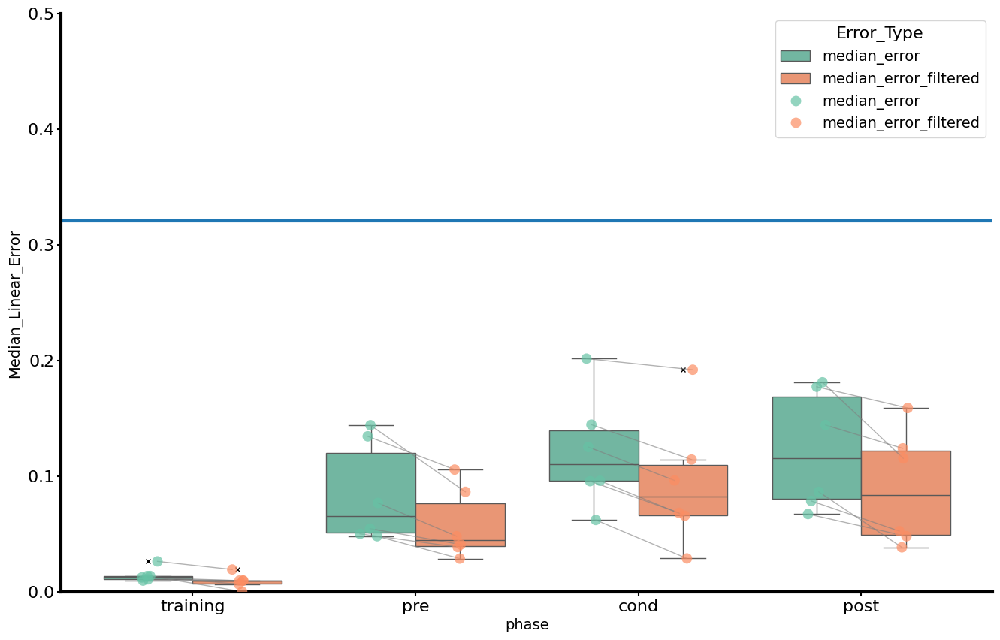

In [179]:
err_df_filtered = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    winMS_list=["252"],
    show=False,
    chance_level=chance_level,
    entropy_thresh_pct=50,
    palette="Set2",
    by="entropy",
)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.png"), dpi=300)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.svg"), dpi=300)
my_df = pd.melt(
    err_df_filtered,
    id_vars=["mouse_manipe", "phase", "winMS"],
    value_vars=["median_error", "median_error_filtered"],
    var_name="Error_Type",
    value_name="Median_Linear_Error",
)

fig, ax = plt.subplots()
sns.boxplot(
    data=my_df,
    x="phase",
    y="Median_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    ax=ax,
    flierprops={"marker": "x", "markersize": 5, "alpha": 1, "markeredgecolor": "black"},
)
# add a black circle to the points (stripplot)
ann_strip = sns.stripplot(
    data=my_df,
    x="phase",
    y="Median_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    dodge=True,
    color="black",
    alpha=0.7,
    ax=ax,
    marker="o",
    size=10,
)
winMS_list = ["median_error", "median_error_filtered"]
ax.set_ylim(0, 0.5)
ax.axhline(chance_level_median)
connect_points(
    strip=ann_strip,
    data_df=my_df,
    color="gray",
    value_vars=winMS_list,
    var_name="Error_Type",
    value_name="Median_Linear_Error",
)
fig.savefig(
    os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.png"),
    dpi=300,
)
fig.savefig(
    os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.svg")
)

In [219]:
loader_all.results_df["mouse_manipe"] = (
    loader_all.results_df["mouse"] + "_" + loader_all.results_df["manipe"]
)
loader_all.results_df["stride"] = 4

In [231]:
loader_all.results_df.query("winMS == 36")

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,training_asymmetry_index,real_asymmetry_ratio,predicted_asymmetry_ratio,predicted_asymmetry_ratio_on_selected,predicted_asymmetry_ratio_normalized,selected_predicted_asymmetry_ratio_normalized,true_binary_direction,predicted_binary_direction,mouse_manipe,stride
4,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,cond,36,0.159203,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5712390376082054, 0.9032841729104533], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5493814787618814, 0.5493814787618814, 0.549...",...,0.802906,0.198284,1.091037,1.412707,4.417904,5.720435,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, ...",1199_PAG,4
7,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,post,36,2.498939,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.6363580917165176, 0.861347395436116], [0.6...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5883508416650484, 0.5883508416650484, 0.588...",...,0.802906,3.112369,2.372549,4.504754,0.612052,1.162103,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, ...",1199_PAG,4
10,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,pre,36,0.802906,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.2380991101561953, 0.8049437338425552], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.2686861573186392, 0.2686861573186392, 0.268...",...,0.802906,1.000000,1.632761,3.763852,1.310953,3.022018,"[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, ...",1199_PAG,4
13,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1199,PAG,training,36,0.802906,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.2380991101561953, 0.8049437338425552], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.2686861573186392, 0.2686861573186392, 0.268...",...,0.802906,1.000000,1.448026,2.417365,1.162628,1.940916,"[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, ...",1199_PAG,4
16,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1230,Novel,cond,36,0.437444,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.9452201845644533, 0.8934860098627793], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7134555139999135, 0.7134555139999135, 0.713...",...,2.018042,0.216766,0.471544,0.451846,4.389961,4.206580,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, ...",1230_Novel,4
19,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1230,Known,cond,36,0.788136,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.3163290570185574, 0.8835398483246375], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.38379512020874057, 0.3742078515198658, 0.37...",...,2.018042,0.390545,0.316270,0.567534,1.634244,2.932587,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, ...",1230_Known,4
22,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1230,Novel,post,36,0.943824,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5321389263077001, 0.9286441295359518], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5227936589315799, 0.5227936589315799, 0.522...",...,2.018042,0.467693,0.480549,0.461017,2.073516,1.989234,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, ...",1230_Novel,4
25,STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Tra...,1230,Known,post,36,0.757311,"[[nan, nan], [nan, nan], [nan, nan], [nan, nan...","[[0.5855860950415486, 0.9231739198210094], [0....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5493814787618814, 0.5493814787618814, 0.549...",...,2.018042,0.375270,0.356319,0.541561,1.916128

In [227]:
loader_all.results_df.query(
    "mouse_manipe == @mouse_manipe & winMS == 36 & stride == 4 & phase == 'training'"
)

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,training_asymmetry_index,real_asymmetry_ratio,predicted_asymmetry_ratio,predicted_asymmetry_ratio_on_selected,predicted_asymmetry_ratio_normalized,selected_predicted_asymmetry_ratio_normalized,true_binary_direction,predicted_binary_direction,mouse_manipe,stride


0: 1162_MFB
Skipping 1162_MFB because no winMS 36
1: 1199_PAG


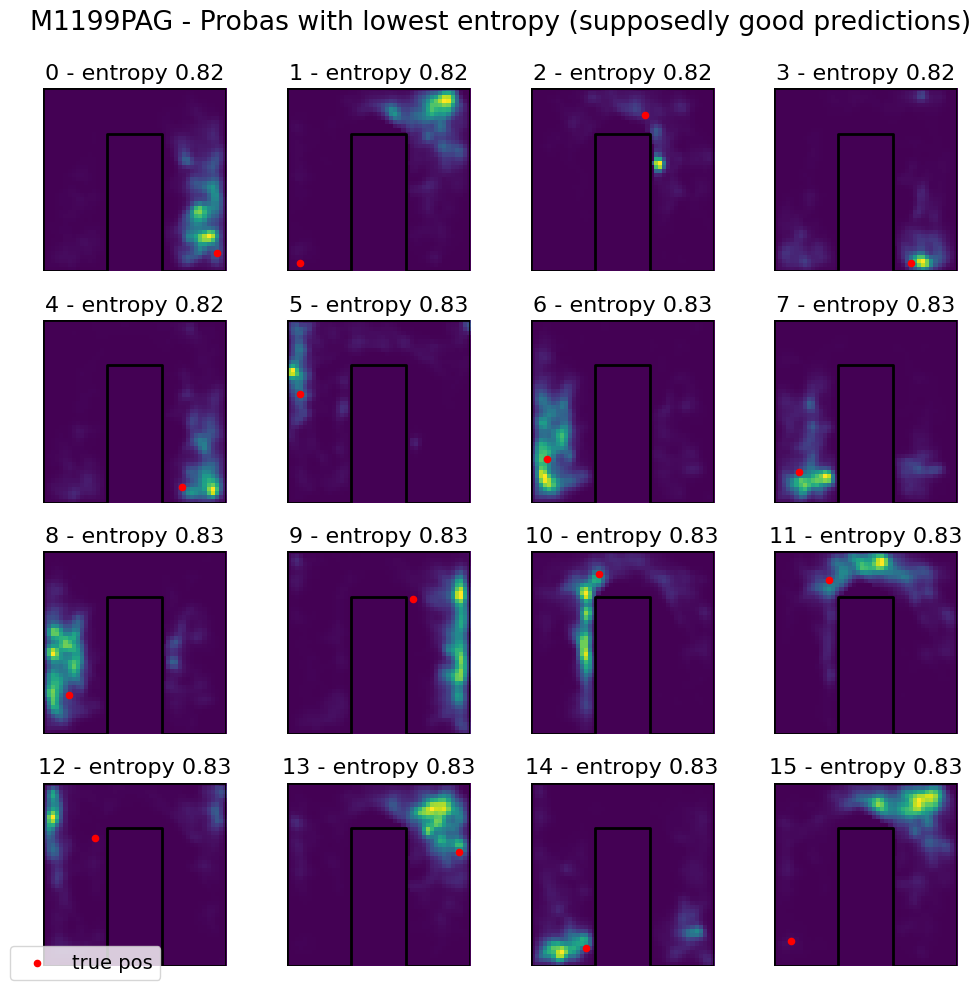

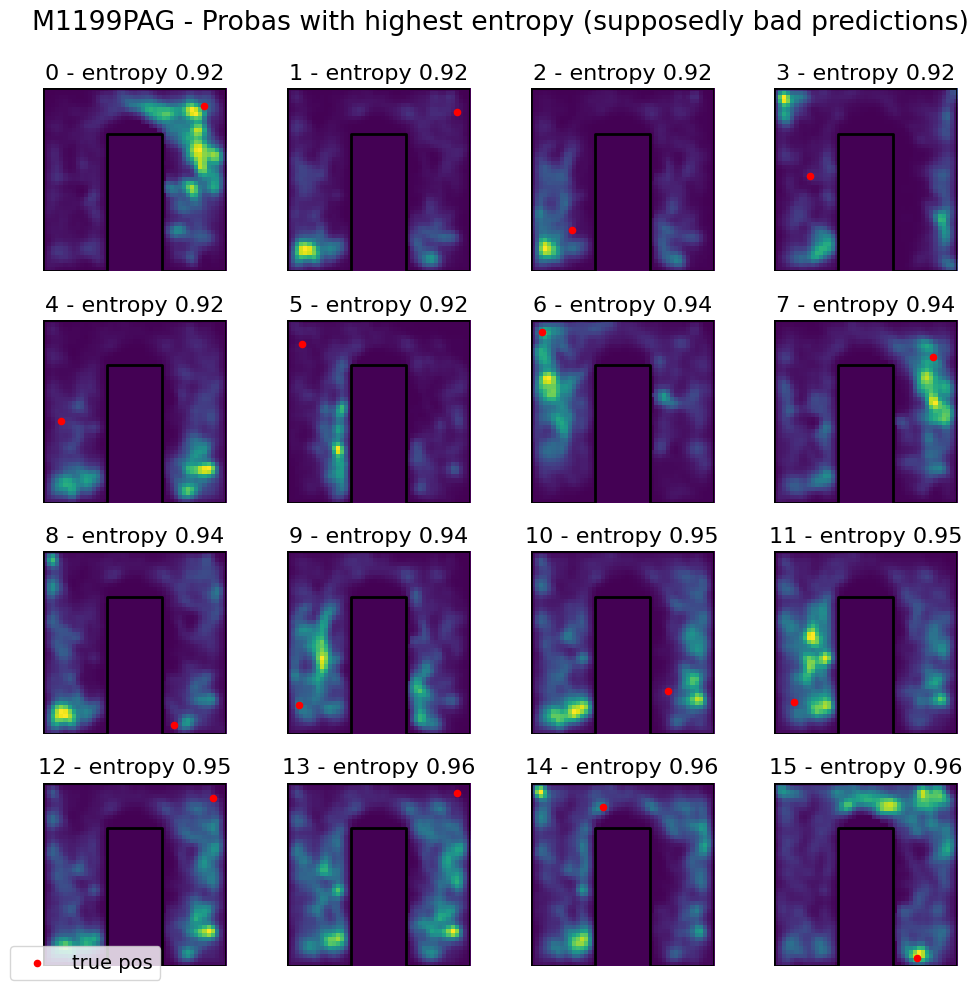

2: 1230_Novel


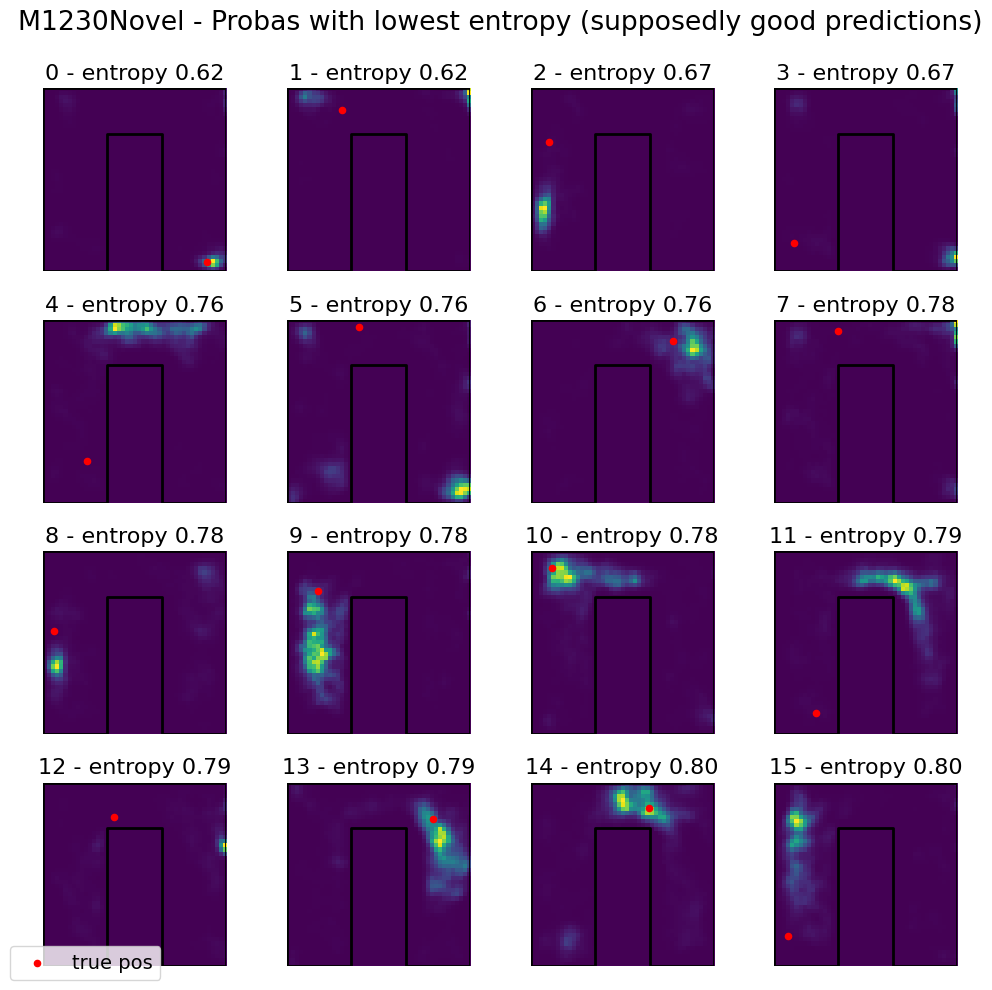

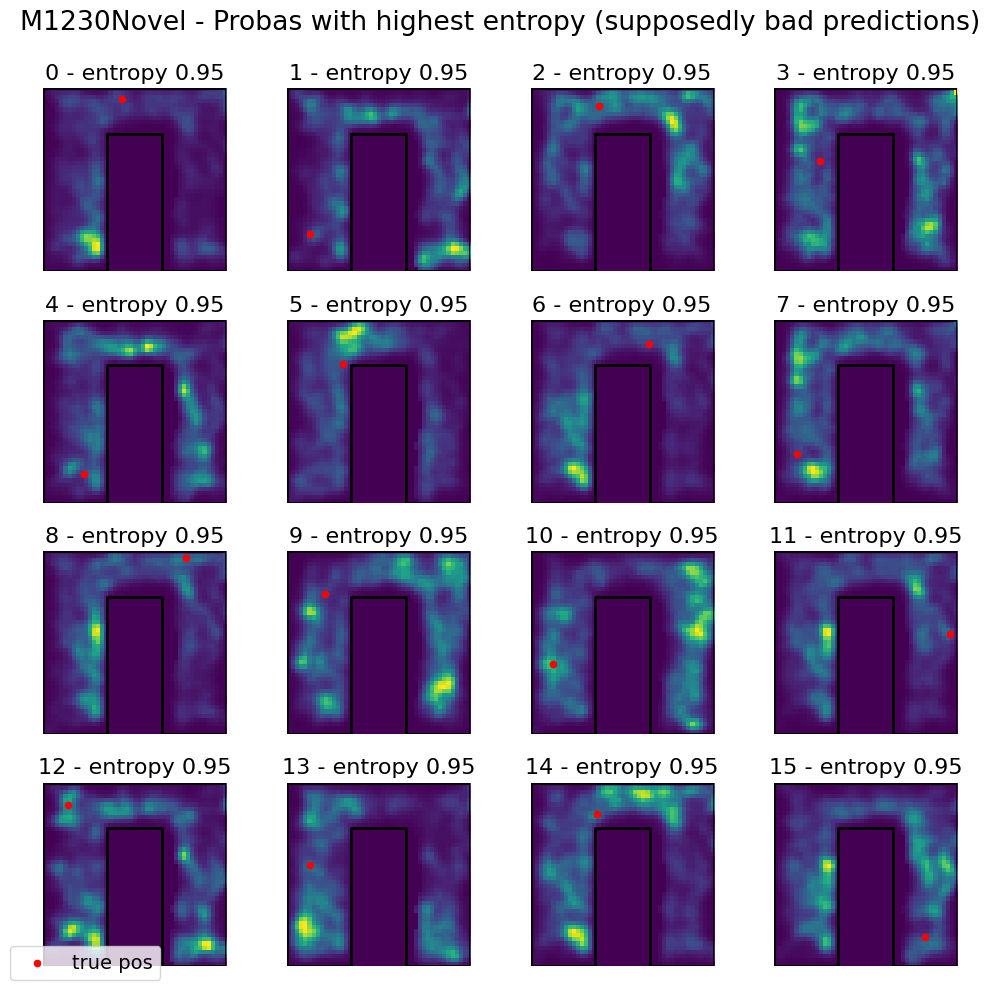

3: 1230_Known


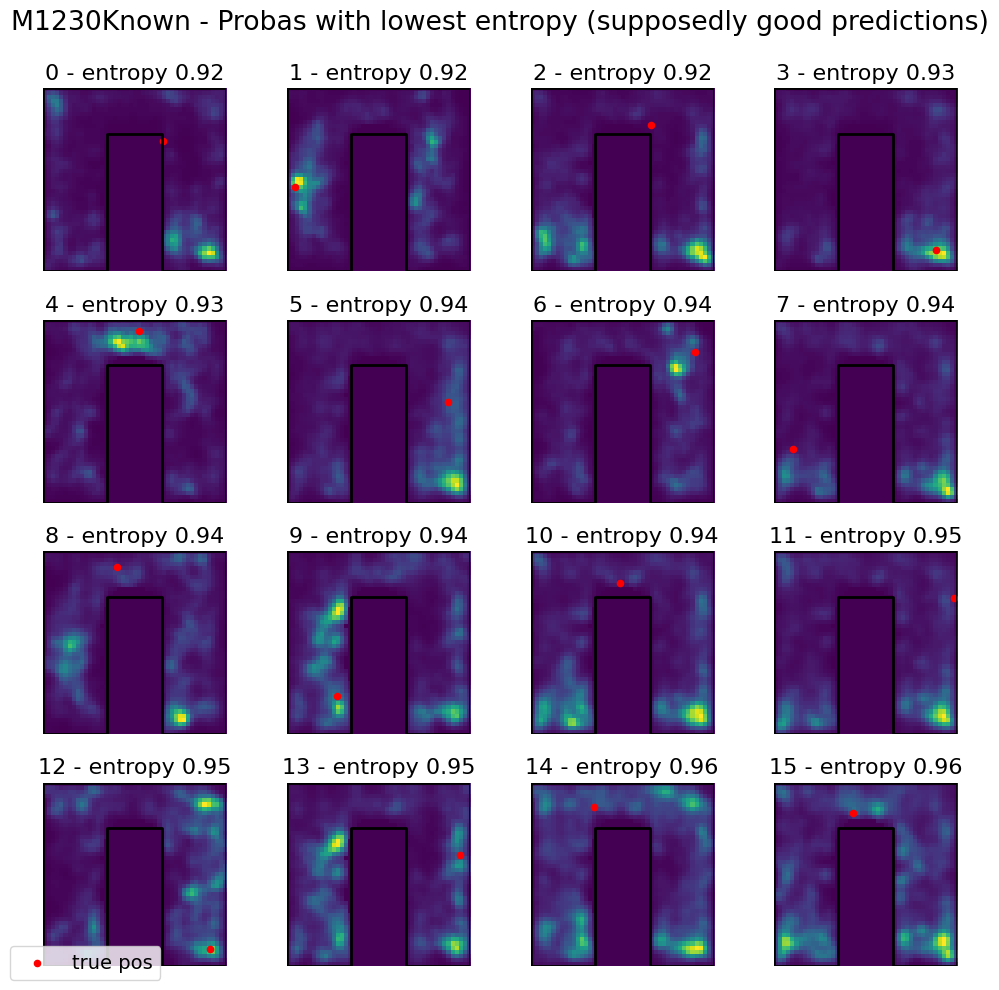

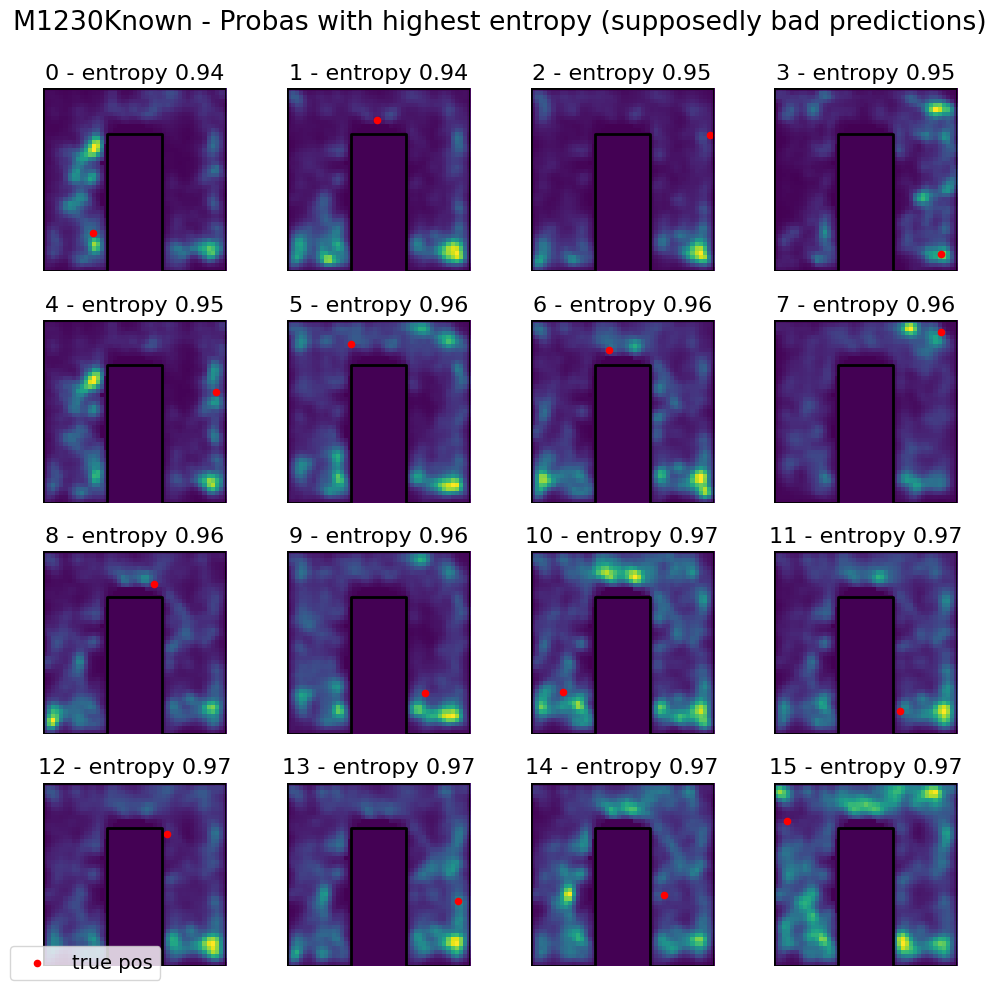

4: 1239_MFB


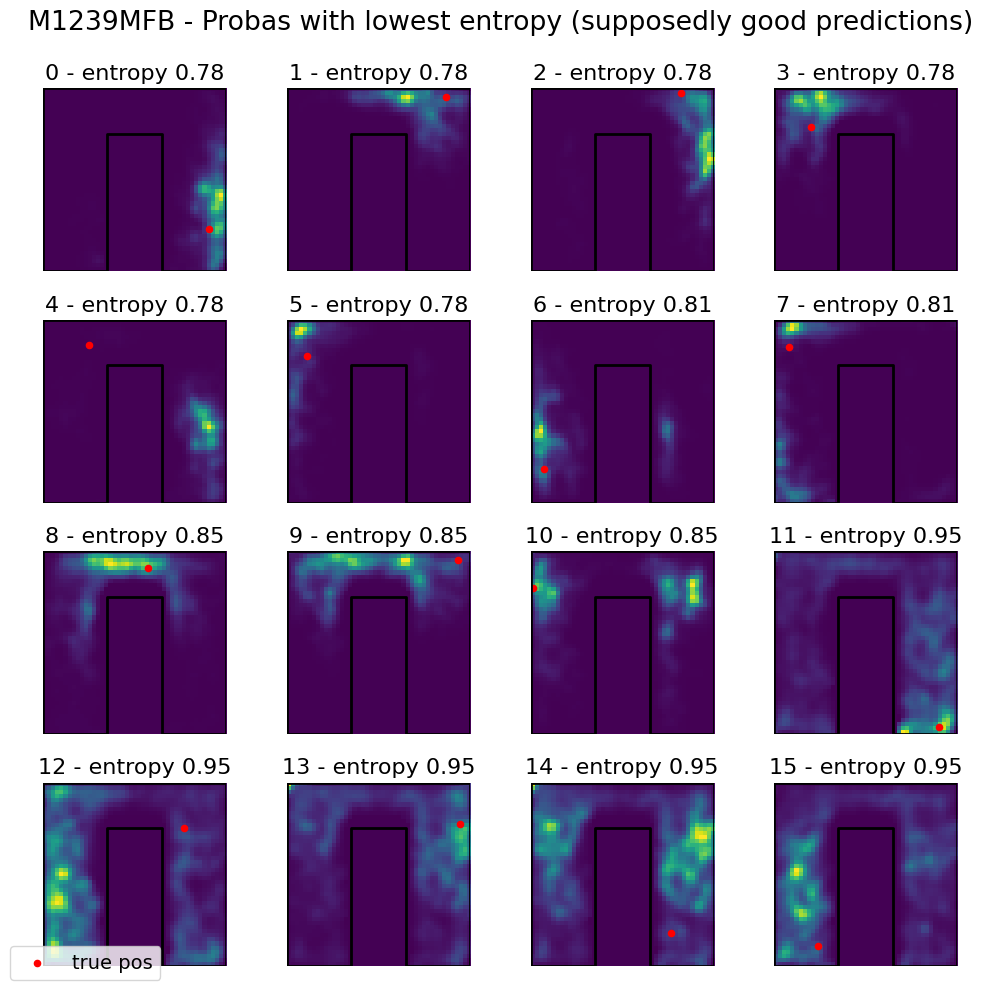

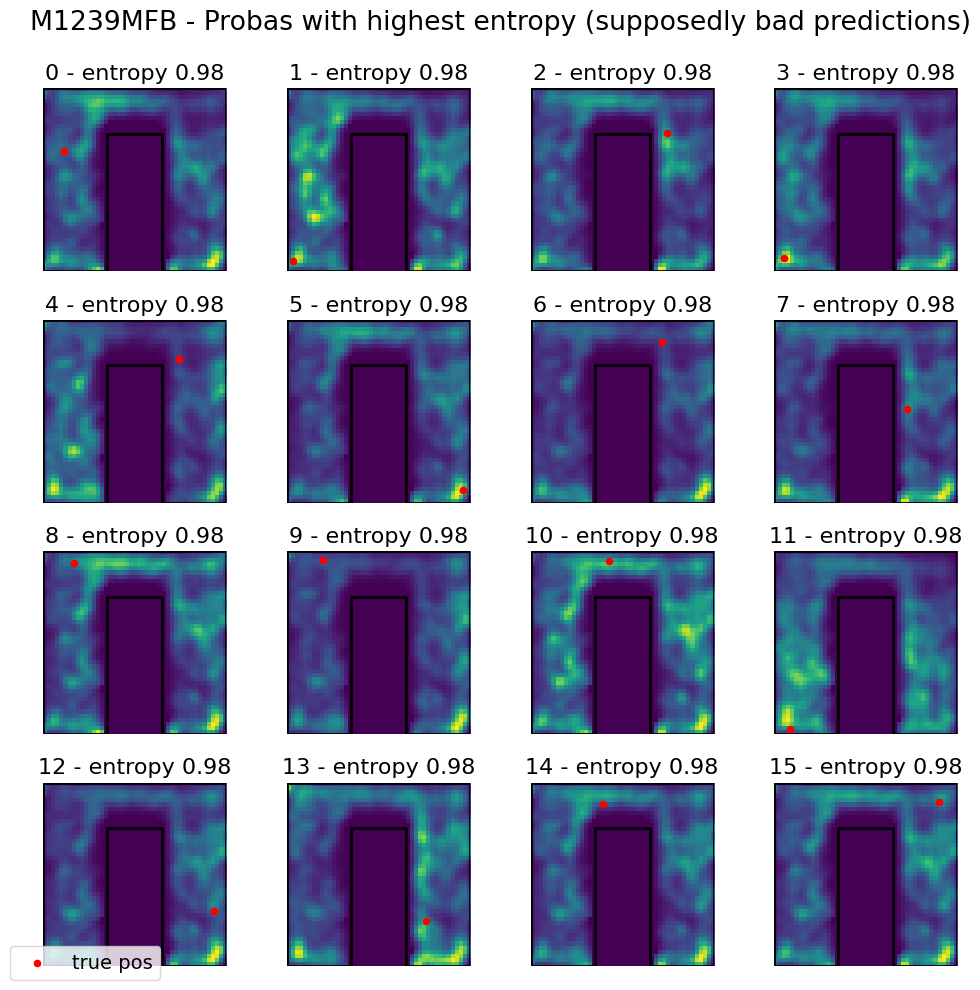

5: 994_PAG


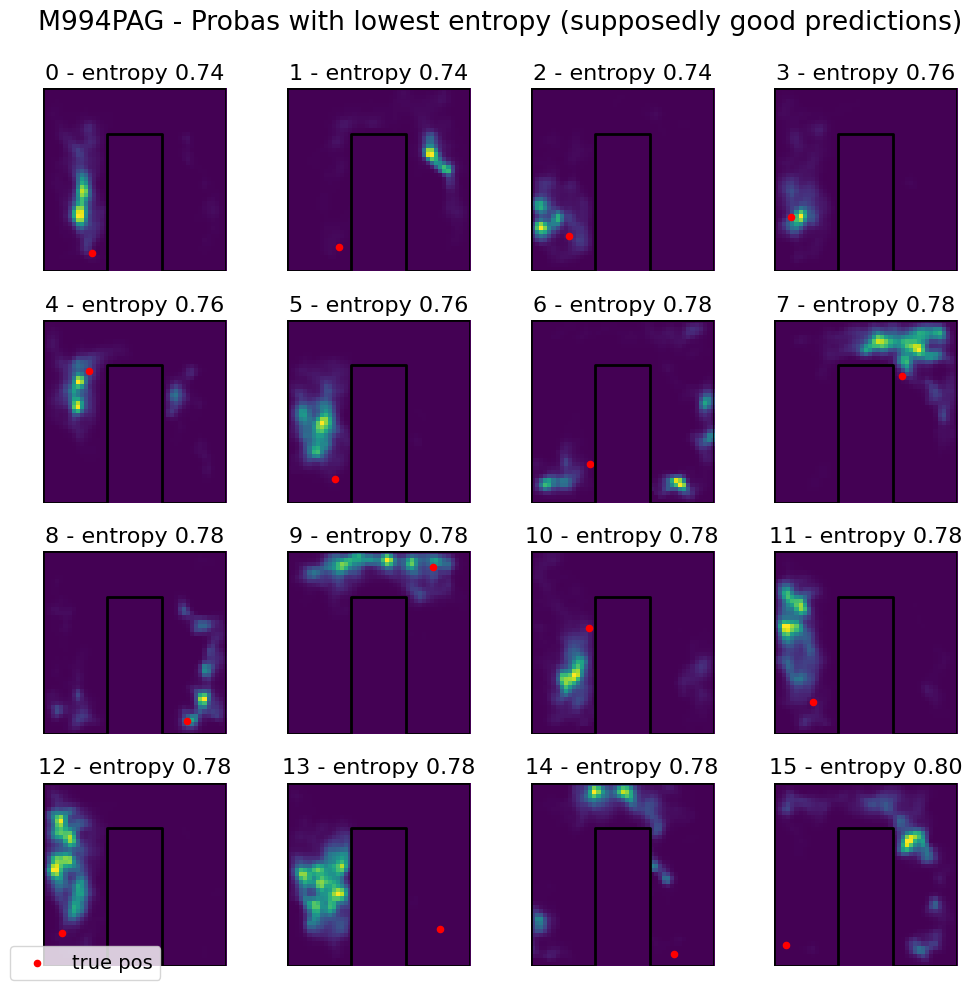

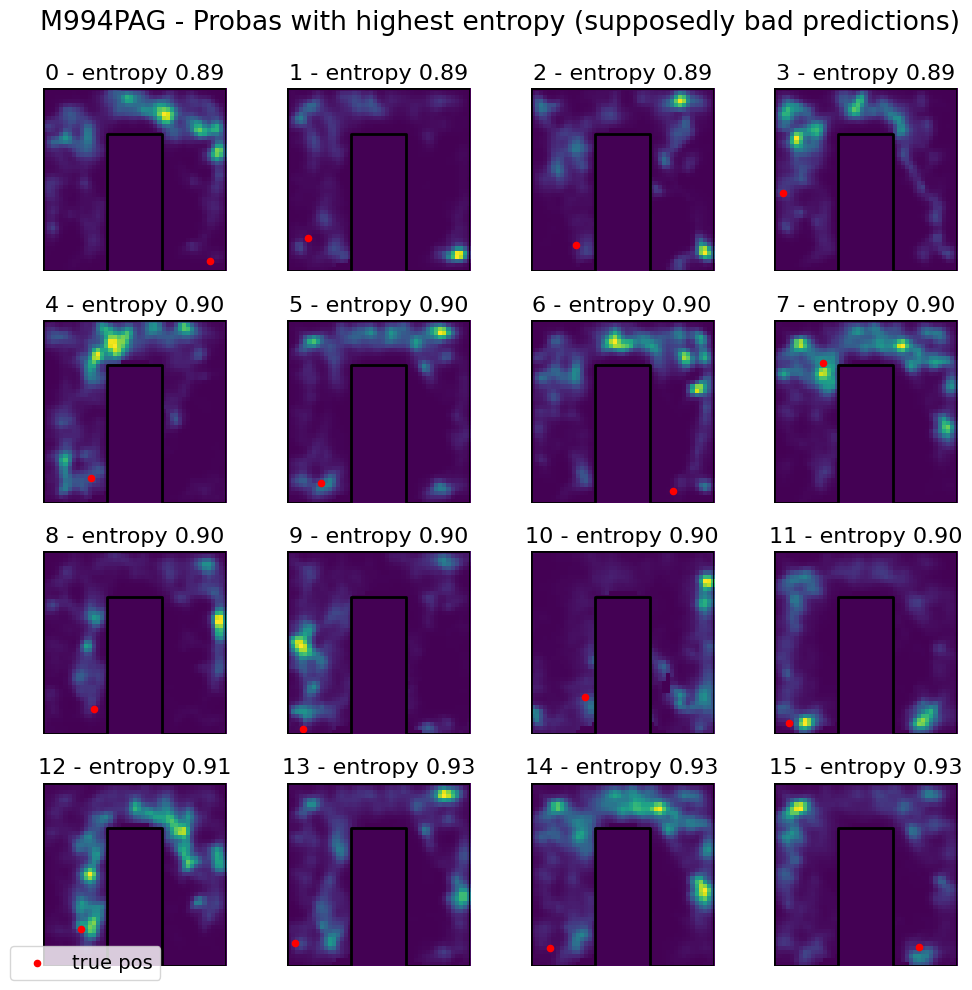

In [236]:
loader_all.results_df["mouse_manipe"].unique()
import dill as pickle
import tensorflow as tf

for i in range(loader_all.results_df["mouse_manipe"].unique().shape[0]):
    print(f"{i}: {loader_all.results_df['mouse_manipe'].unique()[i]}")
    mouse_manipe = loader_all.results_df["mouse_manipe"].unique()[i]
    if (
        loader_all.results_df.query(
            "mouse_manipe == @mouse_manipe & winMS == 36"
        ).shape[0]
        == 0
    ):
        print(f"Skipping {mouse_manipe} because no winMS 36")
        continue
    Mouse_Results = loader_all.results_df.query(
        "mouse_manipe == @mouse_manipe & winMS == 36 & stride == 4 & phase == 'training'"
    ).results.iloc[0]

    with open(
        os.path.join(Mouse_Results.folderResult, "36", "decoding_results_training.pkl"),
        "rb",
    ) as f:
        decoding_results = pickle.load(f)

    Mouse_Results.load_trainers(which="ann", winMS="36")
    logits_hw = decoding_results["logits_hw"]
    entropy_hw = decoding_results["Hn"]
    net = Mouse_Results.ann["36"]
    heatmap_layer = net.GaussianHeatmap
    truePos = decoding_results["featureTrue"]
    # Assume logits_hw: [B,H,W], target_hw: [B,H,W], heatmap_layer instance exists
    from neuroencoders.utils.global_classes import MAZE_COORDS

    B, H, W = logits_hw.shape

    # 1️⃣ Mask forbidden logits
    masked_logits = tf.where(
        heatmap_layer.forbid_mask_tf[None] > 0, heatmap_layer.NEG, logits_hw
    )

    # 2️⃣ Softmax over allowed bins
    logits_flat = tf.reshape(masked_logits, [B, H * W])
    probs_flat = tf.nn.softmax(logits_flat, axis=-1)
    probs = tf.reshape(probs_flat, [B, H, W])
    num_subplots = 16
    tRipples = Mouse_Results.data_helper["36"].fullBehavior["Times"]["tRipples"]

    # plot around ripple times
    ripples_time = tRipples.flatten()
    time = decoding_results["times"].flatten()
    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        0:num_subplots
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with lowest entropy (supposedly good predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs.svg",
        dpi=600,
    )
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs.png",
        dpi=300,
    )
    plt.show()

    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        -num_subplots:
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with highest entropy (supposedly bad predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs.svg",
        dpi=600,
    )
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs.png",
        dpi=300,
    )

    plt.show()

0: 1162_MFB
Skipping 1162_MFB because no winMS 36
1: 1199_PAG


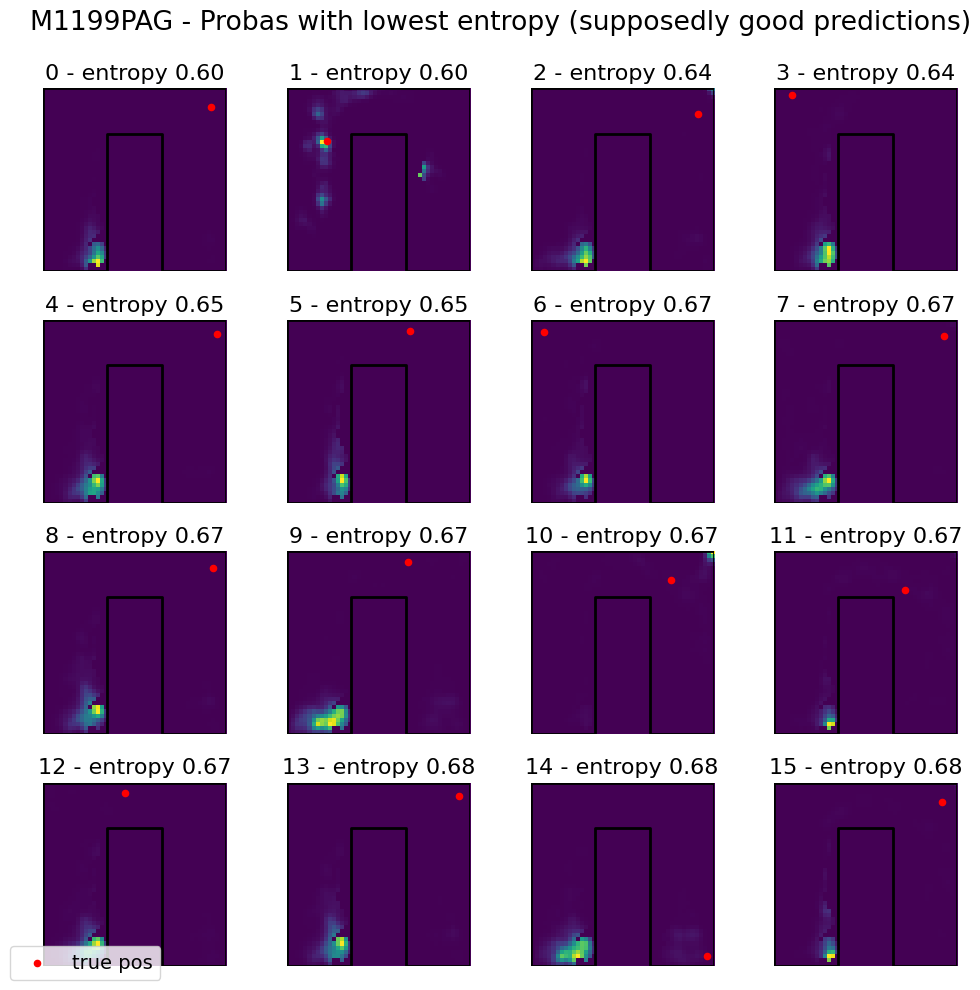

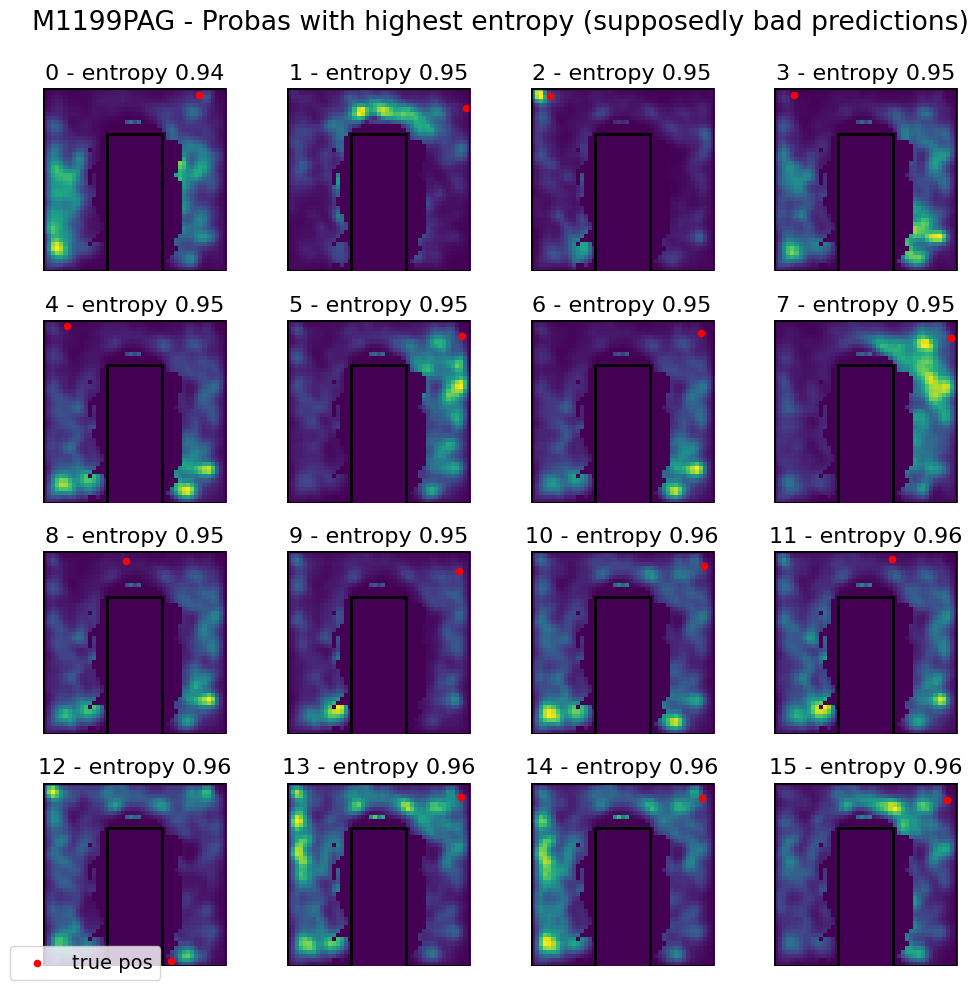

2: 1230_Novel


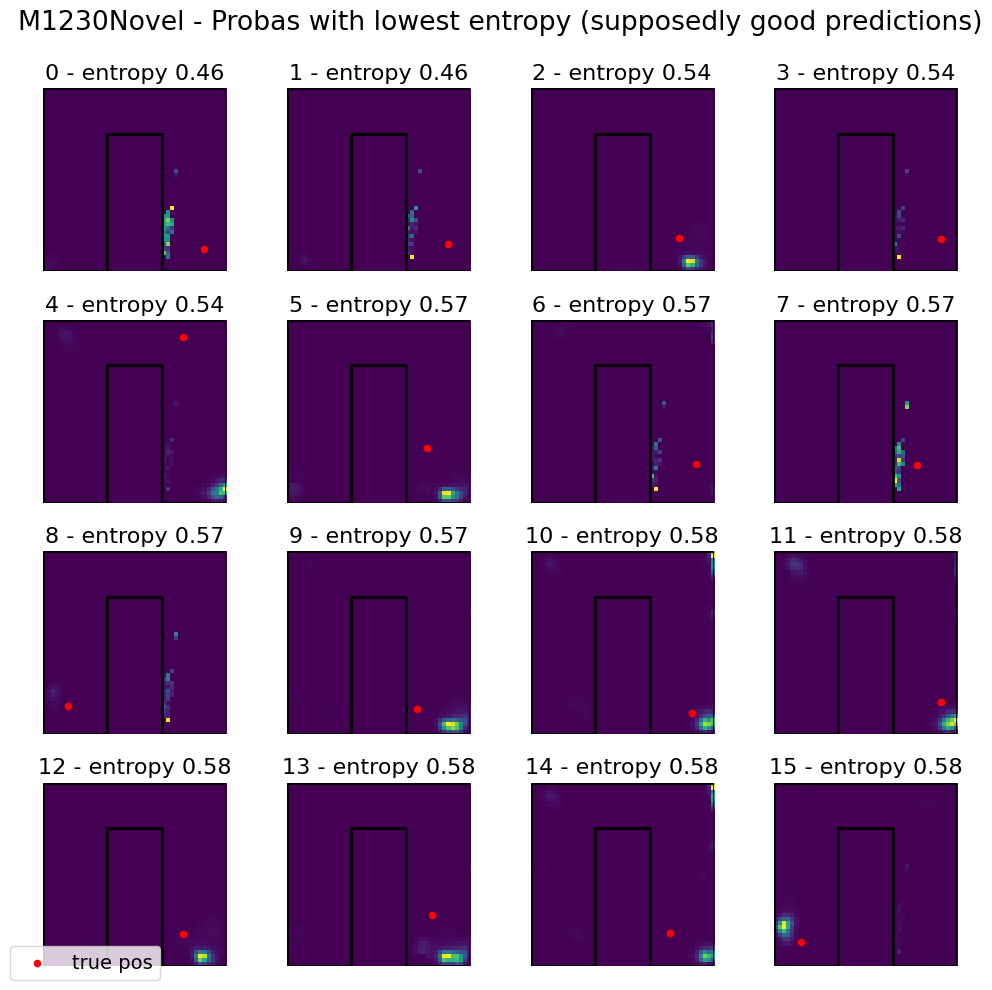

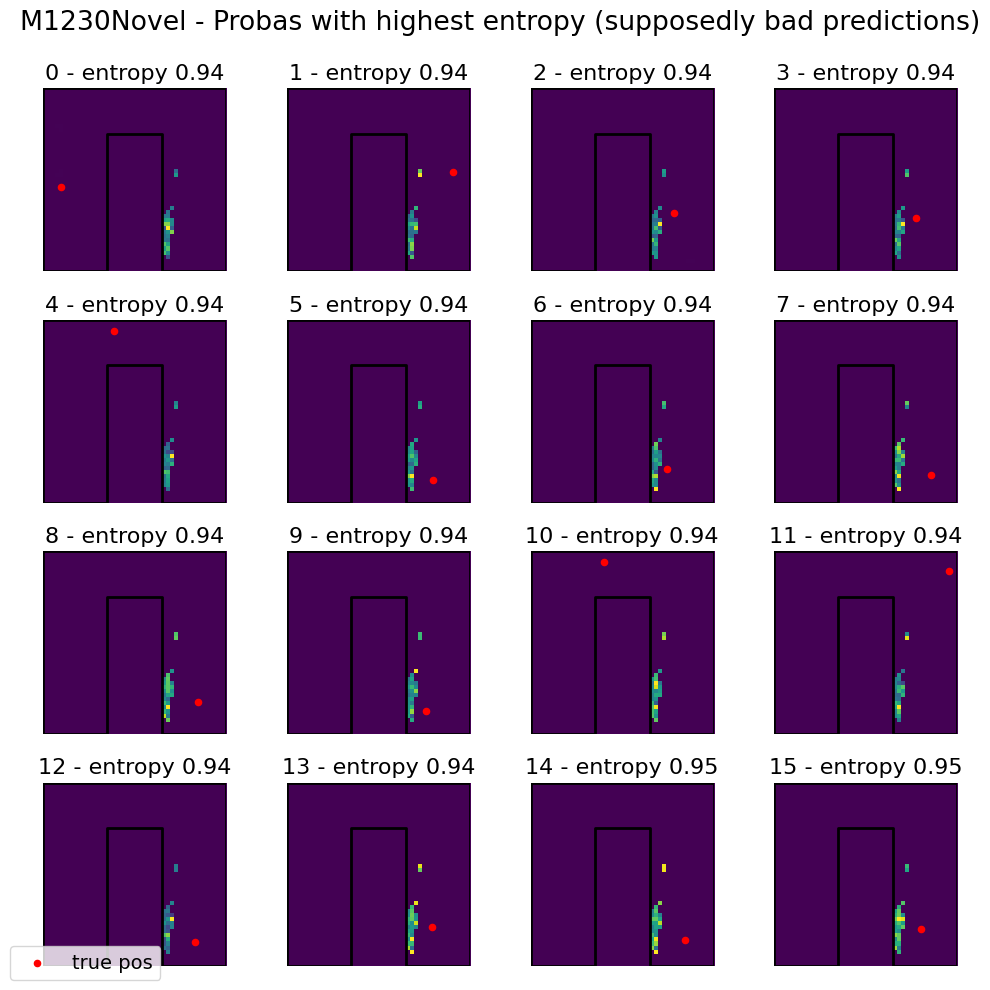

3: 1230_Known


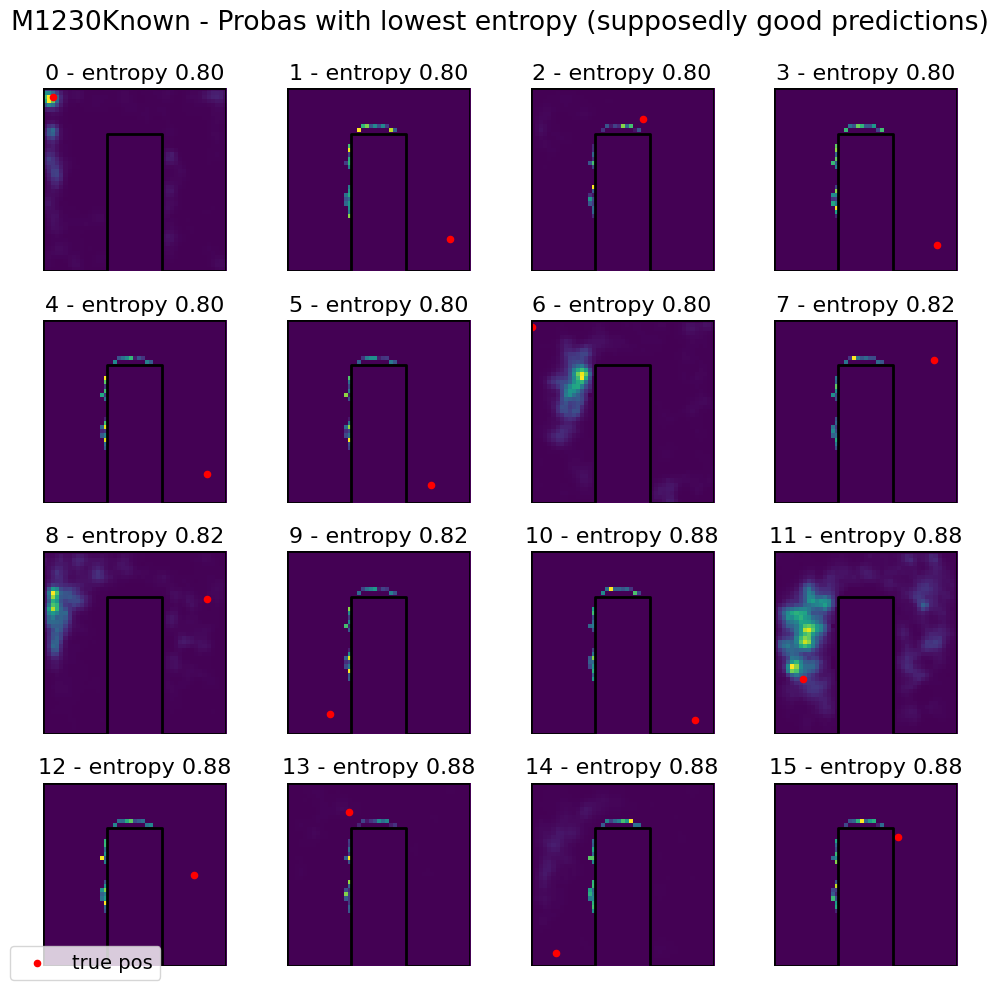

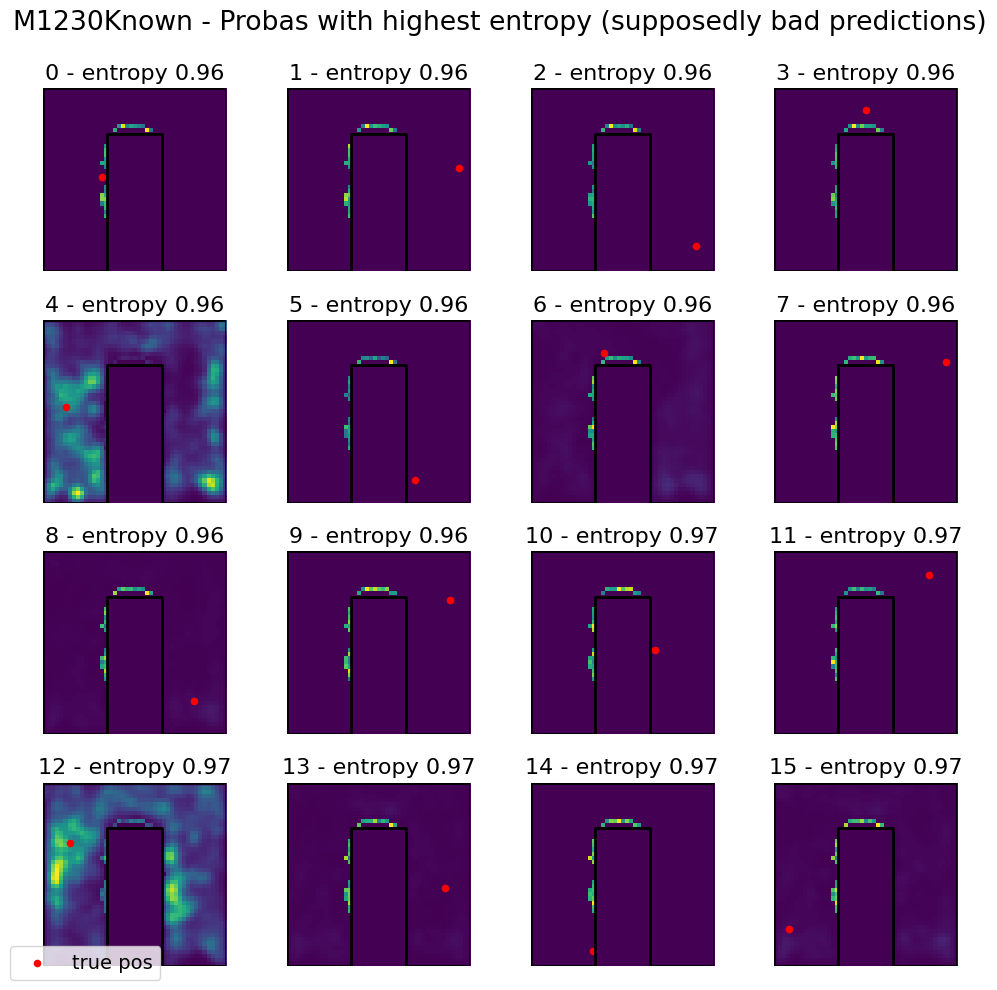

4: 1239_MFB


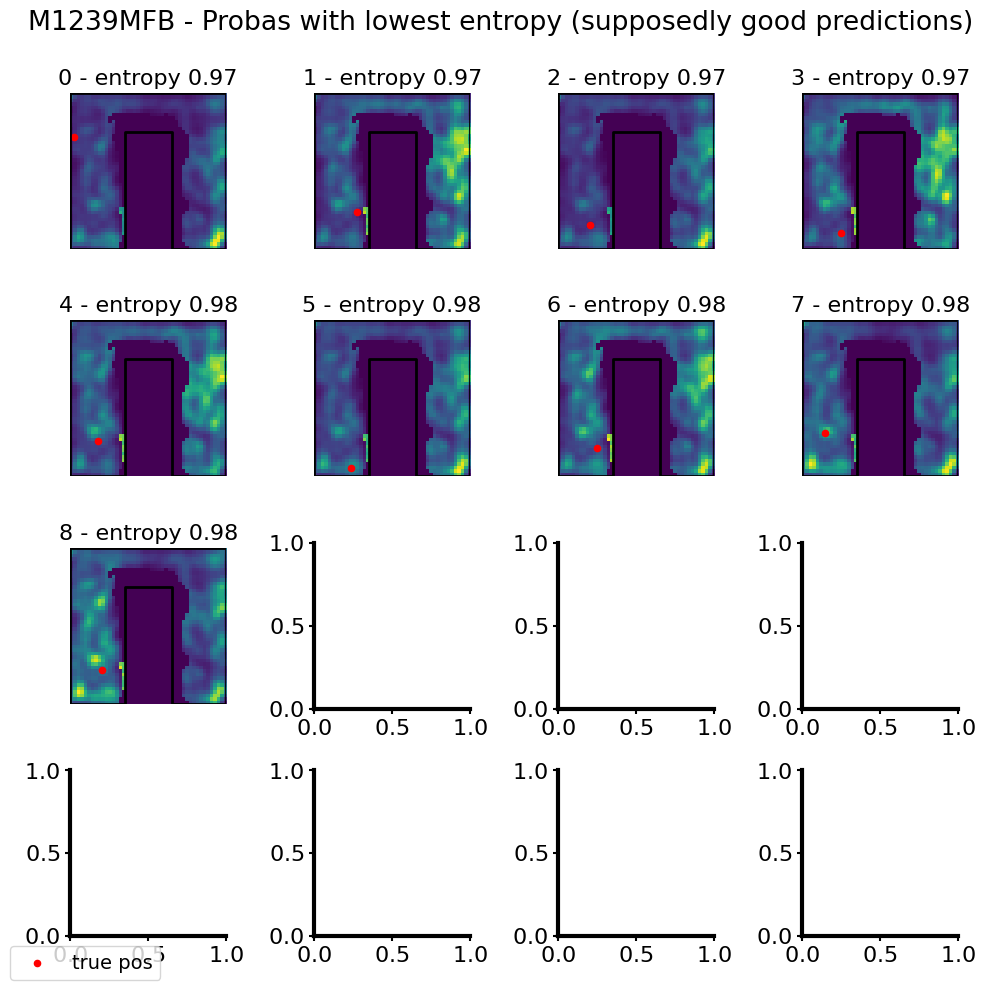

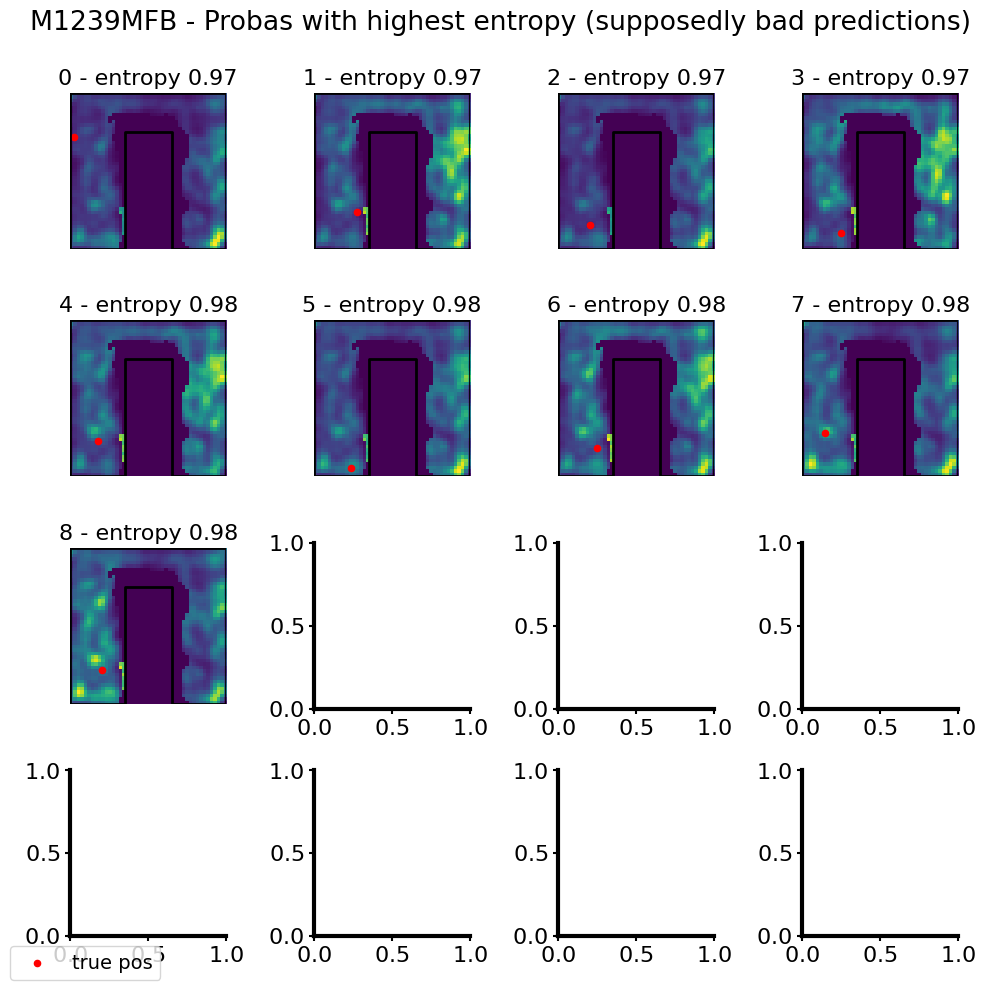

5: 994_PAG
Setting up GaussianHeatmapLayer...
Output dimension: 4
Using Transformer architecture !
Using multi-column loss
Setting up GaussianHeatmapLayer...
Output dimension: 4
Using Transformer architecture !
Using multi-column loss
Setting up GaussianHeatmapLayer...
Output dimension: 4
Using Transformer architecture !
Using multi-column loss


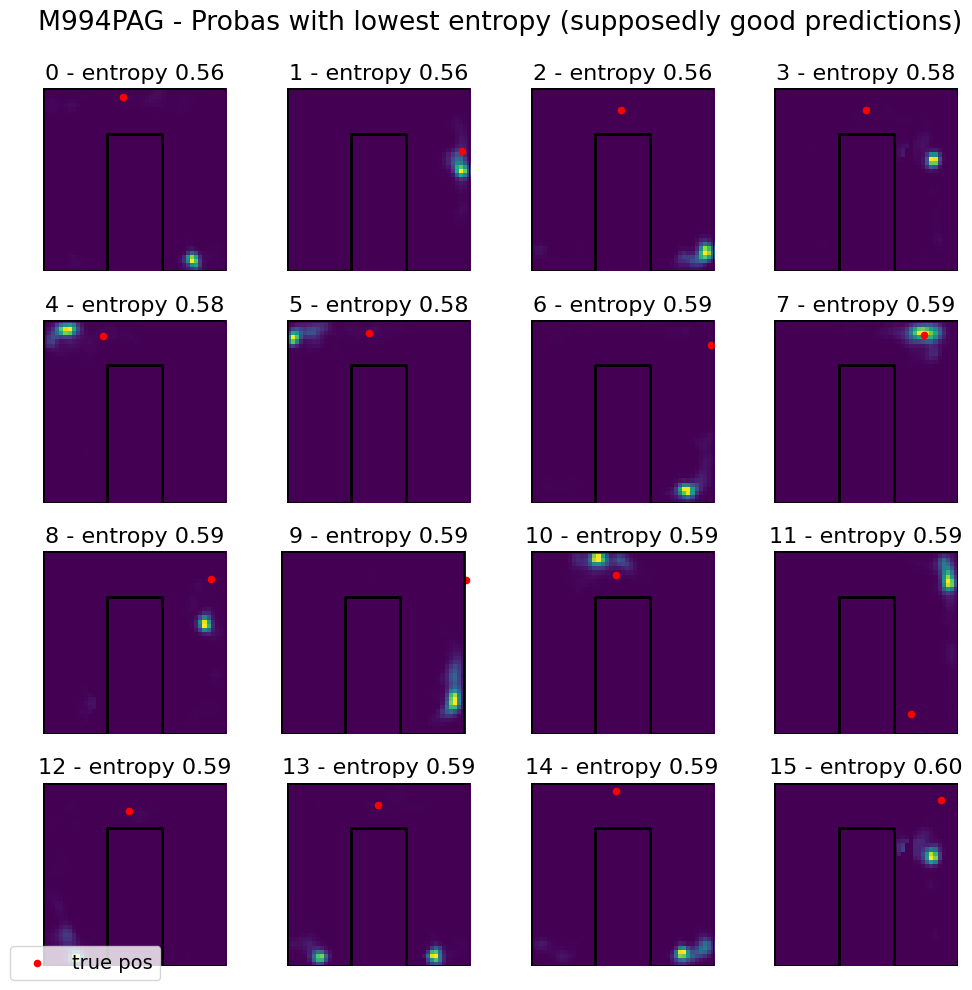

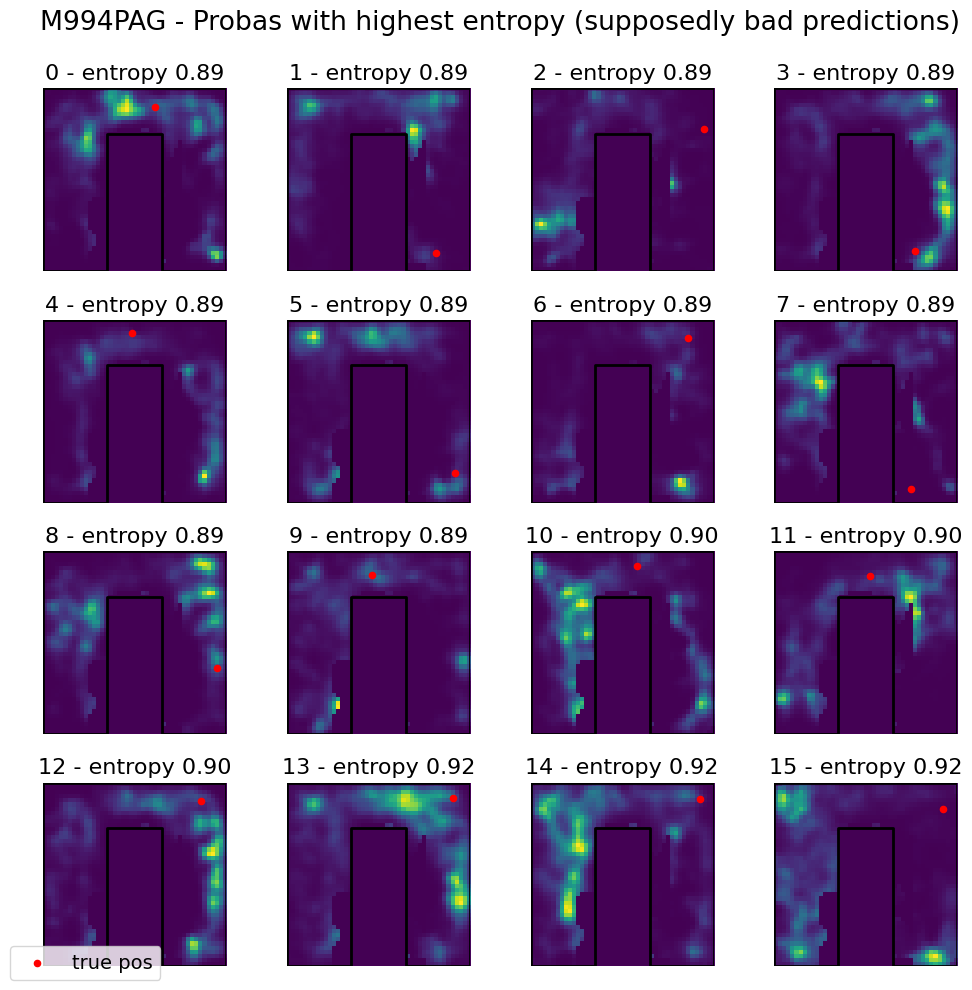

In [237]:
loader_all.results_df["mouse_manipe"].unique()
import dill as pickle
import tensorflow as tf

for i in range(loader_all.results_df["mouse_manipe"].unique().shape[0]):
    print(f"{i}: {loader_all.results_df['mouse_manipe'].unique()[i]}")
    mouse_manipe = loader_all.results_df["mouse_manipe"].unique()[i]
    if (
        loader_all.results_df.query(
            "mouse_manipe == @mouse_manipe & winMS == 36"
        ).shape[0]
        == 0
    ):
        print(f"Skipping {mouse_manipe} because no winMS 36")
        continue
    Mouse_Results = loader_all.results_df.query(
        "mouse_manipe == @mouse_manipe & winMS == 36 & stride == 4 & phase == 'cond'"
    ).results.iloc[0]

    with open(
        os.path.join(Mouse_Results.folderResult, "36", "decoding_results_cond.pkl"),
        "rb",
    ) as f:
        decoding_results = pickle.load(f)

    Mouse_Results.load_trainers(which="ann", winMS="36")
    logits_hw = decoding_results["logits_hw"]
    entropy_hw = decoding_results["Hn"]
    net = Mouse_Results.ann["36"]
    heatmap_layer = net.GaussianHeatmap
    truePos = decoding_results["featureTrue"]
    # Assume logits_hw: [B,H,W], target_hw: [B,H,W], heatmap_layer instance exists
    from neuroencoders.utils.global_classes import MAZE_COORDS

    B, H, W = logits_hw.shape

    # 1️⃣ Mask forbidden logits
    masked_logits = tf.where(
        heatmap_layer.forbid_mask_tf[None] > 0, heatmap_layer.NEG, logits_hw
    )

    # 2️⃣ Softmax over allowed bins
    logits_flat = tf.reshape(masked_logits, [B, H * W])
    probs_flat = tf.nn.softmax(logits_flat, axis=-1)
    probs = tf.reshape(probs_flat, [B, H, W])
    num_subplots = 16
    tRipples = Mouse_Results.data_helper["36"].fullBehavior["Times"]["tRipples"]

    # plot around ripple times
    ripples_time = tRipples.flatten()
    time = decoding_results["times"].flatten()
    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        0:num_subplots
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with lowest entropy (supposedly good predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs_COND.svg",
        dpi=600,
    )
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs_COND.png",
        dpi=300,
    )
    plt.show()

    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        -num_subplots:
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with highest entropy (supposedly bad predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs_COND.svg",
        dpi=600,
    )
    plt.savefig(
        f"/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Presentation/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs_COND.png",
        dpi=300,
    )

    plt.show()

In [143]:
loader_all.results_df.query(
    "winMS == 252 and stride == '4' and phase == 'training'"
).shape[0]

6

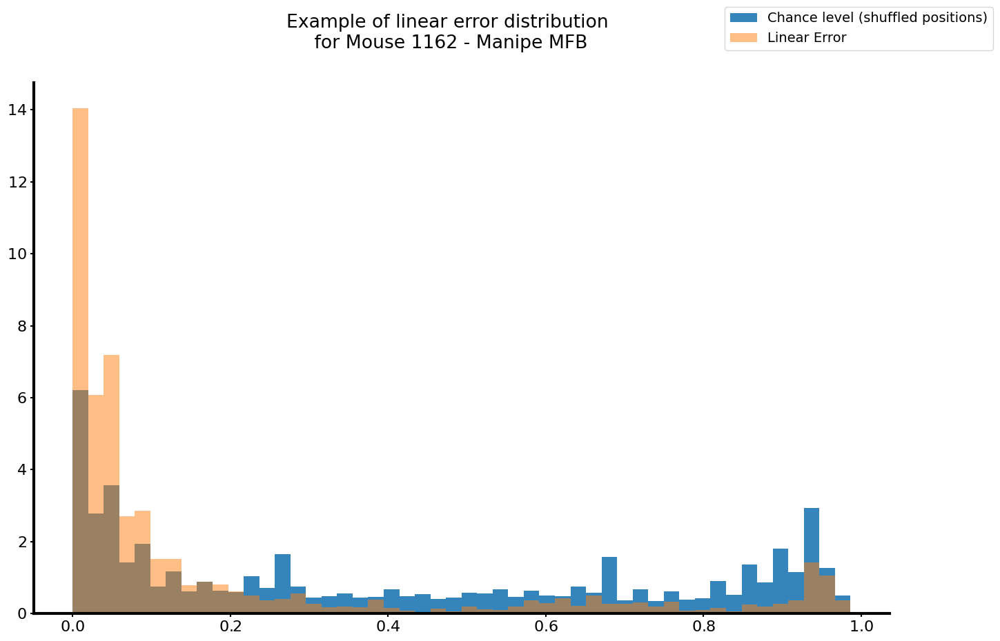

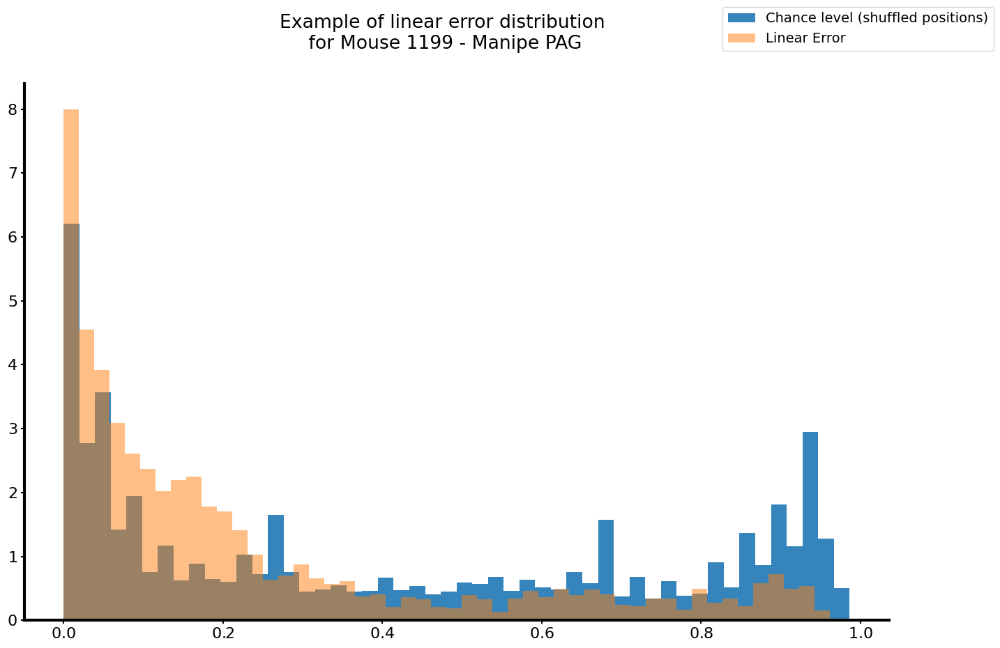

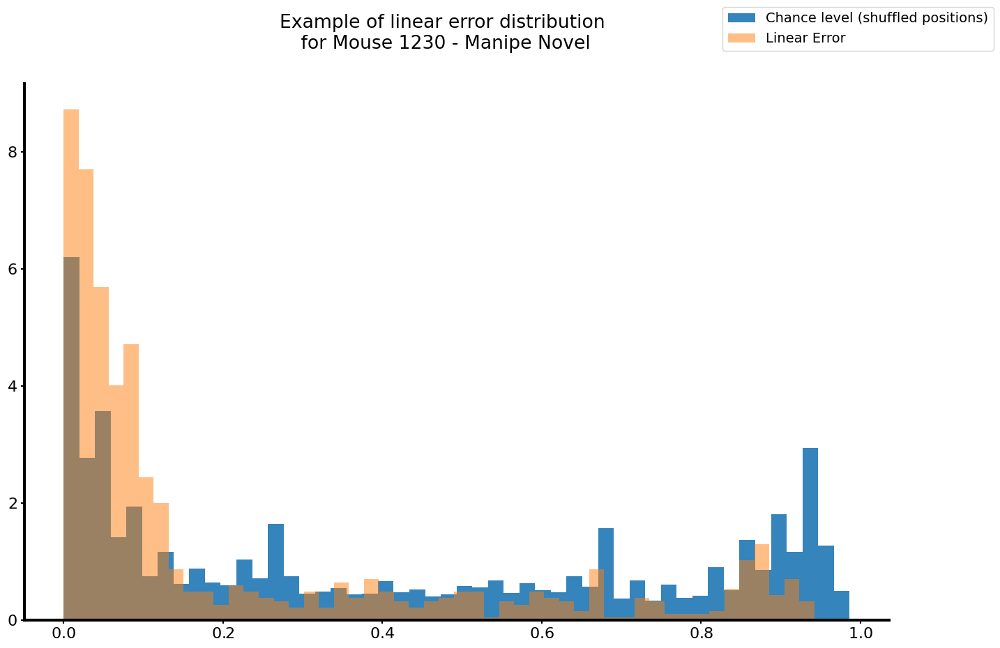

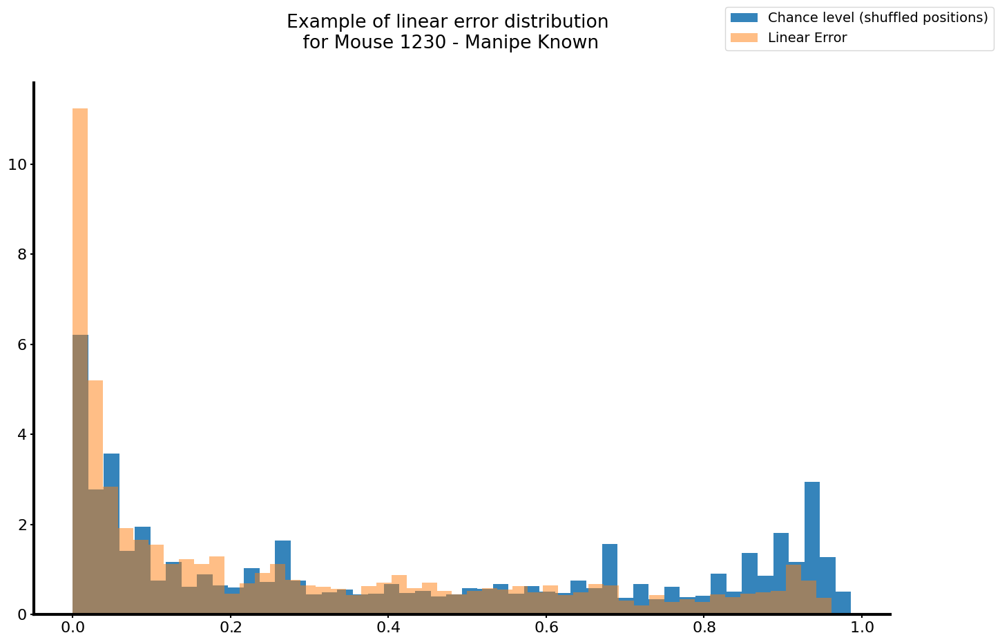

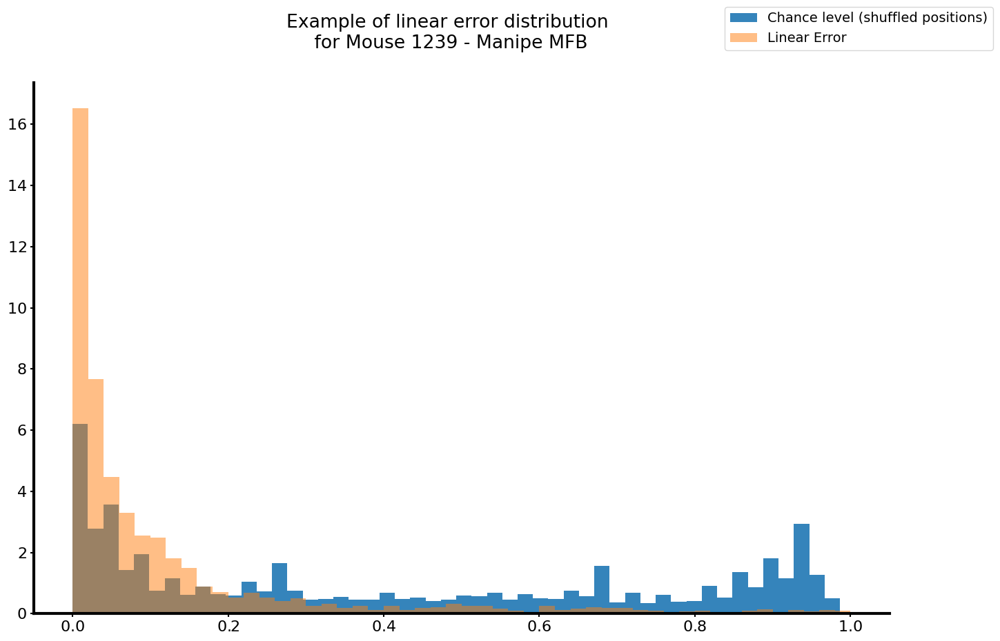

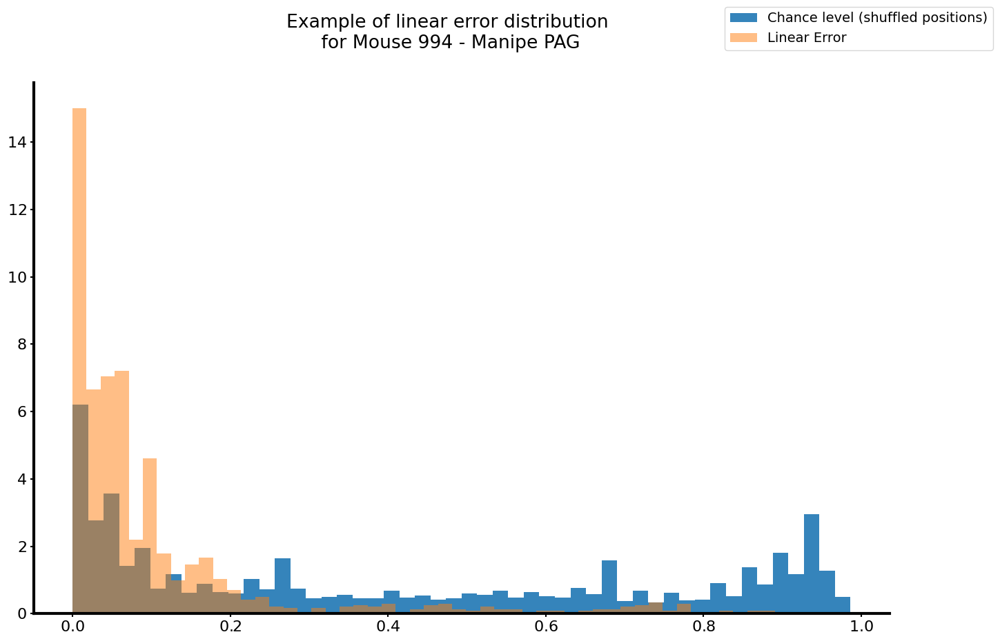

In [156]:
phase = "pre"
for i in range(
    loader_all.results_df.query(
        "winMS == 252 and stride == '4' and phase == @phase"
    ).shape[0]
):
    fig, ax = plt.subplots(1)

    ax.hist(
        error_lin,
        alpha=0.9,
        bins=50,
        density=True,
        label="Chance level (shuffled positions)",
    )
    ax.hist(
        np.abs(
            loader_all.results_df.query(
                "winMS == 252 and stride == '4' and phase == @phase"
            )["linPred"].iloc[i][
                loader_all.results_df.query(
                    "winMS == 252 and stride == '4' and phase == @phase"
                )["speedMask"].iloc[i]
            ]
            - loader_all.results_df.query(
                "winMS == 252 and stride == '4' and phase == @phase"
            )["linTruePos"].iloc[i][
                loader_all.results_df.query(
                    "winMS == 252 and stride == '4' and phase == @phase"
                )["speedMask"].iloc[i]
            ]
        ),
        bins=50,
        density=True,
        label="Linear Error",
        alpha=0.5,
    )

    fig.legend()
    fig.suptitle(
        "Example of linear error distribution\n for Mouse "
        + loader_all.results_df.query(
            "winMS == 252 and stride == '4' and phase == @phase"
        )["mouse"].iloc[i]
        + " - Manipe "
        + loader_all.results_df.query(
            "winMS == 252 and stride == '4' and phase == @phase"
        )["manipe"].iloc[i]
    )
    plt.show()

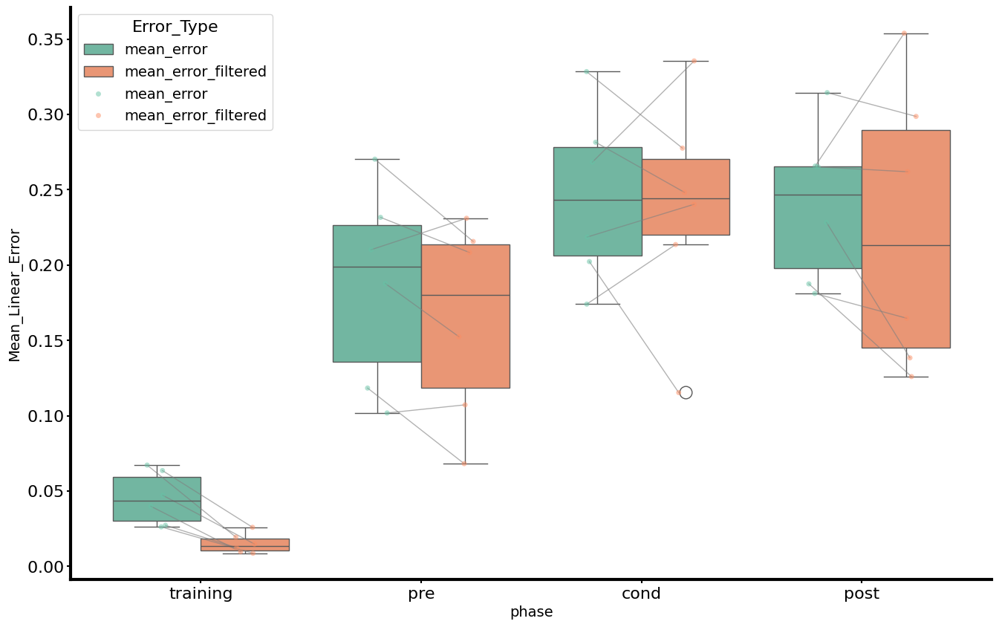

In [59]:
fig, ax = plt.subplots()
sns.boxplot(
    data=my_df,
    x="phase",
    y="Mean_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    ax=ax,
)
ann_strip = sns.stripplot(
    data=my_df,
    x="phase",
    y="Mean_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    dodge=True,
    color="black",
    alpha=0.5,
    ax=ax,
)
winMS_list = ["mean_error", "mean_error_filtered"]


# connect points per mouse with lines INSIDE EACH hue, ie only connect in the same phase from one error type to the other error type
def connect_points(
    strip, data_df, color="gray", value_vars=None, var_name=None, value_name=None
):
    paths = strip.collections
    x_ticks = (
        phase_list if phase_list is not None else ["training", "pre", "cond", "post"]
    )

    coords = {}
    for i, (phase, winMS) in enumerate([(s, p) for s in x_ticks for p in value_vars]):
        coll = paths[i]
        offsets = coll.get_offsets()
        coords[(phase, winMS)] = offsets

    # Connect across phases or winMSs
    if len(value_vars) > 1:
        for (mouse, phase, _), sub in data_df.groupby(
            ["mouse_manipe", "phase", "phase"]
        ):
            if set(sub[var_name]) >= set(value_vars):
                pts = []
                for _, row in sub.iterrows():
                    phase_val = str(row["phase"])
                    winMS_val = row[var_name]
                    arr = coords[(phase_val, winMS_val)]
                    idx = np.argmin(np.abs(arr[:, 1] - row[value_name]))
                    pts.append(arr[idx])
                if len(pts) == len(value_vars):
                    ax.plot(
                        [p[0] for p in pts],
                        [p[1] for p in pts],
                        color=color,
                        alpha=0.6,
                        linewidth=1,
                    )
    else:
        winMS = value_vars[0]
        for (mouse, phase), sub in data_df.query(f"{var_name} == @winMS").groupby(
            ["mouse_manipe", "phase"]
        ):
            pts = []
            for _, row in sub.iterrows():
                phase_val = str(row["phase"])
                arr = coords[(phase_val, winMS)]
                idx = np.argmin(np.abs(arr[:, 1] - row["mean_error"]))
                pts.append(arr[idx])
            if len(pts) > 1:
                pts = sorted(pts, key=lambda x: x[0])
                ax.plot(
                    [p[0] for p in pts],
                    [p[1] for p in pts],
                    color=color,
                    alpha=0.6,
                    linewidth=1,
                )


connect_points(
    strip=ann_strip,
    data_df=my_df,
    color="gray",
    value_vars=winMS_list,
    var_name="Error_Type",
    value_name="Mean_Linear_Error",
)
# fig.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.png"), dpi=300)
# fig.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.svg"))

# old

In [ ]:
# plot a correlation plot between asymmetry_inded and mean_error, lin_error. hue by ann_mode and phase
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'"),
    x_vars=["training_asymmetry_index"],
    y_vars=["asymmetry_on_predicted"],
    hue="mouse",
    height=4.5,
    aspect=2,
)

In [ ]:
loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'")[
    ["mouse", "winMS"]
].apply(tuple, axis=1)

In [ ]:
loader_all.results_df.asymmetry_bias

In [ ]:
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'")[
        [
            "mouse",
            "real_asymmetry_ratio",
            "training_asymmetry_index",
            "predicted_asymmetry_ratio_normalized",
            "asymmetry_bias",
            "asymmetry_on_predicted",
        ]
    ],
    x_vars=["training_asymmetry_index"],
    hue="mouse",
    height=4.5,
    aspect=1.5,
)

In [ ]:
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'")[
        loader_all.results_df.columns[
            loader_all.results_df.columns.str.contains("asymmetry|error|mouse")
        ]
    ],
    hue="mouse",
    height=4.5,
    aspect=1.5,
)

In [ ]:
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'"),
    hue="mouse",
)

In [ ]:
# plot a correlation plot between asymmetry_inded and mean_error, lin_error. hue by ann_mode and phase
from turtle import title


sns.pairplot(
    loader_all.results_df.query(
        "ann_mode == 'Transformer' & phase == 'pre' & winMS == 252"
    ),
    x_vars=["training_asymmetry_index"],
    y_vars=["mean_error", "lin_error"],
    hue="mouse",
    height=4.5,
    aspect=2,
)

In [ ]:
# plot a correlation plot between asymmetry_inded and mean_error, lin_error. hue by ann_mode and phase.
sns.pairplot(
    loader_all.results_df[
        (loader_all.results_df.ann_mode == "Transformer")
        & (loader_all.results_df.phase != "cond")
    ],
    x_vars=["training_asymmetry_index"],
    y_vars=["mean_error_selected", "lin_error_selected"],
    hue="winMS",
    height=4.5,
    aspect=1.5,
)

In [ ]:
import seaborn as sns

# plot a correlation plot between asymmetry_inded and mean_error, lin_error. hue by ann_mode and phase.
sns.pairplot(
    df[(df.ann_mode == "Transformer") & (df.phase == "training")],
    x_vars=["asymmetry_index"],
    y_vars=["mean_error", "lin_error", "mean_error_selected", "lin_error_selected"],
    hue="winMS",
    kind="reg",
    diag_kind="kde",
)
sns.pairplot(
    df[(df.ann_mode == "Transformer")],
    x_vars=["asymmetry_index"],
    y_vars=["mean_error", "lin_error", "mean_error_selected", "lin_error_selected"],
    hue="phase",
    kind="reg",
    diag_kind="kde",
)
sns.pairplot(
    df[(df.ann_mode == "Transformer")],
    x_vars=["asymmetry_index"],
    y_vars=["predLossThreshold"],
    hue="phase",
    kind="reg",
    diag_kind="kde",
)

In [ ]:
from importData.gui_elements import AnimatedPositionPlotter

In [ ]:
%matplotlib qt

In [ ]:
plt.close("all")

In [ ]:
results_dict["Transformer"]["1199PAG"]["pre"].render_frame_static(
    frame=40,
    pair_points=True,
    l_function=Mouse_Results.l_function,
    linear_position_mode=True,
    alpha_delta_line=0.75,
    blit=True,
)

In [ ]:
results_dict["Transformer"]["1199PAG"]["pre"].save_video_frame_with_pool(
    output_dir="/home/mickey/download/bonjourPool",
    pair_points=True,
    interval=70,
    l_function=Mouse_Results.l_function,
    linear_position_mode=True,
    alpha_delta_line=0.75,
    blit=True,
)

results_dict["Transformer"]["1199PAG"]["pre"].save_video_frame_with_joblib(
    output_dir="/home/mickey/download/bonjourLib",
    pair_points=True,
    interval=70,
    l_function=Mouse_Results.l_function,
    linear_position_mode=True,
    alpha_delta_line=0.75,
    blit=True,
)

In [ ]:
results_dict["Transformer"]["1199PAG"]["pre"].show_movie(
    blit=True,
    pair_points=True,
    interval=200,
    l_function=Mouse_Results.l_function,
    linear_position_mode=True,
    alpha_delta_line=0.75,
    be_fast=False,
)

In [ ]:
for ann_mode, dir, name_exp in zip(
    ["Transformer", "LSTM"],
    [Dir_Transformer, Dir_LSTM],
    [nameExp_Transformer, nameExp_LSTM],
):
    for mouse, manipe in zip(mice_names, mice_manipes):
        for suffix, phase in zip(
            ["_pre", "_training", "_cond"], ["pre", "training", "cond"]
        ):
            skip_to_next_suffix = False
            print(f"Processing mouse {mouse} with manip {manipe}")
            try:
                Mouse_Results = results_dict[ann_mode][mouse + manipe][phase]
            except KeyError:
                print(
                    f"KeyError for mouse {mouse} with manipulation {manipe} in phase {phase}"
                )
                skip_to_next_suffix = True
                continue

            if skip_to_next_suffix:
                continue
            # results_dict[ann_mode][mouse].error_matrix_linerrors_by_speed(suffixes = ["_pre", "_training", "_cond"])
            # Mouse_Results.predLoss_linError()

            for i, winms in enumerate(Mouse_Results.windows):
                skip_to_next_win = False
                idx = Mouse_Results.windows.index(winms)
                win_value = Mouse_Results.windows_values[idx]
                try:
                    quantile_predLoss = np.quantile(
                        Mouse_Results.resultsNN_phase[suffix]["predLoss"][idx], 0.3
                    )
                    selection = (
                        Mouse_Results.resultsNN_phase[suffix]["predLoss"][idx]
                        < quantile_predLoss
                    )
                except KeyError:
                    print(
                        f"KeyError for quantile_predLoss in mouse {mouse}, manipulation {manipe}, phase {phase}"
                    )
                    skip_to_next_win = True
                    continue

                if skip_to_next_win:
                    continue

                plotter_vanilla = AnimatedPositionPlotter(
                    Mouse_Results.data_helper[winms],
                    positions=Mouse_Results.resultsNN_phase[suffix]["truePos"][idx],
                    predicted=Mouse_Results.resultsNN_phase[suffix]["fullPred"][idx],
                    windowSizeMS=win_value,
                    fps=30,
                    target=target,
                    mouse_name=mouse,
                    manipe=manipe,
                    nameExp=name_exp,
                    interval=70,
                    pair_points=True,
                    l_function=Mouse_Results.l_function,
                    linear_position_mode=True,
                    blit=True,
                    setup_plot=True,
                    block=False,
                )

                plotter_vanilla.show()
                plotter = AnimatedPositionPlotter(
                    Mouse_Results.data_helper[winms],
                    positions=Mouse_Results.resultsNN_phase[suffix]["truePos"][idx],
                    predicted=Mouse_Results.resultsNN_phase[suffix]["fullPred"][idx],
                    predLossMask=selection,
                    windowSizeMS=win_value,
                    fps=30,
                    target=target,
                    mouse_name=mouse,
                    manipe=manipe,
                    nameExp=name_exp,
                    interval=70,
                    pair_points=True,
                    l_function=Mouse_Results.l_function,
                    linear_position_mode=True,
                    blit=True,
                    setup_plot=True,
                    block=False,
                )

                if not os.path.exists(os.path.join(main_dir, ann_mode, mouse + manipe)):
                    print(f"Creating directory: {os.path.join(main_dir, ann_mode)}")
                    os.mkdir(os.path.join(main_dir, ann_mode))
                if not os.path.exists(os.path.join(main_dir, ann_mode, mouse + manipe)):
                    print(
                        f"Creating directory: {os.path.join(main_dir, ann_mode, mouse + manipe)}"
                    )
                    os.mkdir(os.path.join(main_dir, ann_mode, mouse + manipe))

                if not os.path.exists(
                    os.path.join(
                        main_dir,
                        ann_mode,
                        mouse + manipe,
                        f"{mouse}_{manipe}_phase_{phase}_win_{win_value}.mp4",
                    )
                ):
                    try:
                        animation_tmp_vanilla = plotter_vanilla.create_animation(
                            repeat=False,
                            save_path=os.path.join(
                                main_dir,
                                ann_mode,
                                mouse + manipe,
                                f"{mouse}_{manipe}_phase_{phase}_win_{win_value}.mp4",
                            ),
                        )
                    except KeyError:
                        continue

                if not os.path.exists(
                    os.path.join(
                        main_dir,
                        ann_mode,
                        mouse + manipe,
                        f"filtered_{mouse}_{manipe}_phase_{phase}_win_{win_value}.mp4",
                    )
                ):
                    print(
                        f"Creating animation for filtered data: {mouse}_{manipe}_phase_{phase}"
                    )
                    try:
                        animation_tmp = plotter.create_animation(
                            repeat=False,
                            save_path=os.path.join(
                                main_dir,
                                ann_mode,
                                mouse + manipe,
                                f"filtered_{mouse}_{manipe}_phase_{phase}_win_{win_value}.mp4",
                            ),
                        )
                    except KeyError:
                        print(
                            f"KeyError for filtered animation: {mouse}_{manipe}_win_{win_value}_phase_{phase}"
                        )
                        continue

print("All animations created successfully.")

In [ ]:
%matplotlib qt

In [ ]:
Mouse_Results.load_results(force=True)

In [ ]:
Mouse_Results.load_results(force=True, phase="training", which="bayes")

In [ ]:
Mouse_Results.load_results(force=True, phase="cond")

In [ ]:
Mouse_Results.data_helper["108"].phase

In [ ]:
%matplotlib qt

In [ ]:
Mouse_Results.resultsNN.keys()

In [ ]:
inferring = Mouse_Results.resultsNN["fullPred"][1]
linferring = Mouse_Results.resultsNN["linPred"][0]
pos = Mouse_Results.resultsNN["truePos"][1]
lpos = Mouse_Results.resultsNN["linTruePos"][0]

error = np.array(
    [np.linalg.norm(inferring[i, :] - pos[i, :]) for i in range(inferring.shape[0])]
)  # eucledian distance

In [ ]:
error_mask = error > 0.6

In [ ]:
linferring.min()

In [ ]:
plt.hist2d(
    lpos,
    linferring,
    cmap="viridis",
    bins=[np.linspace(0, 1, 50), np.linspace(0, 1, 50)],
)

In [ ]:
plt.hist2d(inferring[error_mask, 0], inferring[error_mask, 1], cmap="viridis")
plt.colorbar()

In [ ]:
np.where(
    np.linalg.norm(
        [Mouse_Results.resultsNN["fullPred"][0], Mouse_Results.resultsNN["truePos"][0]]
    )
    > 0
)[0]

In [ ]:
Mouse_Results.resultsNN.keys()

In [ ]:
Mouse_Results.show_results(phase="training", save=True)

In [ ]:
from importData.gui_elements import AnimatedPositionPlotter

In [ ]:
%matplotlib qt

In [ ]:
Mouse_Results.resultsNN

In [ ]:
plotter = AnimatedPositionPlotter(
    Mouse_Results.data_helper["108"],
    positions=Mouse_Results.resultsNN["truePos"][0],
    predicted=Mouse_Results.resultsNN["fullPred"][0],
    speedMaskArray=Mouse_Results.resultsNN["speedMask"][0],
    windowSizeMS=108,
    fps=30,
    target=target,
    mouse_name=mouse,
    manipe=manipe,
    nameExp=nameExp,
)

anim = plotter.show(interval=10, repeat=True, block=True, with_ref_bg=False)

In [ ]:
Mouse_Results.data_helper["108"]

In [ ]:
Mouse_Results.ann["108"].fix_linearizer(
    Mouse_Results.Linearizer.mazePoints, Mouse_Results.Linearizer.tsProj
)

In [ ]:
Mouse_Results.ann["108"].setup_dynamic_dense_loss(
    Mouse_Results.data_helper["108"].fullBehavior, alpha=1
)

In [ ]:
%matplotlib qt

In [ ]:
print_results.print_results(
    Mouse_Results.ann["108"].folderResult,
    windowSizeMS=108,
    show=True,
    lossSelection=0.1,
    euclidean=False,
    target="pos",
    phase=None,
    training_data=Mouse_Results.ann["108"].training_data,
    save=False,
    l_function=Mouse_Results.l_function,
)

In [ ]:
%matplotlib qt

In [ ]:
Mouse_Results

In [ ]:
%matplotlib inline

In [ ]:
%matplotlib qt

In [ ]:
from importData.epochs_management import inEpochsMask

trainMask = inEpochsMask(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][:, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Times"]["trainEpochs"],
)
testMask = inEpochsMask(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][:, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Times"]["testEpochs"],
)
speedMask = Mouse_Results.data_helper["108"].fullBehavior["Times"]["speedFilter"]

mask = (trainMask | testMask) * speedMask

In [ ]:
plt.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][:, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][:, 0],
    "o",
    markersize=1,
    alpha=0.5,
    c="r",
)
plt.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][trainMask, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][trainMask, 0],
    "o",
    markersize=1,
    alpha=1,
)
plt.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][trainMask, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][trainMask, 1],
    "o",
    markersize=1,
    alpha=1,
)

In [ ]:
training_data = Mouse_Results.data_helper["108"].fullBehavior["Positions"][mask]
training_data.shape

In [ ]:
plt.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][:, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][:, 0],
    "o",
    markersize=1,
    alpha=0.3,
    c="r",
)
plt.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][mask, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][mask, 0],
    "o",
    markersize=1,
    alpha=1,
)
plt.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][mask, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][mask, 1],
    "o",
    markersize=1,
    alpha=1,
)

In [ ]:
Mouse_Results.show_results(
    save=False,
    winMS=108,
    phase="training",
    training_data=training_data,
    lossSelection=0.1,
    l_function=Mouse_Results.l_function,
)

In [ ]:
Mouse_Results.load_data(suffix="_pre")

In [ ]:
Mouse_Results.resultsNN

In [ ]:
Mouse_Results.test_bayes()

In [ ]:
Mouse_Results.fig_example_XY(108)

In [ ]:
Mouse_Results.fig_example_linear_filtered(fprop=0.1)

In [ ]:
Mouse_Results.compare_nn_bayes(108, isShow=True)

In [ ]:
Mouse_Results.mean_euclerrors()

In [ ]:
Mouse_Results.predLoss_vs_trueLoss()

In [ ]:
Mouse_Results.nnVSbayes()

In [ ]:
Mouse_Results.mean_linerrors()

In [ ]:
Mouse_Results.predLoss_linError(speed="slow", step=1e-6)

In [ ]:
Mouse_Results.predLoss_euclError(step=1e-6, scaled=False)

In [ ]:
Mouse_Results.fig_example_2d(speed="fast")

In [ ]:
Mouse_Results.hist_linerrors(speed="fast")

In [ ]:
Mouse_Results.Params.phase

In [ ]:
Mouse_Results.run_spike_alignment(useTrain=False)

In [ ]:
Mouse_Results.plot_pc_tuning_curve_and_predictions(ws=108)

In [ ]:
%matplotlib qt

In [ ]:
Mouse_Results.DataHelper.fullBehavior["positionTime"]

In [ ]:
Mouse_Results.load_results(force=True, phase="pre")

In [ ]:
from importData.epochs_management import inEpochs


fig, ax = plt.subplots()

ax1 = plt.subplot2grid((2, 1), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), rowspan=1, colspan=1)

trainMask = inEpochs(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"],
    Mouse_Results.data_helper["108"].fullBehavior["Times"]["trainEpochs"],
)[0]
testMask = inEpochs(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"],
    Mouse_Results.data_helper["108"].fullBehavior["Times"]["testEpochs"],
)[0]

ax1.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][trainMask],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][trainMask, 0],
    "--.",
    color="black",
    label="training",
    markersize=6,
)
ax1.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][testMask],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][testMask, 0],
    "--.",
    color="red",
    label="testing",
    markersize=6,
)

ax2.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][trainMask],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][trainMask, 1],
    "--.",
    color="black",
    label="training",
    markersize=6,
)
ax2.plot(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"][testMask],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][testMask, 1],
    "--.",
    color="red",
    label="testing",
    markersize=6,
)

In [ ]:
print_results.print_results(
    Mouse_Results.folderResult, show=True, windowSizeMS=108, phase=phase, target=target
)

In [ ]:
Mouse_Results.data_helper["108"].fullBehavior["Times"]["SessionEpochs"]["pre"]

In [ ]:
plt.plot(np.arange(0, 1000, 1), np.random.rand(1000), label="test")

In [ ]:
plt.plot(testEpochs[0])
plt.show()

In [ ]:
from importData.epochs_management import inEpochs

testEpochs = inEpochs(
    Mouse_Results.data_helper["108"].fullBehavior["positionTime"].flatten(),
    Mouse_Results.data_helper["108"].fullBehavior["Times"]["testEpochs"],
)[0]
plt.plot(
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][testEpochs, 0],
    Mouse_Results.data_helper["108"].fullBehavior["Positions"][testEpochs, 1],
)
plt.show()

In [ ]:
Mouse_Results.projects["108"]

In [ ]:
print(Mouse_Results.projects["108"])

In [ ]:
Mouse_Results.load_trainers()

In [ ]:
Mouse_Results.load_results(force=True)

In [ ]:
%matplotlib inline

In [ ]:
NNTrainer = Training.LSTMandSpikeNetwork(
    ProjectPath,
    Parameters[winMS],
    deviceName=deviceName,
    debug=False,
    phase=phase,
)

In [ ]:
DataHelper.resultsPath

In [ ]:
featurePred = pd.read_csv(
    os.path.join(DataHelper.resultsPath, f"featurePred_{phase}.csv")
).to_numpy()
featureTrue = pd.read_csv(
    os.path.join(DataHelper.resultsPath, f"featureTrue_{phase}.csv")
).to_numpy()
lossPred = pd.read_csv(
    os.path.join(DataHelper.resultsPath, f"lossPred_{phase}.csv")
).to_numpy()
speedMask = pd.read_csv(
    os.path.join(DataHelper.resultsPath, f"speedMask_{phase}.csv")
).to_numpy()

linearPred = pd.read_csv(
    os.path.join(DataHelper.resultsPath, f"linearPred_{phase}.csv")
).to_numpy()
linearTrue = pd.read_csv(
    os.path.join(DataHelper.resultsPath, f"linearTrue_{phase}.csv")
).to_numpy()

In [ ]:
featurePred = featurePred[:, -2]
featureTrue = featureTrue[:, -2]
lossPred = lossPred[:, -1]
speedMask = speedMask[:, -1]

In [ ]:
DataHelper.fullBehavior["Times"]["testEpochs"]

In [ ]:
from importData.epochs_management import inEpochs, inEpochsMask

timeStepPred = DataHelper.fullBehavior["positionTime"][
    inEpochs(
        DataHelper.fullBehavior["positionTime"][:, 0],
        DataHelper.fullBehavior["Times"]["testEpochs"],
    )
]

In [ ]:
timeStepPred

In [ ]:
plt.plot(featureTrue)

In [ ]:
qControltmp = lossPred.copy()
temp = lossPred.argsort(axis=0)

In [ ]:
thresh = np.squeeze(qControltmp[temp[int(len(temp) * 0.5)]])

In [ ]:
np.quantile(lossPred, 0.5)

In [ ]:
selection = np.squeeze(qControltmp < thresh)

In [ ]:
inferring = featurePred
pos = featureTrue

In [ ]:
selection

In [ ]:
temp

In [ ]:
%matplotlib inline

In [ ]:
lossPred

In [ ]:
plt.hist(featureTrue, label="True Feature")
plt.hist(featurePred, label="Predicted Feature")
plt.legend()

In [ ]:
for quantile in [0.1, 0.2, 0.3, 0.4, 0.5]:
    qControl = np.quantile(lossPred, quantile)
    plt.figure()
    plt.title(f"Quantile {quantile}")
    plt.plot(
        featurePred[lossPred <= qControl],
        np.abs(featureTrue[lossPred <= qControl] - featurePred[lossPred <= qControl]),
        "k.",
    )
    mean_error = np.mean(
        np.abs(featureTrue[lossPred <= qControl] - featurePred[lossPred <= qControl])
    )
    plt.axhline(
        mean_error, color="r", linestyle="--", label=f"Mean Error: {mean_error:.2f}"
    )
    plt.xlabel("Predicted Feature")

In [ ]:
DataHelper.globalResultsPath

In [ ]:
reload(print_results)
print_results.print_results(
    NNTrainer.folderResult,
    windowSizeMS=108,
    lossSelection=0.5,
    target="pos",
    phase=phase,
)

## waveform comparator

In [ ]:
from importData.compareSpikeFiltering import WaveFormComparator

In [ ]:
Mouse_Results.run_spike_alignment(force=True)

In [ ]:
waveform = WaveFormComparator(
    Mouse_Results.Project,
    Mouse_Results.Params,
    Mouse_Results.DataHelper.fullBehavior,
    windowSizeMS=Mouse_Results.windowSizeMS,
    useTrain=True,
)

In [ ]:
waveform.save_alignment_tools(
    Mouse_Results.bayes,
    Mouse_Results.l_function,
    windowSizeMS=Mouse_Results.windowSizeMS,
)

## temp

In [ ]:
projectPath = Project(
    os.path.join(
        Dir[
            (Dir["name"].str.contains(mouse)) & (Dir["manipe"].str.contains(manipe))
        ].path.values[0],
        "amplifier.xml",
    ),
    nameExp=nameExp,
    windowSize=0.108,
)

In [ ]:
projectPath.experimentPath

In [ ]:
windowSizeMS

In [ ]:
DataHelper = DataHelperClass(
    projectPath.xml,
    windowSize=0.108,
    mode=mode,
    target=target,
    phase=phase,
    nameExp=nameExp,
)

In [ ]:
DataHelper.folderResult

In [ ]:
Linearizer = UMazeLinearizer(projectPath.folder, phase=phase)

In [ ]:
%matplotlib qt

In [ ]:
Linearizer.verify_linearization(
    DataHelper.positions / DataHelper.maxPos(), projectPath.folder, overwrite=False
)

In [ ]:
l_function = Linearizer.pykeops_linearization

In [ ]:
DataHelper.get_true_target(l_function, in_place=True, show=True)

In [ ]:
windowSizeMS

In [ ]:
Parameters = Params(
    helper=DataHelper,
    windowSize=0.108,
    nEpochs=nEpochs,
    phase=phase,
    batchSize=256,
    save_json=True,
)

In [ ]:
Parameters.folderResult

In [ ]:
Parameters.resultsPath

In [ ]:
save_project_to_pickle(projectPath)

In [ ]:
save_project_to_pickle(
    Parameters, output=os.path.join(Parameters.resultsPath, "Parameters.pkl")
)